# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

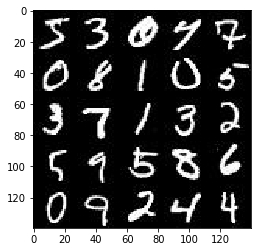

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

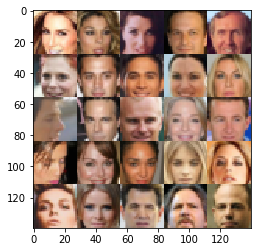

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0


c:\users\gabe\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.
  


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    
    real_input = tf.placeholder(tf.float32, (None,image_width, image_height, image_channels), name = "real_input")
    z_input = tf.placeholder(tf.float32,(None,z_dim), name = "z_input")
    learning_rate = tf.placeholder(tf.float32, name = "learning_rate")

    return (real_input, z_input, learning_rate)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    
    with tf.variable_scope("discriminator", reuse = reuse):
        
        alpha = 0.2
        keep_prob = 0.8
        
        # original image is 28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, strides = 2, padding = "same", kernel_initializer = tf.contrib.layers.xavier_initializer_conv2d())
        relu1 = tf.maximum(alpha * x1, x1)
        relu1 = tf.nn.dropout(relu1, keep_prob = keep_prob)
        
        print(relu1)
        
        # image is 14x14x6
        x2 = tf.layers.conv2d(x1, 128, 5, strides = 2, padding = "same", kernel_initializer = tf.contrib.layers.xavier_initializer_conv2d())
        bn2 = tf.layers.batch_normalization(x2, training = True)
        relu2 = tf.maximum(alpha * x2, x2)        
        relu2 = tf.nn.dropout(relu2, keep_prob = keep_prob)
        
        print(relu2)
        
        # image is 7x7x12
        x3 = tf.layers.conv2d(relu2, 256, 5, strides =2, padding = "same", kernel_initializer = tf.contrib.layers.xavier_initializer_conv2d())
        bn3 = tf.layers.batch_normalization(x3, training = True)
        relu3 = tf.maximum(alpha * x3, x3)        
        relu3 = tf.nn.dropout(relu3, keep_prob = keep_prob)
        
        print (relu3)
        
        # image is 3x3x24
        flat = tf.reshape(relu3, (-1, 16*16*256))
        
        print (flat)
        
        logits = tf.layers.dense(flat, 1)    
        output = tf.sigmoid(logits)
        
    return (output, logits)

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tensor("dropout/mul:0", shape=(?, 14, 14, 64), dtype=float32)
Tensor("dropout_1/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("dropout_2/mul:0", shape=(?, 4, 4, 256), dtype=float32)
Tensor("Reshape:0", shape=(?, 65536), dtype=float32)
Tensor("dropout_3/mul:0", shape=(?, 14, 14, 64), dtype=float32)
Tensor("dropout_4/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("dropout_5/mul:0", shape=(?, 4, 4, 256), dtype=float32)
Tensor("Reshape_1:0", shape=(?, 65536), dtype=float32)
Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [10]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    
    with tf.variable_scope("generator", reuse = not is_train):
        
        alpha = 0.1
        keep_prob =0.5
        
        # flat image
        x1 = tf.layers.dense(z, 7*7*512)
        
        x1 = tf.reshape(x1, (-1,7,7,512))
        x1 = tf.layers.batch_normalization(x1, training = True)
        x1 = tf.maximum(alpha * x1, x1)
        x1 = tf.nn.dropout(x1, keep_prob = keep_prob)
        
        print(x1)

        x2 = tf.layers.conv2d_transpose(x1, 256, 5,strides = 1, padding = "same")
        x2 = tf.layers.batch_normalization(x2, training = True)
        x2 = tf.maximum(alpha *x2, x2) 
        x2 = tf.nn.dropout(x2, keep_prob = keep_prob)   
        
        print(x2)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides = 1, padding = "same")
        x3 = tf.layers.batch_normalization(x3, training = True)
        x3 = tf.maximum(alpha * x3, x3)
        x3 = tf.nn.dropout(x3, keep_prob = keep_prob)

        print (x3)
        
        x4 = tf.layers.conv2d_transpose(x3, 64, 5, strides = 1, padding = "same")
        x4 = tf.layers.batch_normalization(x4, training = True)
        x4 = tf.maximum(alpha * x4, x4)
        x4 = tf.nn.dropout(x4, keep_prob = keep_prob)

        print (x4)
        
        x5 = tf.layers.conv2d_transpose(x4, 32, 5, strides = 2, padding = "same")
        x5 = tf.layers.batch_normalization(x5, training = True)
        x5 = tf.maximum(alpha * x5, x5)
        x5 = tf.nn.dropout(x5, keep_prob = keep_prob)

        print (x5)
        
        logits = tf.layers.conv2d_transpose(x5, out_channel_dim, 5, strides = 2, padding = "same")
        out = tf.tanh(logits)
        
        print(out)
        
    return out

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tensor("dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("Tanh:0", shape=(?, 28, 28, 5), dtype=float32)
Tensor("dropout_5/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("dropout_6/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("dropout_7/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("dropout_8/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("dropout_9/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("Tanh_1:0", shape=(?, 28, 28, 5), dtype=float32)
Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [14]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    import numpy as np
    
    generator_model = generator(input_z, out_channel_dim, is_train = True)
    
    outputs_real, logits_real = discriminator(input_real)
    outputs_fake, logits_fake = discriminator(generator_model, reuse = True)
    
    discriminator_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = logits_real, labels = tf.ones_like(outputs_real)*0.9))
    discriminator_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits (logits = logits_fake, labels = tf.zeros_like(outputs_fake)))
    generator_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits( logits = logits_fake, labels = tf.ones_like(outputs_fake)))

    discriminator_loss = discriminator_loss_real + discriminator_loss_fake
    
    return (discriminator_loss, generator_loss)

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tensor("generator/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator/Tanh:0", shape=(?, 28, 28, 4), dtype=float32)
Tensor("discriminator/dropout/mul:0", shape=(?, 14, 14, 64), dtype=float32)
Tensor("discriminator/dropout_1/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("discriminator/dropout_2/mul:0", shape=(?, 4, 4, 256), dtype=float32)
Tensor("discriminator/Reshape:0", shape=(?, 65536), dtype=float32)
Tensor("discriminator_1/dropout/mul:0", shape=(?, 14, 14, 64), dtype=float32)
Tensor("discriminator_1/dropout_1/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("discriminator_1/dropout_2/mul:0", shape=(?, 4, 4, 256), dtype=float32)
Tensor("discriminator_1/Reshape:0", shap

### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [15]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    training_variables = tf.trainable_variables()
    discriminator_variables = [var for var in training_variables if var.name.startswith("discriminator")]
    generator_variables = [var for var in training_variables if var.name.startswith("generator")]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        discriminator_training = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(d_loss, var_list = discriminator_variables)
        generator_training = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(g_loss, var_list = generator_variables)
    
    
    return (discriminator_training, generator_training)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [17]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [18]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model

    sample, losses = [], []
    steps = 0
    
    image_width = data_shape[1]
    image_height = data_shape[2]
    image_depth = data_shape[3]
    
    input_real, input_z, lr = model_inputs(image_width, image_height, image_depth, z_dim)
    
    discriminator_loss, generator_loss = model_loss(input_real, input_z, image_depth)
    
    discriminator_training, generator_training = model_opt(discriminator_loss, generator_loss, learning_rate, beta1)
    
    step1 = 30
    step2 = 5
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                
                # TODO: Train Model
                
                steps += 1
                
                batch_images = batch_images * 2
                
                batch_z = np.random.uniform(-1,1, size = (batch_size, z_dim))
                
                _ = sess.run(discriminator_training, feed_dict = {input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(generator_training, feed_dict = {input_z: batch_z, input_real: batch_images, lr: learning_rate})
                _ = sess.run(generator_training, feed_dict = {input_z: batch_z, input_real: batch_images, lr: learning_rate})

                if steps % step1 == 0:
                    show_generator_output(sess=sess, n_images = 10, input_z = input_z, out_channel_dim = image_depth, image_mode = data_image_mode)
                
                if steps % step2 == 0:
                    train_loss_d = discriminator_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = generator_loss.eval({input_z: batch_z})
                    
                    print ("Epoch {}/{}:" .format(epoch_i+1,epoch_count),
                          "Discriminator Loss: {:4f}" .format(train_loss_d),
                          "Generator Loss: {:4f}" .format(train_loss_g),
                          "Difference: {:4f}" . format(train_loss_g - train_loss_d))                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Tensor("generator/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)
Tensor("discriminator/dropout/mul:0", shape=(?, 14, 14, 64), dtype=float32)
Tensor("discriminator/dropout_1/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("discriminator/dropout_2/mul:0", shape=(?, 4, 4, 256), dtype=float32)
Tensor("discriminator/Reshape:0", shape=(?, 65536), dtype=float32)
Tensor("discriminator_1/dropout/mul:0", shape=(?, 14, 14, 64), dtype=float32)
Tensor("discriminator_1/dropout_1/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("discriminator_1/dropout_2/mul:0", shape=(?, 4, 4, 256), dtype=float32)
Tensor("discriminator_1/Reshape:0", shap

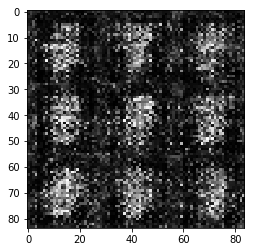

Epoch 1/2: Discriminator Loss: 1.211055 Generator Loss: 0.651993 Difference: -0.559062
Epoch 1/2: Discriminator Loss: 1.269350 Generator Loss: 0.603288 Difference: -0.666063
Epoch 1/2: Discriminator Loss: 1.520267 Generator Loss: 0.477985 Difference: -1.042282
Epoch 1/2: Discriminator Loss: 1.719379 Generator Loss: 0.454398 Difference: -1.264980
Epoch 1/2: Discriminator Loss: 1.344662 Generator Loss: 0.705799 Difference: -0.638863
Epoch 1/2: Discriminator Loss: 1.107620 Generator Loss: 0.943905 Difference: -0.163715
Tensor("generator_2/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_2/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_2/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_2/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_2/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_2/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


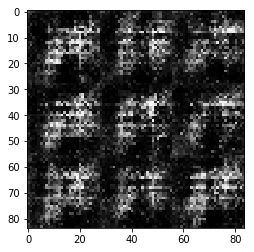

Epoch 1/2: Discriminator Loss: 1.194260 Generator Loss: 0.962260 Difference: -0.232000
Epoch 1/2: Discriminator Loss: 2.420611 Generator Loss: 0.164762 Difference: -2.255850
Epoch 1/2: Discriminator Loss: 1.323742 Generator Loss: 0.569332 Difference: -0.754409
Epoch 1/2: Discriminator Loss: 1.616041 Generator Loss: 0.502338 Difference: -1.113703
Epoch 1/2: Discriminator Loss: 1.221211 Generator Loss: 0.741654 Difference: -0.479557
Epoch 1/2: Discriminator Loss: 1.324945 Generator Loss: 0.650044 Difference: -0.674902
Tensor("generator_3/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_3/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_3/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_3/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_3/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_3/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


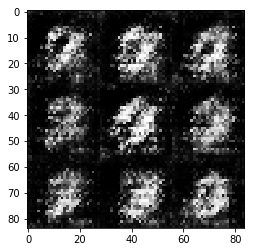

Epoch 1/2: Discriminator Loss: 1.229242 Generator Loss: 0.778062 Difference: -0.451180
Epoch 1/2: Discriminator Loss: 1.646477 Generator Loss: 0.465521 Difference: -1.180956
Epoch 1/2: Discriminator Loss: 1.629485 Generator Loss: 0.392738 Difference: -1.236747
Epoch 1/2: Discriminator Loss: 1.455230 Generator Loss: 0.483893 Difference: -0.971336
Epoch 1/2: Discriminator Loss: 1.931414 Generator Loss: 0.272409 Difference: -1.659005
Epoch 1/2: Discriminator Loss: 1.183731 Generator Loss: 1.054549 Difference: -0.129182
Tensor("generator_4/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_4/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_4/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_4/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_4/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_4/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


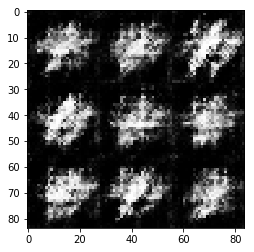

Epoch 1/2: Discriminator Loss: 1.167739 Generator Loss: 0.825044 Difference: -0.342695
Epoch 1/2: Discriminator Loss: 1.391745 Generator Loss: 0.689023 Difference: -0.702722
Epoch 1/2: Discriminator Loss: 1.357259 Generator Loss: 0.677840 Difference: -0.679419
Epoch 1/2: Discriminator Loss: 1.099699 Generator Loss: 1.550143 Difference: 0.450444
Epoch 1/2: Discriminator Loss: 1.451477 Generator Loss: 0.650286 Difference: -0.801191
Epoch 1/2: Discriminator Loss: 1.301149 Generator Loss: 0.707984 Difference: -0.593165
Tensor("generator_5/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_5/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_5/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_5/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_5/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_5/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


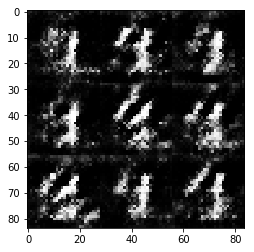

Epoch 1/2: Discriminator Loss: 1.700996 Generator Loss: 1.520756 Difference: -0.180240
Epoch 1/2: Discriminator Loss: 1.404794 Generator Loss: 0.751017 Difference: -0.653778
Epoch 1/2: Discriminator Loss: 1.316540 Generator Loss: 0.785481 Difference: -0.531058
Epoch 1/2: Discriminator Loss: 1.183376 Generator Loss: 0.807269 Difference: -0.376107
Epoch 1/2: Discriminator Loss: 1.520986 Generator Loss: 0.331088 Difference: -1.189897
Epoch 1/2: Discriminator Loss: 1.753536 Generator Loss: 0.406253 Difference: -1.347283
Tensor("generator_6/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_6/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_6/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_6/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_6/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_6/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


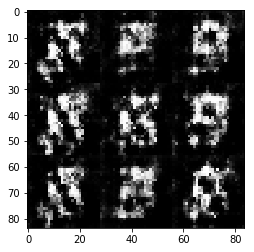

Epoch 1/2: Discriminator Loss: 1.489327 Generator Loss: 0.692613 Difference: -0.796714
Epoch 1/2: Discriminator Loss: 1.183435 Generator Loss: 0.745756 Difference: -0.437679
Epoch 1/2: Discriminator Loss: 1.194528 Generator Loss: 0.704839 Difference: -0.489689
Epoch 1/2: Discriminator Loss: 1.246882 Generator Loss: 0.911583 Difference: -0.335299
Epoch 1/2: Discriminator Loss: 1.652762 Generator Loss: 0.457600 Difference: -1.195162
Epoch 1/2: Discriminator Loss: 1.657364 Generator Loss: 0.544331 Difference: -1.113033
Tensor("generator_7/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_7/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_7/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_7/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_7/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_7/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


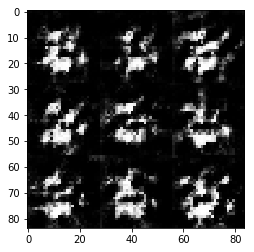

Epoch 1/2: Discriminator Loss: 1.488295 Generator Loss: 0.732067 Difference: -0.756228
Epoch 1/2: Discriminator Loss: 1.355749 Generator Loss: 0.777204 Difference: -0.578545
Epoch 1/2: Discriminator Loss: 1.321903 Generator Loss: 0.640512 Difference: -0.681391
Epoch 1/2: Discriminator Loss: 1.377917 Generator Loss: 0.646029 Difference: -0.731888
Epoch 1/2: Discriminator Loss: 1.275851 Generator Loss: 1.366861 Difference: 0.091010
Epoch 1/2: Discriminator Loss: 1.499019 Generator Loss: 0.588710 Difference: -0.910309
Tensor("generator_8/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_8/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_8/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_8/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_8/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_8/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


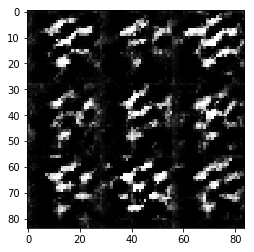

Epoch 1/2: Discriminator Loss: 1.364128 Generator Loss: 0.640043 Difference: -0.724085
Epoch 1/2: Discriminator Loss: 1.242632 Generator Loss: 0.801886 Difference: -0.440747
Epoch 1/2: Discriminator Loss: 1.260828 Generator Loss: 0.803274 Difference: -0.457554
Epoch 1/2: Discriminator Loss: 1.314795 Generator Loss: 0.722664 Difference: -0.592130
Epoch 1/2: Discriminator Loss: 1.663729 Generator Loss: 1.367687 Difference: -0.296043
Epoch 1/2: Discriminator Loss: 1.413649 Generator Loss: 0.554683 Difference: -0.858966
Tensor("generator_9/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_9/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_9/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_9/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_9/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_9/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


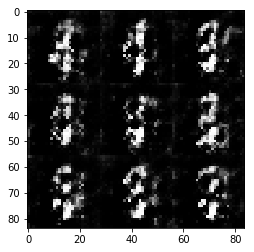

Epoch 1/2: Discriminator Loss: 1.173762 Generator Loss: 0.894019 Difference: -0.279743
Epoch 1/2: Discriminator Loss: 1.306416 Generator Loss: 0.819018 Difference: -0.487398
Epoch 1/2: Discriminator Loss: 1.462947 Generator Loss: 0.613777 Difference: -0.849169
Epoch 1/2: Discriminator Loss: 1.501101 Generator Loss: 0.601645 Difference: -0.899455
Epoch 1/2: Discriminator Loss: 1.538127 Generator Loss: 0.881487 Difference: -0.656640
Epoch 1/2: Discriminator Loss: 1.035987 Generator Loss: 1.535546 Difference: 0.499558
Tensor("generator_10/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_10/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_10/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_10/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_10/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_10/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


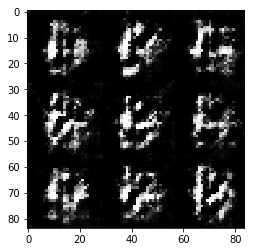

Epoch 1/2: Discriminator Loss: 1.367887 Generator Loss: 0.822996 Difference: -0.544890
Epoch 1/2: Discriminator Loss: 1.353114 Generator Loss: 0.758794 Difference: -0.594320
Epoch 1/2: Discriminator Loss: 1.482813 Generator Loss: 0.692794 Difference: -0.790019
Epoch 1/2: Discriminator Loss: 1.394782 Generator Loss: 0.794835 Difference: -0.599946
Epoch 1/2: Discriminator Loss: 1.152583 Generator Loss: 1.079833 Difference: -0.072750
Epoch 1/2: Discriminator Loss: 1.217884 Generator Loss: 1.027769 Difference: -0.190115
Tensor("generator_11/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_11/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_11/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_11/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_11/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_11/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


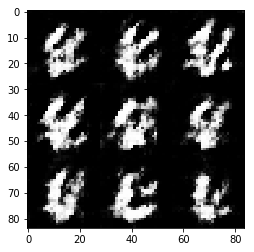

Epoch 1/2: Discriminator Loss: 1.692168 Generator Loss: 0.846994 Difference: -0.845174
Epoch 1/2: Discriminator Loss: 1.745591 Generator Loss: 0.309370 Difference: -1.436220
Epoch 1/2: Discriminator Loss: 1.521845 Generator Loss: 0.534714 Difference: -0.987131
Epoch 1/2: Discriminator Loss: 1.393474 Generator Loss: 0.493647 Difference: -0.899827
Epoch 1/2: Discriminator Loss: 1.425873 Generator Loss: 0.750972 Difference: -0.674901
Epoch 1/2: Discriminator Loss: 1.220155 Generator Loss: 0.932261 Difference: -0.287894
Tensor("generator_12/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_12/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_12/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_12/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_12/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_12/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


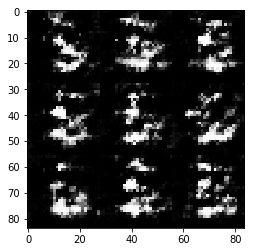

Epoch 1/2: Discriminator Loss: 1.321343 Generator Loss: 0.753217 Difference: -0.568126
Epoch 1/2: Discriminator Loss: 1.392871 Generator Loss: 0.472203 Difference: -0.920668
Epoch 1/2: Discriminator Loss: 1.291946 Generator Loss: 0.548807 Difference: -0.743138
Epoch 1/2: Discriminator Loss: 1.573786 Generator Loss: 0.488426 Difference: -1.085360
Epoch 1/2: Discriminator Loss: 1.163868 Generator Loss: 0.935869 Difference: -0.227998
Epoch 1/2: Discriminator Loss: 1.256389 Generator Loss: 0.691338 Difference: -0.565051
Tensor("generator_13/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_13/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_13/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_13/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_13/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_13/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


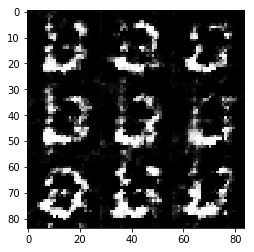

Epoch 1/2: Discriminator Loss: 1.479737 Generator Loss: 1.506081 Difference: 0.026344
Epoch 1/2: Discriminator Loss: 1.257674 Generator Loss: 1.778753 Difference: 0.521079
Epoch 1/2: Discriminator Loss: 2.381554 Generator Loss: 0.263791 Difference: -2.117763
Epoch 1/2: Discriminator Loss: 1.240305 Generator Loss: 0.748029 Difference: -0.492277
Epoch 1/2: Discriminator Loss: 1.156114 Generator Loss: 0.924737 Difference: -0.231377
Epoch 1/2: Discriminator Loss: 1.651271 Generator Loss: 0.636392 Difference: -1.014880
Tensor("generator_14/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_14/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_14/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_14/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_14/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_14/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


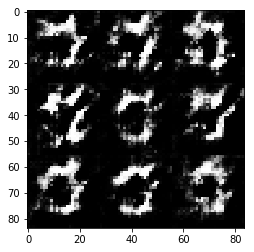

Epoch 1/2: Discriminator Loss: 1.318374 Generator Loss: 0.806142 Difference: -0.512232
Epoch 1/2: Discriminator Loss: 1.177012 Generator Loss: 1.285166 Difference: 0.108154
Epoch 1/2: Discriminator Loss: 1.514344 Generator Loss: 1.267620 Difference: -0.246724
Epoch 1/2: Discriminator Loss: 1.279263 Generator Loss: 0.816377 Difference: -0.462886
Epoch 1/2: Discriminator Loss: 1.465071 Generator Loss: 0.704709 Difference: -0.760362
Epoch 1/2: Discriminator Loss: 1.473615 Generator Loss: 0.685545 Difference: -0.788070
Tensor("generator_15/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_15/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_15/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_15/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_15/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_15/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


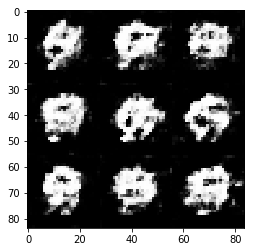

Epoch 1/2: Discriminator Loss: 1.465503 Generator Loss: 0.824009 Difference: -0.641494
Epoch 1/2: Discriminator Loss: 1.302543 Generator Loss: 0.635640 Difference: -0.666903
Epoch 1/2: Discriminator Loss: 1.195564 Generator Loss: 0.829193 Difference: -0.366372
Epoch 1/2: Discriminator Loss: 1.229540 Generator Loss: 0.757390 Difference: -0.472150
Epoch 1/2: Discriminator Loss: 1.158612 Generator Loss: 0.829396 Difference: -0.329216
Epoch 1/2: Discriminator Loss: 1.783717 Generator Loss: 1.266416 Difference: -0.517301
Tensor("generator_16/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_16/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_16/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_16/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_16/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_16/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


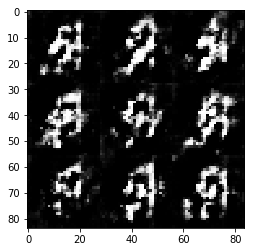

Epoch 1/2: Discriminator Loss: 1.438406 Generator Loss: 0.686275 Difference: -0.752131
Epoch 1/2: Discriminator Loss: 1.509754 Generator Loss: 0.833594 Difference: -0.676160
Epoch 1/2: Discriminator Loss: 1.357279 Generator Loss: 0.678883 Difference: -0.678396
Epoch 1/2: Discriminator Loss: 1.394236 Generator Loss: 0.869982 Difference: -0.524255
Epoch 1/2: Discriminator Loss: 1.460390 Generator Loss: 0.631869 Difference: -0.828520
Epoch 1/2: Discriminator Loss: 1.044315 Generator Loss: 0.878812 Difference: -0.165503
Tensor("generator_17/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_17/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_17/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_17/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_17/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_17/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


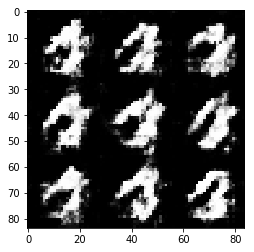

Epoch 1/2: Discriminator Loss: 1.711399 Generator Loss: 0.402897 Difference: -1.308502
Epoch 1/2: Discriminator Loss: 1.749734 Generator Loss: 0.478910 Difference: -1.270825
Epoch 1/2: Discriminator Loss: 1.525690 Generator Loss: 0.626232 Difference: -0.899459
Epoch 1/2: Discriminator Loss: 1.076585 Generator Loss: 1.069223 Difference: -0.007362
Epoch 1/2: Discriminator Loss: 1.898236 Generator Loss: 0.263480 Difference: -1.634756
Epoch 1/2: Discriminator Loss: 1.251027 Generator Loss: 0.866566 Difference: -0.384461
Tensor("generator_18/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_18/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_18/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_18/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_18/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_18/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


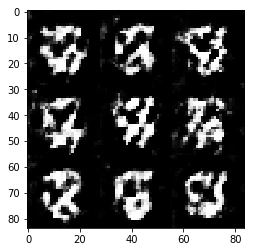

Epoch 1/2: Discriminator Loss: 1.382789 Generator Loss: 0.660410 Difference: -0.722379
Epoch 1/2: Discriminator Loss: 1.364819 Generator Loss: 0.918151 Difference: -0.446668
Epoch 1/2: Discriminator Loss: 1.305982 Generator Loss: 0.549169 Difference: -0.756813
Epoch 1/2: Discriminator Loss: 1.364470 Generator Loss: 0.832353 Difference: -0.532117
Epoch 1/2: Discriminator Loss: 1.524818 Generator Loss: 0.503836 Difference: -1.020982
Epoch 1/2: Discriminator Loss: 1.390187 Generator Loss: 0.657804 Difference: -0.732383
Tensor("generator_19/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_19/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_19/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_19/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_19/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_19/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


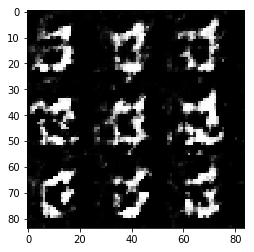

Epoch 1/2: Discriminator Loss: 1.132477 Generator Loss: 1.233901 Difference: 0.101424
Epoch 1/2: Discriminator Loss: 1.249539 Generator Loss: 0.838855 Difference: -0.410684
Epoch 1/2: Discriminator Loss: 1.155669 Generator Loss: 0.821735 Difference: -0.333934
Epoch 1/2: Discriminator Loss: 1.215374 Generator Loss: 0.831851 Difference: -0.383523
Epoch 1/2: Discriminator Loss: 1.186701 Generator Loss: 0.606983 Difference: -0.579718
Epoch 1/2: Discriminator Loss: 1.324568 Generator Loss: 1.360380 Difference: 0.035812
Tensor("generator_20/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_20/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_20/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_20/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_20/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_20/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


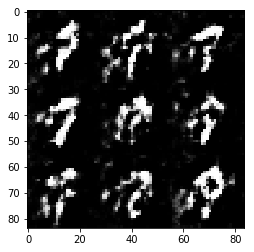

Epoch 1/2: Discriminator Loss: 0.895229 Generator Loss: 1.028177 Difference: 0.132948
Epoch 1/2: Discriminator Loss: 1.083179 Generator Loss: 1.045156 Difference: -0.038024
Epoch 1/2: Discriminator Loss: 1.485468 Generator Loss: 0.353990 Difference: -1.131477
Epoch 1/2: Discriminator Loss: 1.500587 Generator Loss: 0.531334 Difference: -0.969253
Epoch 1/2: Discriminator Loss: 1.418575 Generator Loss: 0.448757 Difference: -0.969818
Epoch 1/2: Discriminator Loss: 1.332112 Generator Loss: 0.752766 Difference: -0.579346
Tensor("generator_21/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_21/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_21/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_21/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_21/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_21/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


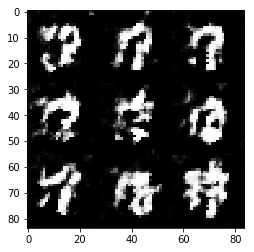

Epoch 1/2: Discriminator Loss: 1.294985 Generator Loss: 0.868428 Difference: -0.426558
Epoch 1/2: Discriminator Loss: 1.264155 Generator Loss: 0.694955 Difference: -0.569199
Epoch 1/2: Discriminator Loss: 1.176521 Generator Loss: 0.851732 Difference: -0.324789
Epoch 1/2: Discriminator Loss: 1.293646 Generator Loss: 0.743655 Difference: -0.549991
Epoch 1/2: Discriminator Loss: 1.056564 Generator Loss: 0.872190 Difference: -0.184374
Epoch 1/2: Discriminator Loss: 2.009859 Generator Loss: 0.382618 Difference: -1.627240
Tensor("generator_22/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_22/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_22/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_22/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_22/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_22/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


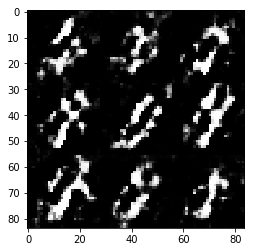

Epoch 1/2: Discriminator Loss: 1.322007 Generator Loss: 0.777858 Difference: -0.544149
Epoch 1/2: Discriminator Loss: 1.242648 Generator Loss: 0.752091 Difference: -0.490556
Epoch 1/2: Discriminator Loss: 1.318732 Generator Loss: 0.769448 Difference: -0.549285
Epoch 1/2: Discriminator Loss: 1.254403 Generator Loss: 0.579255 Difference: -0.675148
Epoch 1/2: Discriminator Loss: 0.953425 Generator Loss: 1.048412 Difference: 0.094987
Epoch 1/2: Discriminator Loss: 1.243348 Generator Loss: 1.597668 Difference: 0.354320
Tensor("generator_23/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_23/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_23/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_23/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_23/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_23/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


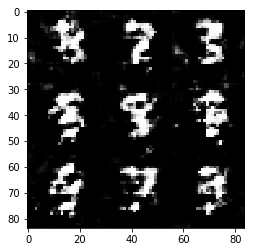

Epoch 1/2: Discriminator Loss: 1.814536 Generator Loss: 0.512406 Difference: -1.302130
Epoch 1/2: Discriminator Loss: 1.192426 Generator Loss: 0.828251 Difference: -0.364174
Epoch 1/2: Discriminator Loss: 2.718212 Generator Loss: 2.892368 Difference: 0.174155
Epoch 1/2: Discriminator Loss: 1.158878 Generator Loss: 0.767263 Difference: -0.391615
Epoch 1/2: Discriminator Loss: 1.380749 Generator Loss: 1.088544 Difference: -0.292206
Epoch 1/2: Discriminator Loss: 1.184011 Generator Loss: 0.766638 Difference: -0.417373
Tensor("generator_24/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_24/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_24/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_24/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_24/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_24/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


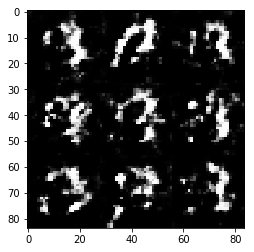

Epoch 1/2: Discriminator Loss: 1.275043 Generator Loss: 0.962498 Difference: -0.312546
Epoch 1/2: Discriminator Loss: 2.281521 Generator Loss: 0.191799 Difference: -2.089722
Epoch 1/2: Discriminator Loss: 1.087444 Generator Loss: 1.125608 Difference: 0.038164
Epoch 1/2: Discriminator Loss: 1.696253 Generator Loss: 0.347721 Difference: -1.348532
Epoch 1/2: Discriminator Loss: 1.128849 Generator Loss: 0.894076 Difference: -0.234773
Epoch 1/2: Discriminator Loss: 1.621856 Generator Loss: 0.414902 Difference: -1.206954
Tensor("generator_25/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_25/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_25/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_25/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_25/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_25/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


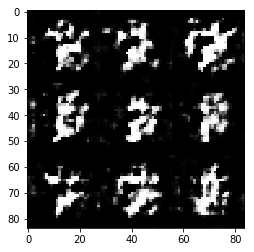

Epoch 1/2: Discriminator Loss: 1.388951 Generator Loss: 0.572893 Difference: -0.816057
Epoch 1/2: Discriminator Loss: 1.609851 Generator Loss: 0.322338 Difference: -1.287513
Epoch 1/2: Discriminator Loss: 2.324045 Generator Loss: 0.205607 Difference: -2.118438
Epoch 1/2: Discriminator Loss: 0.933741 Generator Loss: 1.131253 Difference: 0.197513
Epoch 1/2: Discriminator Loss: 1.802978 Generator Loss: 0.314106 Difference: -1.488871
Epoch 1/2: Discriminator Loss: 1.633270 Generator Loss: 0.612475 Difference: -1.020795
Tensor("generator_26/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_26/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_26/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_26/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_26/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_26/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


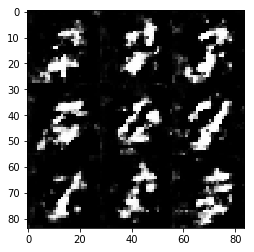

Epoch 1/2: Discriminator Loss: 1.438161 Generator Loss: 0.511391 Difference: -0.926770
Epoch 1/2: Discriminator Loss: 1.174376 Generator Loss: 0.970458 Difference: -0.203918
Epoch 1/2: Discriminator Loss: 1.491469 Generator Loss: 0.536128 Difference: -0.955341
Epoch 1/2: Discriminator Loss: 1.066983 Generator Loss: 0.704913 Difference: -0.362070
Epoch 1/2: Discriminator Loss: 1.267199 Generator Loss: 0.389627 Difference: -0.877572
Epoch 1/2: Discriminator Loss: 1.324050 Generator Loss: 1.292581 Difference: -0.031469
Tensor("generator_27/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_27/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_27/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_27/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_27/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_27/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


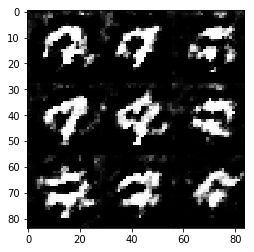

Epoch 1/2: Discriminator Loss: 1.165826 Generator Loss: 0.609650 Difference: -0.556176
Epoch 1/2: Discriminator Loss: 1.210319 Generator Loss: 0.921514 Difference: -0.288806
Epoch 1/2: Discriminator Loss: 1.001618 Generator Loss: 0.906891 Difference: -0.094728
Epoch 1/2: Discriminator Loss: 1.351035 Generator Loss: 2.401307 Difference: 1.050272
Epoch 1/2: Discriminator Loss: 1.112447 Generator Loss: 0.704252 Difference: -0.408195
Epoch 1/2: Discriminator Loss: 1.584020 Generator Loss: 0.490307 Difference: -1.093713
Tensor("generator_28/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_28/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_28/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_28/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_28/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_28/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


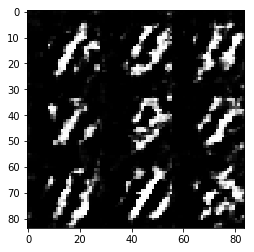

Epoch 1/2: Discriminator Loss: 1.001922 Generator Loss: 0.713212 Difference: -0.288710
Epoch 1/2: Discriminator Loss: 1.222748 Generator Loss: 0.790759 Difference: -0.431990
Epoch 1/2: Discriminator Loss: 1.085469 Generator Loss: 0.738464 Difference: -0.347005
Epoch 1/2: Discriminator Loss: 2.535538 Generator Loss: 2.656793 Difference: 0.121255
Epoch 1/2: Discriminator Loss: 1.107152 Generator Loss: 1.090154 Difference: -0.016999
Epoch 1/2: Discriminator Loss: 1.638259 Generator Loss: 0.663861 Difference: -0.974398
Tensor("generator_29/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_29/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_29/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_29/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_29/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_29/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


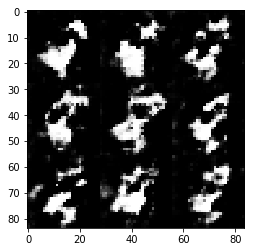

Epoch 1/2: Discriminator Loss: 1.732918 Generator Loss: 0.665344 Difference: -1.067574
Epoch 1/2: Discriminator Loss: 1.159422 Generator Loss: 0.923151 Difference: -0.236271
Epoch 1/2: Discriminator Loss: 1.255393 Generator Loss: 0.796755 Difference: -0.458637
Epoch 1/2: Discriminator Loss: 1.174204 Generator Loss: 0.816678 Difference: -0.357526
Epoch 1/2: Discriminator Loss: 0.838543 Generator Loss: 1.187269 Difference: 0.348726
Epoch 1/2: Discriminator Loss: 1.296525 Generator Loss: 0.585334 Difference: -0.711191
Tensor("generator_30/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_30/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_30/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_30/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_30/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_30/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


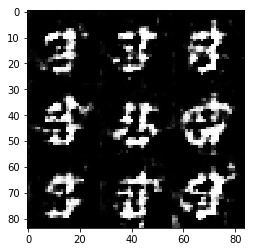

Epoch 1/2: Discriminator Loss: 0.759316 Generator Loss: 1.708926 Difference: 0.949611
Epoch 1/2: Discriminator Loss: 1.153700 Generator Loss: 0.709914 Difference: -0.443786
Epoch 1/2: Discriminator Loss: 0.812971 Generator Loss: 1.032242 Difference: 0.219271
Epoch 1/2: Discriminator Loss: 2.408886 Generator Loss: 0.323597 Difference: -2.085289
Epoch 1/2: Discriminator Loss: 1.079174 Generator Loss: 1.329546 Difference: 0.250372
Epoch 1/2: Discriminator Loss: 1.239409 Generator Loss: 0.701215 Difference: -0.538194
Tensor("generator_31/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_31/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_31/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_31/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_31/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_31/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


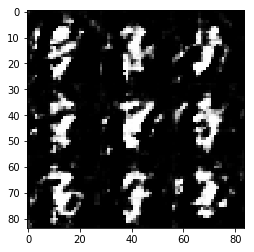

Epoch 1/2: Discriminator Loss: 1.157806 Generator Loss: 0.740124 Difference: -0.417682
Epoch 1/2: Discriminator Loss: 1.832026 Generator Loss: 0.279471 Difference: -1.552555
Epoch 1/2: Discriminator Loss: 1.489547 Generator Loss: 0.602522 Difference: -0.887024
Epoch 1/2: Discriminator Loss: 1.050353 Generator Loss: 1.090376 Difference: 0.040023
Epoch 1/2: Discriminator Loss: 1.485198 Generator Loss: 0.422898 Difference: -1.062300
Epoch 1/2: Discriminator Loss: 0.977403 Generator Loss: 0.855276 Difference: -0.122127
Tensor("generator_32/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_32/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_32/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_32/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_32/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_32/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


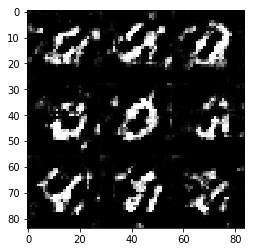

Epoch 1/2: Discriminator Loss: 1.394508 Generator Loss: 0.873657 Difference: -0.520852
Epoch 1/2: Discriminator Loss: 1.077635 Generator Loss: 1.103245 Difference: 0.025610
Epoch 1/2: Discriminator Loss: 2.096005 Generator Loss: 2.448083 Difference: 0.352077
Epoch 1/2: Discriminator Loss: 1.709323 Generator Loss: 0.366838 Difference: -1.342485
Epoch 1/2: Discriminator Loss: 1.064399 Generator Loss: 0.726493 Difference: -0.337906
Epoch 1/2: Discriminator Loss: 0.992052 Generator Loss: 0.668978 Difference: -0.323073
Tensor("generator_33/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_33/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_33/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_33/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_33/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_33/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


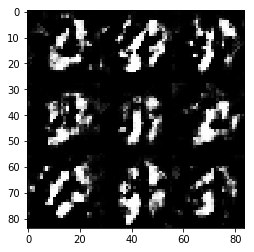

Epoch 1/2: Discriminator Loss: 1.151769 Generator Loss: 0.516451 Difference: -0.635318
Epoch 1/2: Discriminator Loss: 1.291573 Generator Loss: 0.824621 Difference: -0.466952
Epoch 1/2: Discriminator Loss: 1.286647 Generator Loss: 1.803845 Difference: 0.517198
Epoch 1/2: Discriminator Loss: 1.192193 Generator Loss: 0.961419 Difference: -0.230774
Epoch 1/2: Discriminator Loss: 1.187435 Generator Loss: 0.721095 Difference: -0.466340
Epoch 1/2: Discriminator Loss: 0.845702 Generator Loss: 0.984443 Difference: 0.138742
Tensor("generator_34/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_34/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_34/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_34/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_34/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_34/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


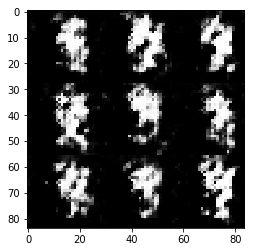

Epoch 1/2: Discriminator Loss: 0.914046 Generator Loss: 1.467819 Difference: 0.553774
Epoch 1/2: Discriminator Loss: 1.194518 Generator Loss: 0.564929 Difference: -0.629590
Epoch 1/2: Discriminator Loss: 0.990481 Generator Loss: 0.716450 Difference: -0.274031
Epoch 1/2: Discriminator Loss: 2.866474 Generator Loss: 0.181663 Difference: -2.684810
Epoch 1/2: Discriminator Loss: 1.102108 Generator Loss: 1.005928 Difference: -0.096180
Epoch 1/2: Discriminator Loss: 0.598847 Generator Loss: 1.375795 Difference: 0.776948
Tensor("generator_35/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_35/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_35/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_35/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_35/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_35/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


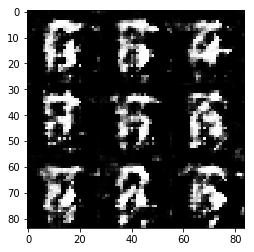

Epoch 1/2: Discriminator Loss: 4.451035 Generator Loss: 4.253868 Difference: -0.197167
Epoch 1/2: Discriminator Loss: 1.267878 Generator Loss: 0.610262 Difference: -0.657616
Epoch 1/2: Discriminator Loss: 1.407371 Generator Loss: 0.395666 Difference: -1.011705
Epoch 1/2: Discriminator Loss: 1.360387 Generator Loss: 0.386014 Difference: -0.974373
Epoch 1/2: Discriminator Loss: 1.433097 Generator Loss: 1.046385 Difference: -0.386712
Epoch 1/2: Discriminator Loss: 1.040122 Generator Loss: 0.482590 Difference: -0.557533
Tensor("generator_36/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_36/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_36/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_36/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_36/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_36/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


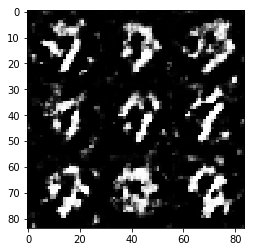

Epoch 1/2: Discriminator Loss: 2.065870 Generator Loss: 0.332838 Difference: -1.733031
Epoch 1/2: Discriminator Loss: 1.553461 Generator Loss: 0.949198 Difference: -0.604263
Epoch 1/2: Discriminator Loss: 1.773623 Generator Loss: 0.195593 Difference: -1.578030
Epoch 1/2: Discriminator Loss: 1.939551 Generator Loss: 0.798809 Difference: -1.140742
Epoch 1/2: Discriminator Loss: 1.394490 Generator Loss: 0.713982 Difference: -0.680508
Epoch 1/2: Discriminator Loss: 0.664738 Generator Loss: 1.401859 Difference: 0.737121
Tensor("generator_37/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_37/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_37/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_37/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_37/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_37/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


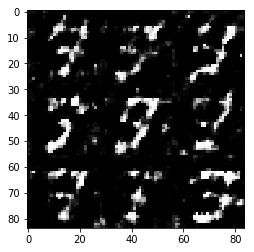

Epoch 1/2: Discriminator Loss: 1.590091 Generator Loss: 0.418660 Difference: -1.171432
Epoch 1/2: Discriminator Loss: 1.021084 Generator Loss: 0.963273 Difference: -0.057811
Epoch 1/2: Discriminator Loss: 1.514026 Generator Loss: 0.260652 Difference: -1.253374
Epoch 1/2: Discriminator Loss: 0.719793 Generator Loss: 1.533094 Difference: 0.813302
Epoch 1/2: Discriminator Loss: 0.927136 Generator Loss: 0.615120 Difference: -0.312016
Epoch 1/2: Discriminator Loss: 1.397289 Generator Loss: 0.550226 Difference: -0.847062
Tensor("generator_38/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_38/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_38/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_38/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_38/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_38/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


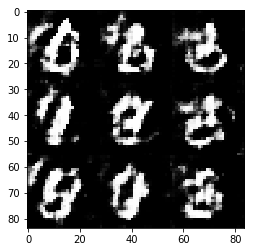

Epoch 1/2: Discriminator Loss: 1.698516 Generator Loss: 0.390397 Difference: -1.308118
Epoch 1/2: Discriminator Loss: 1.728405 Generator Loss: 1.931686 Difference: 0.203281
Epoch 1/2: Discriminator Loss: 0.918760 Generator Loss: 0.719916 Difference: -0.198844
Epoch 1/2: Discriminator Loss: 1.698283 Generator Loss: 0.628767 Difference: -1.069516
Epoch 1/2: Discriminator Loss: 0.928844 Generator Loss: 0.964968 Difference: 0.036125
Epoch 1/2: Discriminator Loss: 1.114921 Generator Loss: 1.078237 Difference: -0.036684
Tensor("generator_39/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_39/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_39/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_39/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_39/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_39/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


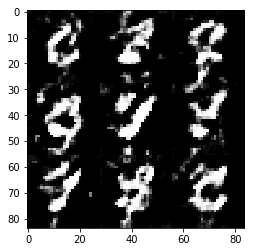

Epoch 1/2: Discriminator Loss: 1.337123 Generator Loss: 0.560014 Difference: -0.777109
Epoch 1/2: Discriminator Loss: 1.635491 Generator Loss: 0.481008 Difference: -1.154484
Epoch 1/2: Discriminator Loss: 1.161131 Generator Loss: 1.213751 Difference: 0.052620
Epoch 1/2: Discriminator Loss: 2.197886 Generator Loss: 0.132683 Difference: -2.065202
Epoch 1/2: Discriminator Loss: 0.963595 Generator Loss: 1.315336 Difference: 0.351740
Epoch 1/2: Discriminator Loss: 2.313702 Generator Loss: 0.248156 Difference: -2.065546
Tensor("generator_40/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_40/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_40/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_40/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_40/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_40/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


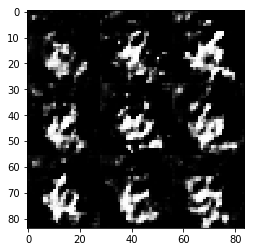

Epoch 1/2: Discriminator Loss: 2.592305 Generator Loss: 4.388671 Difference: 1.796366
Epoch 1/2: Discriminator Loss: 1.144468 Generator Loss: 0.764749 Difference: -0.379719
Epoch 1/2: Discriminator Loss: 1.227379 Generator Loss: 0.840598 Difference: -0.386781
Epoch 1/2: Discriminator Loss: 0.774558 Generator Loss: 1.119447 Difference: 0.344888
Epoch 1/2: Discriminator Loss: 0.730723 Generator Loss: 4.479687 Difference: 3.748964
Epoch 1/2: Discriminator Loss: 0.636181 Generator Loss: 1.533860 Difference: 0.897679
Tensor("generator_41/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_41/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_41/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_41/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_41/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_41/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


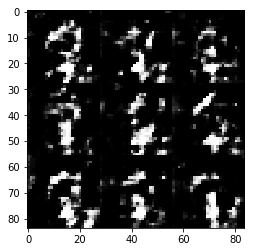

Epoch 1/2: Discriminator Loss: 1.024373 Generator Loss: 0.537516 Difference: -0.486857
Epoch 1/2: Discriminator Loss: 0.739137 Generator Loss: 1.140650 Difference: 0.401513
Epoch 1/2: Discriminator Loss: 0.958766 Generator Loss: 1.132041 Difference: 0.173274
Epoch 1/2: Discriminator Loss: 1.408420 Generator Loss: 0.795147 Difference: -0.613273
Epoch 1/2: Discriminator Loss: 1.337802 Generator Loss: 0.739124 Difference: -0.598678
Epoch 1/2: Discriminator Loss: 0.758581 Generator Loss: 1.200225 Difference: 0.441644
Tensor("generator_42/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_42/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_42/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_42/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_42/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_42/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


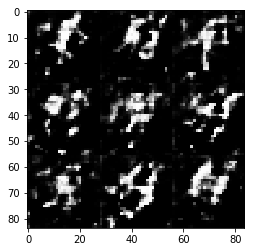

Epoch 1/2: Discriminator Loss: 1.290352 Generator Loss: 1.690820 Difference: 0.400468
Epoch 1/2: Discriminator Loss: 1.805253 Generator Loss: 0.314716 Difference: -1.490537
Epoch 1/2: Discriminator Loss: 1.004056 Generator Loss: 2.258043 Difference: 1.253987
Epoch 1/2: Discriminator Loss: 1.802015 Generator Loss: 0.189858 Difference: -1.612157
Epoch 1/2: Discriminator Loss: 1.223972 Generator Loss: 1.750140 Difference: 0.526168
Epoch 1/2: Discriminator Loss: 1.350615 Generator Loss: 2.614476 Difference: 1.263861
Tensor("generator_43/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_43/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_43/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_43/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_43/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_43/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


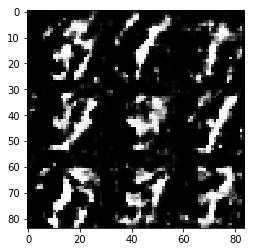

Epoch 1/2: Discriminator Loss: 2.454847 Generator Loss: 0.621116 Difference: -1.833731
Epoch 1/2: Discriminator Loss: 1.951193 Generator Loss: 0.465642 Difference: -1.485551
Epoch 1/2: Discriminator Loss: 1.282442 Generator Loss: 0.530487 Difference: -0.751955
Epoch 1/2: Discriminator Loss: 1.057583 Generator Loss: 0.982457 Difference: -0.075126
Epoch 1/2: Discriminator Loss: 1.199895 Generator Loss: 0.511135 Difference: -0.688760
Epoch 1/2: Discriminator Loss: 0.810369 Generator Loss: 0.843682 Difference: 0.033313
Tensor("generator_44/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_44/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_44/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_44/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_44/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_44/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


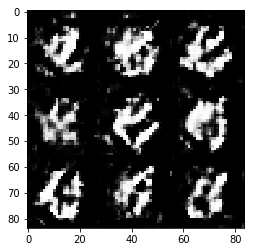

Epoch 1/2: Discriminator Loss: 0.782444 Generator Loss: 0.726170 Difference: -0.056274
Epoch 1/2: Discriminator Loss: 1.460948 Generator Loss: 0.337225 Difference: -1.123723
Epoch 1/2: Discriminator Loss: 0.987601 Generator Loss: 1.599119 Difference: 0.611518
Epoch 1/2: Discriminator Loss: 1.424177 Generator Loss: 0.868795 Difference: -0.555382
Epoch 1/2: Discriminator Loss: 0.676325 Generator Loss: 0.738693 Difference: 0.062368
Epoch 1/2: Discriminator Loss: 1.413261 Generator Loss: 0.698664 Difference: -0.714597
Tensor("generator_45/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_45/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_45/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_45/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_45/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_45/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


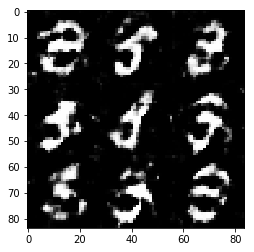

Epoch 1/2: Discriminator Loss: 1.087023 Generator Loss: 0.640011 Difference: -0.447013
Epoch 1/2: Discriminator Loss: 2.251480 Generator Loss: 2.535254 Difference: 0.283774
Epoch 1/2: Discriminator Loss: 0.974445 Generator Loss: 1.127786 Difference: 0.153341
Epoch 1/2: Discriminator Loss: 0.668010 Generator Loss: 0.766229 Difference: 0.098219
Epoch 1/2: Discriminator Loss: 1.126930 Generator Loss: 0.922921 Difference: -0.204009
Epoch 1/2: Discriminator Loss: 1.144462 Generator Loss: 1.285419 Difference: 0.140957
Tensor("generator_46/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_46/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_46/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_46/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_46/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_46/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


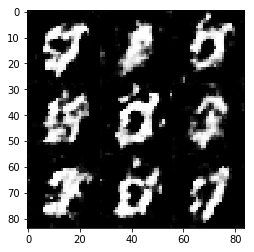

Epoch 1/2: Discriminator Loss: 0.728743 Generator Loss: 0.549376 Difference: -0.179367
Epoch 1/2: Discriminator Loss: 0.762478 Generator Loss: 1.998684 Difference: 1.236206
Epoch 1/2: Discriminator Loss: 0.898279 Generator Loss: 3.349366 Difference: 2.451087
Epoch 1/2: Discriminator Loss: 1.195146 Generator Loss: 0.771350 Difference: -0.423796
Epoch 1/2: Discriminator Loss: 0.887330 Generator Loss: 1.235040 Difference: 0.347710
Epoch 1/2: Discriminator Loss: 0.759219 Generator Loss: 1.039279 Difference: 0.280060
Tensor("generator_47/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_47/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_47/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_47/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_47/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_47/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


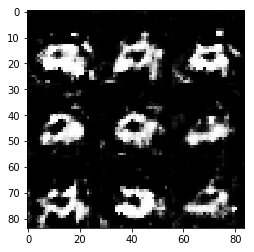

Epoch 1/2: Discriminator Loss: 1.904894 Generator Loss: 0.308528 Difference: -1.596367
Epoch 1/2: Discriminator Loss: 0.548159 Generator Loss: 2.569929 Difference: 2.021770
Epoch 1/2: Discriminator Loss: 0.521969 Generator Loss: 2.518407 Difference: 1.996438
Epoch 1/2: Discriminator Loss: 2.075594 Generator Loss: 1.088853 Difference: -0.986742
Epoch 1/2: Discriminator Loss: 1.044833 Generator Loss: 1.722114 Difference: 0.677281
Epoch 1/2: Discriminator Loss: 1.380578 Generator Loss: 0.895960 Difference: -0.484618
Tensor("generator_48/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_48/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_48/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_48/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_48/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_48/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


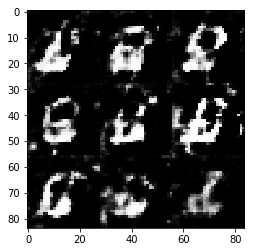

Epoch 1/2: Discriminator Loss: 1.171100 Generator Loss: 0.729536 Difference: -0.441563
Epoch 1/2: Discriminator Loss: 1.250015 Generator Loss: 0.523696 Difference: -0.726318
Epoch 1/2: Discriminator Loss: 0.731151 Generator Loss: 2.055430 Difference: 1.324279
Epoch 1/2: Discriminator Loss: 1.043737 Generator Loss: 0.850402 Difference: -0.193335
Epoch 1/2: Discriminator Loss: 0.585514 Generator Loss: 1.814186 Difference: 1.228673
Epoch 1/2: Discriminator Loss: 0.928008 Generator Loss: 0.798517 Difference: -0.129490
Tensor("generator_49/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_49/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_49/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_49/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_49/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_49/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


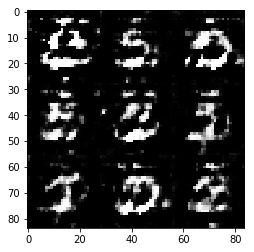

Epoch 1/2: Discriminator Loss: 1.241585 Generator Loss: 0.317728 Difference: -0.923858
Epoch 1/2: Discriminator Loss: 0.766688 Generator Loss: 1.916523 Difference: 1.149835
Epoch 1/2: Discriminator Loss: 0.987119 Generator Loss: 2.398612 Difference: 1.411493
Epoch 1/2: Discriminator Loss: 2.142857 Generator Loss: 0.376086 Difference: -1.766771
Epoch 1/2: Discriminator Loss: 0.726892 Generator Loss: 0.449793 Difference: -0.277099
Epoch 1/2: Discriminator Loss: 0.882065 Generator Loss: 1.852265 Difference: 0.970200
Tensor("generator_50/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_50/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_50/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_50/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_50/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_50/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


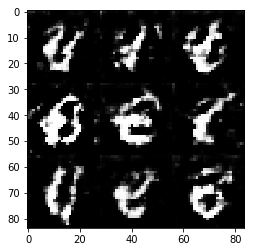

Epoch 1/2: Discriminator Loss: 0.709699 Generator Loss: 0.982203 Difference: 0.272504
Epoch 1/2: Discriminator Loss: 1.117446 Generator Loss: 1.851785 Difference: 0.734339
Epoch 1/2: Discriminator Loss: 2.043650 Generator Loss: 0.120915 Difference: -1.922735
Epoch 1/2: Discriminator Loss: 2.198083 Generator Loss: 4.589595 Difference: 2.391512
Epoch 1/2: Discriminator Loss: 1.022075 Generator Loss: 0.468691 Difference: -0.553385
Epoch 1/2: Discriminator Loss: 0.947565 Generator Loss: 2.736748 Difference: 1.789183
Tensor("generator_51/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_51/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_51/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_51/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_51/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_51/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


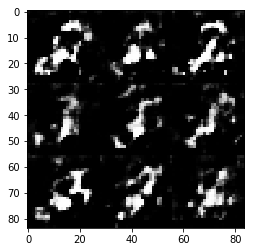

Epoch 1/2: Discriminator Loss: 1.642951 Generator Loss: 0.485492 Difference: -1.157458
Epoch 1/2: Discriminator Loss: 0.588910 Generator Loss: 2.004193 Difference: 1.415283
Epoch 1/2: Discriminator Loss: 1.014121 Generator Loss: 2.741091 Difference: 1.726971
Epoch 1/2: Discriminator Loss: 0.482041 Generator Loss: 2.123643 Difference: 1.641602
Epoch 1/2: Discriminator Loss: 1.083543 Generator Loss: 0.610223 Difference: -0.473320
Epoch 1/2: Discriminator Loss: 1.133507 Generator Loss: 1.626436 Difference: 0.492929
Tensor("generator_52/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_52/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_52/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_52/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_52/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_52/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


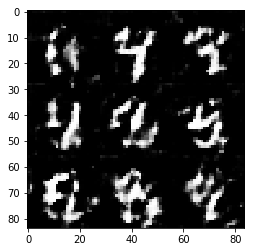

Epoch 1/2: Discriminator Loss: 1.636503 Generator Loss: 0.848323 Difference: -0.788180
Epoch 1/2: Discriminator Loss: 1.856667 Generator Loss: 3.833846 Difference: 1.977179
Epoch 1/2: Discriminator Loss: 0.846293 Generator Loss: 0.447280 Difference: -0.399013
Epoch 1/2: Discriminator Loss: 0.726929 Generator Loss: 1.167129 Difference: 0.440201
Epoch 1/2: Discriminator Loss: 0.832789 Generator Loss: 0.973471 Difference: 0.140682
Epoch 1/2: Discriminator Loss: 0.615558 Generator Loss: 1.089424 Difference: 0.473866
Tensor("generator_53/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_53/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_53/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_53/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_53/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_53/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


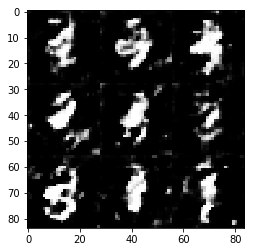

Epoch 1/2: Discriminator Loss: 1.110329 Generator Loss: 0.976194 Difference: -0.134136
Epoch 1/2: Discriminator Loss: 0.642707 Generator Loss: 1.863490 Difference: 1.220783
Epoch 1/2: Discriminator Loss: 1.370867 Generator Loss: 0.892219 Difference: -0.478648
Epoch 1/2: Discriminator Loss: 1.751057 Generator Loss: 0.908647 Difference: -0.842409
Epoch 1/2: Discriminator Loss: 1.183614 Generator Loss: 0.143225 Difference: -1.040390
Epoch 1/2: Discriminator Loss: 1.322164 Generator Loss: 0.815143 Difference: -0.507020
Tensor("generator_54/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_54/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_54/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_54/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_54/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_54/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


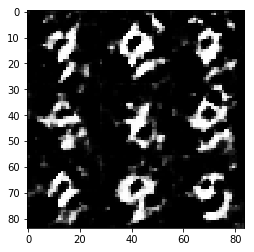

Epoch 1/2: Discriminator Loss: 0.950688 Generator Loss: 0.699662 Difference: -0.251027
Epoch 1/2: Discriminator Loss: 1.523531 Generator Loss: 3.322988 Difference: 1.799457
Epoch 1/2: Discriminator Loss: 1.809143 Generator Loss: 0.331776 Difference: -1.477367
Epoch 1/2: Discriminator Loss: 0.854976 Generator Loss: 2.373167 Difference: 1.518191
Epoch 1/2: Discriminator Loss: 2.090059 Generator Loss: 0.332357 Difference: -1.757702
Epoch 1/2: Discriminator Loss: 0.505956 Generator Loss: 1.803790 Difference: 1.297834
Tensor("generator_55/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_55/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_55/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_55/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_55/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_55/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


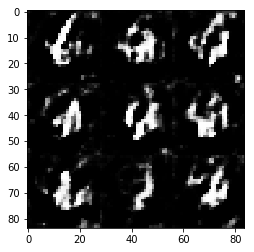

Epoch 1/2: Discriminator Loss: 1.288523 Generator Loss: 0.560998 Difference: -0.727524
Epoch 1/2: Discriminator Loss: 0.551807 Generator Loss: 4.326130 Difference: 3.774323
Epoch 1/2: Discriminator Loss: 1.432596 Generator Loss: 0.417650 Difference: -1.014945
Epoch 1/2: Discriminator Loss: 0.438307 Generator Loss: 1.732179 Difference: 1.293872
Epoch 1/2: Discriminator Loss: 0.890198 Generator Loss: 1.624250 Difference: 0.734052
Epoch 1/2: Discriminator Loss: 1.012673 Generator Loss: 0.414890 Difference: -0.597783
Tensor("generator_56/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_56/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_56/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_56/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_56/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_56/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


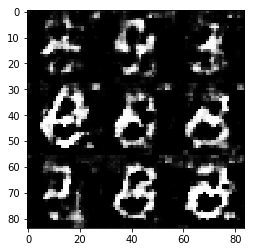

Epoch 1/2: Discriminator Loss: 0.724558 Generator Loss: 1.541013 Difference: 0.816456
Epoch 1/2: Discriminator Loss: 0.684873 Generator Loss: 2.137744 Difference: 1.452871
Epoch 1/2: Discriminator Loss: 0.971821 Generator Loss: 1.929048 Difference: 0.957227
Epoch 1/2: Discriminator Loss: 1.284205 Generator Loss: 1.105351 Difference: -0.178854
Epoch 1/2: Discriminator Loss: 0.533733 Generator Loss: 1.426914 Difference: 0.893180
Epoch 1/2: Discriminator Loss: 0.623387 Generator Loss: 1.262370 Difference: 0.638983
Tensor("generator_57/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_57/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_57/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_57/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_57/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_57/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


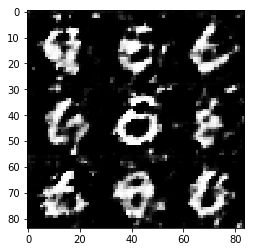

Epoch 1/2: Discriminator Loss: 0.776322 Generator Loss: 1.408335 Difference: 0.632013
Epoch 1/2: Discriminator Loss: 2.684887 Generator Loss: 0.122665 Difference: -2.562222
Epoch 1/2: Discriminator Loss: 1.090783 Generator Loss: 2.048649 Difference: 0.957866
Epoch 1/2: Discriminator Loss: 0.965108 Generator Loss: 0.997746 Difference: 0.032638
Epoch 1/2: Discriminator Loss: 1.031854 Generator Loss: 1.990078 Difference: 0.958224
Epoch 1/2: Discriminator Loss: 0.872929 Generator Loss: 1.783097 Difference: 0.910168
Tensor("generator_58/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_58/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_58/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_58/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_58/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_58/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


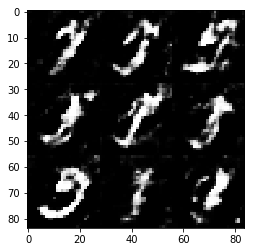

Epoch 1/2: Discriminator Loss: 1.075219 Generator Loss: 1.037471 Difference: -0.037748
Epoch 1/2: Discriminator Loss: 0.742489 Generator Loss: 1.117971 Difference: 0.375482
Epoch 1/2: Discriminator Loss: 0.785025 Generator Loss: 1.571869 Difference: 0.786843
Epoch 1/2: Discriminator Loss: 1.209779 Generator Loss: 1.763164 Difference: 0.553385
Epoch 1/2: Discriminator Loss: 1.750720 Generator Loss: 0.210540 Difference: -1.540179
Epoch 1/2: Discriminator Loss: 0.836557 Generator Loss: 1.463543 Difference: 0.626986
Tensor("generator_59/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_59/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_59/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_59/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_59/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_59/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


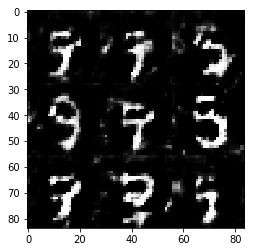

Epoch 1/2: Discriminator Loss: 0.432001 Generator Loss: 1.813488 Difference: 1.381488
Epoch 1/2: Discriminator Loss: 0.631233 Generator Loss: 1.516376 Difference: 0.885143
Epoch 1/2: Discriminator Loss: 0.799112 Generator Loss: 1.746446 Difference: 0.947335
Epoch 1/2: Discriminator Loss: 1.035553 Generator Loss: 0.955289 Difference: -0.080263
Epoch 1/2: Discriminator Loss: 0.790553 Generator Loss: 1.759144 Difference: 0.968590
Epoch 1/2: Discriminator Loss: 1.067352 Generator Loss: 0.859056 Difference: -0.208296
Tensor("generator_60/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_60/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_60/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_60/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_60/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_60/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


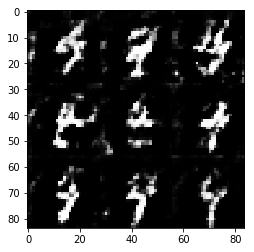

Epoch 1/2: Discriminator Loss: 0.758450 Generator Loss: 1.004883 Difference: 0.246434
Epoch 1/2: Discriminator Loss: 0.471615 Generator Loss: 1.957156 Difference: 1.485542
Epoch 1/2: Discriminator Loss: 1.075173 Generator Loss: 0.634328 Difference: -0.440845
Epoch 1/2: Discriminator Loss: 0.856690 Generator Loss: 1.163465 Difference: 0.306774
Epoch 1/2: Discriminator Loss: 0.925886 Generator Loss: 2.170689 Difference: 1.244803
Epoch 1/2: Discriminator Loss: 0.467382 Generator Loss: 3.262445 Difference: 2.795064
Tensor("generator_61/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_61/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_61/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_61/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_61/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_61/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


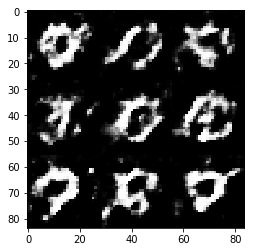

Epoch 1/2: Discriminator Loss: 1.971682 Generator Loss: 0.124101 Difference: -1.847582
Epoch 1/2: Discriminator Loss: 1.426139 Generator Loss: 2.092496 Difference: 0.666358
Epoch 1/2: Discriminator Loss: 1.860788 Generator Loss: 0.236814 Difference: -1.623974
Epoch 1/2: Discriminator Loss: 1.542459 Generator Loss: 0.639357 Difference: -0.903102
Epoch 1/2: Discriminator Loss: 1.242479 Generator Loss: 0.493860 Difference: -0.748619
Epoch 1/2: Discriminator Loss: 1.066509 Generator Loss: 1.215073 Difference: 0.148564
Tensor("generator_62/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_62/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_62/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_62/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_62/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_62/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


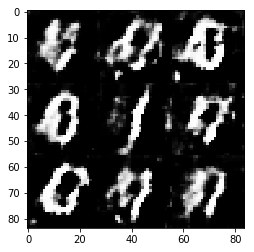

Epoch 1/2: Discriminator Loss: 1.819268 Generator Loss: 0.383347 Difference: -1.435920
Epoch 1/2: Discriminator Loss: 0.530512 Generator Loss: 1.730104 Difference: 1.199592
Epoch 1/2: Discriminator Loss: 0.406554 Generator Loss: 2.825246 Difference: 2.418692
Epoch 1/2: Discriminator Loss: 0.490652 Generator Loss: 1.726468 Difference: 1.235816
Epoch 2/2: Discriminator Loss: 1.740502 Generator Loss: 2.744066 Difference: 1.003564
Epoch 2/2: Discriminator Loss: 1.154767 Generator Loss: 0.863997 Difference: -0.290770
Tensor("generator_63/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_63/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_63/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_63/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_63/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_63/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


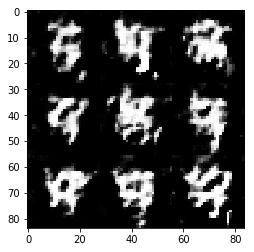

Epoch 2/2: Discriminator Loss: 0.898728 Generator Loss: 2.221495 Difference: 1.322767
Epoch 2/2: Discriminator Loss: 1.054053 Generator Loss: 1.391414 Difference: 0.337361
Epoch 2/2: Discriminator Loss: 1.007474 Generator Loss: 1.304345 Difference: 0.296871
Epoch 2/2: Discriminator Loss: 0.823490 Generator Loss: 1.060584 Difference: 0.237095
Epoch 2/2: Discriminator Loss: 0.929208 Generator Loss: 3.226393 Difference: 2.297186
Epoch 2/2: Discriminator Loss: 0.466856 Generator Loss: 2.228742 Difference: 1.761885
Tensor("generator_64/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_64/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_64/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_64/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_64/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_64/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


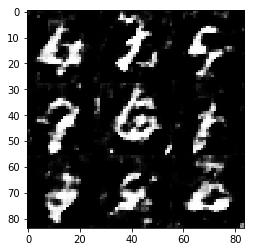

Epoch 2/2: Discriminator Loss: 0.664508 Generator Loss: 2.072295 Difference: 1.407787
Epoch 2/2: Discriminator Loss: 0.996059 Generator Loss: 0.662724 Difference: -0.333335
Epoch 2/2: Discriminator Loss: 3.133603 Generator Loss: 6.294495 Difference: 3.160892
Epoch 2/2: Discriminator Loss: 0.780501 Generator Loss: 0.603107 Difference: -0.177394
Epoch 2/2: Discriminator Loss: 0.817764 Generator Loss: 0.454556 Difference: -0.363208
Epoch 2/2: Discriminator Loss: 0.704960 Generator Loss: 0.378032 Difference: -0.326928
Tensor("generator_65/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_65/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_65/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_65/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_65/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_65/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


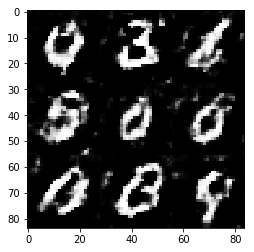

Epoch 2/2: Discriminator Loss: 1.291492 Generator Loss: 2.874733 Difference: 1.583241
Epoch 2/2: Discriminator Loss: 1.107164 Generator Loss: 0.848424 Difference: -0.258741
Epoch 2/2: Discriminator Loss: 0.553789 Generator Loss: 1.162703 Difference: 0.608913
Epoch 2/2: Discriminator Loss: 1.417578 Generator Loss: 0.264458 Difference: -1.153120
Epoch 2/2: Discriminator Loss: 0.709770 Generator Loss: 1.388156 Difference: 0.678386
Epoch 2/2: Discriminator Loss: 0.505425 Generator Loss: 1.591631 Difference: 1.086206
Tensor("generator_66/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_66/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_66/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_66/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_66/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_66/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


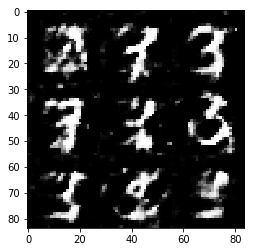

Epoch 2/2: Discriminator Loss: 1.301636 Generator Loss: 3.904751 Difference: 2.603115
Epoch 2/2: Discriminator Loss: 0.747630 Generator Loss: 2.374966 Difference: 1.627335
Epoch 2/2: Discriminator Loss: 0.932236 Generator Loss: 0.518335 Difference: -0.413901
Epoch 2/2: Discriminator Loss: 1.310565 Generator Loss: 0.454906 Difference: -0.855660
Epoch 2/2: Discriminator Loss: 1.075296 Generator Loss: 0.916403 Difference: -0.158893
Epoch 2/2: Discriminator Loss: 0.933316 Generator Loss: 1.015917 Difference: 0.082601
Tensor("generator_67/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_67/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_67/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_67/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_67/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_67/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


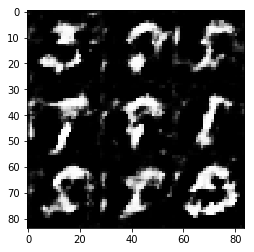

Epoch 2/2: Discriminator Loss: 0.576105 Generator Loss: 1.108111 Difference: 0.532006
Epoch 2/2: Discriminator Loss: 0.604913 Generator Loss: 2.650189 Difference: 2.045277
Epoch 2/2: Discriminator Loss: 0.806929 Generator Loss: 1.669836 Difference: 0.862907
Epoch 2/2: Discriminator Loss: 1.994111 Generator Loss: 0.215586 Difference: -1.778525
Epoch 2/2: Discriminator Loss: 1.181872 Generator Loss: 0.976400 Difference: -0.205473
Epoch 2/2: Discriminator Loss: 1.022199 Generator Loss: 0.606998 Difference: -0.415201
Tensor("generator_68/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_68/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_68/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_68/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_68/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_68/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


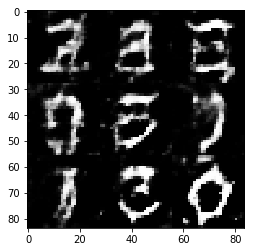

Epoch 2/2: Discriminator Loss: 0.488564 Generator Loss: 3.421345 Difference: 2.932781
Epoch 2/2: Discriminator Loss: 1.000303 Generator Loss: 0.655705 Difference: -0.344599
Epoch 2/2: Discriminator Loss: 1.498139 Generator Loss: 0.416434 Difference: -1.081706
Epoch 2/2: Discriminator Loss: 0.771986 Generator Loss: 0.952894 Difference: 0.180908
Epoch 2/2: Discriminator Loss: 1.282538 Generator Loss: 2.506573 Difference: 1.224035
Epoch 2/2: Discriminator Loss: 0.714858 Generator Loss: 0.943129 Difference: 0.228271
Tensor("generator_69/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_69/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_69/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_69/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_69/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_69/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


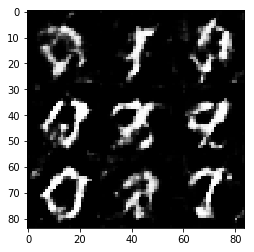

Epoch 2/2: Discriminator Loss: 0.690634 Generator Loss: 1.395785 Difference: 0.705151
Epoch 2/2: Discriminator Loss: 1.350513 Generator Loss: 1.368820 Difference: 0.018307
Epoch 2/2: Discriminator Loss: 1.049708 Generator Loss: 0.406231 Difference: -0.643477
Epoch 2/2: Discriminator Loss: 0.978277 Generator Loss: 1.089820 Difference: 0.111543
Epoch 2/2: Discriminator Loss: 0.961842 Generator Loss: 0.779246 Difference: -0.182596
Epoch 2/2: Discriminator Loss: 0.441251 Generator Loss: 1.135753 Difference: 0.694502
Tensor("generator_70/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_70/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_70/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_70/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_70/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_70/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


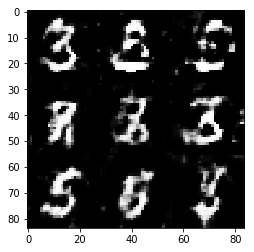

Epoch 2/2: Discriminator Loss: 0.419550 Generator Loss: 2.401973 Difference: 1.982423
Epoch 2/2: Discriminator Loss: 0.996421 Generator Loss: 1.706647 Difference: 0.710227
Epoch 2/2: Discriminator Loss: 1.490855 Generator Loss: 1.043608 Difference: -0.447246
Epoch 2/2: Discriminator Loss: 0.765771 Generator Loss: 1.291415 Difference: 0.525644
Epoch 2/2: Discriminator Loss: 0.736654 Generator Loss: 0.443479 Difference: -0.293176
Epoch 2/2: Discriminator Loss: 0.932532 Generator Loss: 0.643226 Difference: -0.289306
Tensor("generator_71/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_71/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_71/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_71/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_71/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_71/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


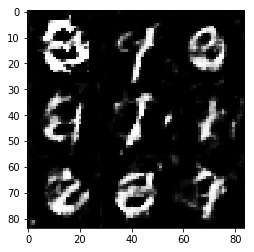

Epoch 2/2: Discriminator Loss: 0.716512 Generator Loss: 1.253121 Difference: 0.536608
Epoch 2/2: Discriminator Loss: 1.017328 Generator Loss: 1.162830 Difference: 0.145502
Epoch 2/2: Discriminator Loss: 1.467909 Generator Loss: 0.376423 Difference: -1.091486
Epoch 2/2: Discriminator Loss: 0.481199 Generator Loss: 2.644931 Difference: 2.163732
Epoch 2/2: Discriminator Loss: 0.943744 Generator Loss: 1.445680 Difference: 0.501936
Epoch 2/2: Discriminator Loss: 0.691108 Generator Loss: 1.467010 Difference: 0.775902
Tensor("generator_72/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_72/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_72/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_72/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_72/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_72/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


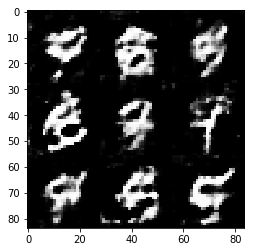

Epoch 2/2: Discriminator Loss: 1.237549 Generator Loss: 0.584515 Difference: -0.653034
Epoch 2/2: Discriminator Loss: 3.329366 Generator Loss: 0.159906 Difference: -3.169460
Epoch 2/2: Discriminator Loss: 1.694292 Generator Loss: 4.884053 Difference: 3.189761
Epoch 2/2: Discriminator Loss: 0.604371 Generator Loss: 2.223350 Difference: 1.618979
Epoch 2/2: Discriminator Loss: 0.666662 Generator Loss: 0.575456 Difference: -0.091206
Epoch 2/2: Discriminator Loss: 0.852356 Generator Loss: 0.367946 Difference: -0.484411
Tensor("generator_73/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_73/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_73/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_73/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_73/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_73/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


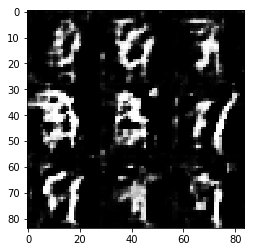

Epoch 2/2: Discriminator Loss: 1.248634 Generator Loss: 1.716771 Difference: 0.468137
Epoch 2/2: Discriminator Loss: 0.672211 Generator Loss: 1.865757 Difference: 1.193546
Epoch 2/2: Discriminator Loss: 0.723163 Generator Loss: 1.361087 Difference: 0.637924
Epoch 2/2: Discriminator Loss: 0.634519 Generator Loss: 1.303252 Difference: 0.668733
Epoch 2/2: Discriminator Loss: 1.340719 Generator Loss: 0.661761 Difference: -0.678958
Epoch 2/2: Discriminator Loss: 0.574900 Generator Loss: 2.431894 Difference: 1.856994
Tensor("generator_74/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_74/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_74/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_74/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_74/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_74/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


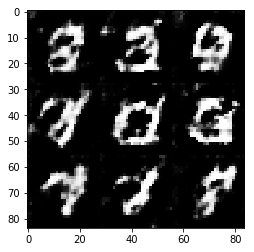

Epoch 2/2: Discriminator Loss: 1.453434 Generator Loss: 0.682001 Difference: -0.771433
Epoch 2/2: Discriminator Loss: 1.046304 Generator Loss: 0.469485 Difference: -0.576819
Epoch 2/2: Discriminator Loss: 1.097077 Generator Loss: 1.093018 Difference: -0.004059
Epoch 2/2: Discriminator Loss: 1.132842 Generator Loss: 1.634295 Difference: 0.501453
Epoch 2/2: Discriminator Loss: 1.077286 Generator Loss: 0.254349 Difference: -0.822936
Epoch 2/2: Discriminator Loss: 0.424581 Generator Loss: 1.819684 Difference: 1.395103
Tensor("generator_75/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_75/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_75/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_75/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_75/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_75/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


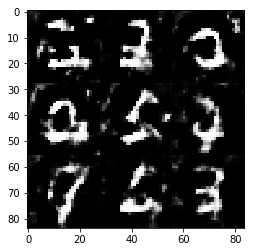

Epoch 2/2: Discriminator Loss: 1.563450 Generator Loss: 0.791345 Difference: -0.772104
Epoch 2/2: Discriminator Loss: 0.675357 Generator Loss: 0.995673 Difference: 0.320316
Epoch 2/2: Discriminator Loss: 0.827223 Generator Loss: 1.258936 Difference: 0.431713
Epoch 2/2: Discriminator Loss: 0.537126 Generator Loss: 1.017362 Difference: 0.480236
Epoch 2/2: Discriminator Loss: 2.099270 Generator Loss: 0.964001 Difference: -1.135269
Epoch 2/2: Discriminator Loss: 0.786134 Generator Loss: 1.383459 Difference: 0.597324
Tensor("generator_76/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_76/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_76/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_76/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_76/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_76/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


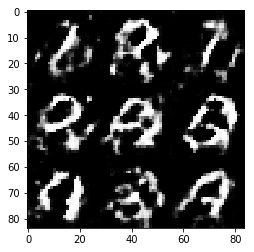

Epoch 2/2: Discriminator Loss: 0.902501 Generator Loss: 1.264117 Difference: 0.361615
Epoch 2/2: Discriminator Loss: 0.428603 Generator Loss: 3.037151 Difference: 2.608548
Epoch 2/2: Discriminator Loss: 0.708209 Generator Loss: 1.856088 Difference: 1.147879
Epoch 2/2: Discriminator Loss: 0.444526 Generator Loss: 2.070797 Difference: 1.626271
Epoch 2/2: Discriminator Loss: 0.971532 Generator Loss: 0.741193 Difference: -0.230339
Epoch 2/2: Discriminator Loss: 0.648204 Generator Loss: 3.075334 Difference: 2.427130
Tensor("generator_77/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_77/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_77/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_77/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_77/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_77/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


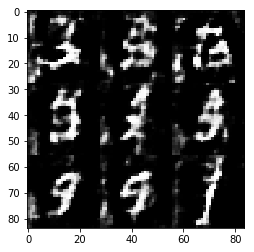

Epoch 2/2: Discriminator Loss: 0.501794 Generator Loss: 3.666472 Difference: 3.164678
Epoch 2/2: Discriminator Loss: 0.689431 Generator Loss: 2.166304 Difference: 1.476873
Epoch 2/2: Discriminator Loss: 0.711238 Generator Loss: 1.366063 Difference: 0.654825
Epoch 2/2: Discriminator Loss: 1.461096 Generator Loss: 0.510884 Difference: -0.950212
Epoch 2/2: Discriminator Loss: 0.534670 Generator Loss: 3.310681 Difference: 2.776011
Epoch 2/2: Discriminator Loss: 0.538028 Generator Loss: 1.581437 Difference: 1.043409
Tensor("generator_78/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_78/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_78/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_78/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_78/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_78/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


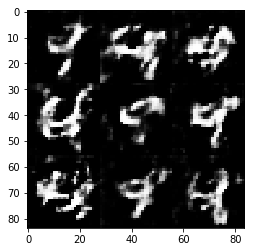

Epoch 2/2: Discriminator Loss: 0.508582 Generator Loss: 1.892819 Difference: 1.384237
Epoch 2/2: Discriminator Loss: 1.992397 Generator Loss: 0.476211 Difference: -1.516185
Epoch 2/2: Discriminator Loss: 1.044164 Generator Loss: 3.839960 Difference: 2.795796
Epoch 2/2: Discriminator Loss: 0.722454 Generator Loss: 1.322021 Difference: 0.599566
Epoch 2/2: Discriminator Loss: 0.580737 Generator Loss: 1.695150 Difference: 1.114413
Epoch 2/2: Discriminator Loss: 0.958536 Generator Loss: 0.766418 Difference: -0.192118
Tensor("generator_79/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_79/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_79/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_79/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_79/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_79/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


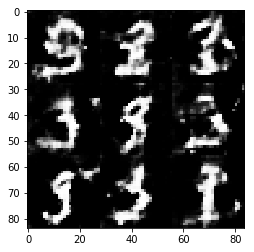

Epoch 2/2: Discriminator Loss: 0.698176 Generator Loss: 2.538112 Difference: 1.839936
Epoch 2/2: Discriminator Loss: 0.837120 Generator Loss: 1.815909 Difference: 0.978789
Epoch 2/2: Discriminator Loss: 0.898564 Generator Loss: 2.983212 Difference: 2.084648
Epoch 2/2: Discriminator Loss: 1.901215 Generator Loss: 0.300410 Difference: -1.600806
Epoch 2/2: Discriminator Loss: 0.705063 Generator Loss: 1.919974 Difference: 1.214911
Epoch 2/2: Discriminator Loss: 0.935753 Generator Loss: 1.396058 Difference: 0.460305
Tensor("generator_80/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_80/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_80/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_80/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_80/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_80/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


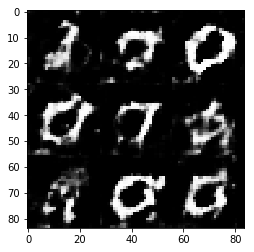

Epoch 2/2: Discriminator Loss: 0.511270 Generator Loss: 1.094888 Difference: 0.583618
Epoch 2/2: Discriminator Loss: 0.892416 Generator Loss: 1.311695 Difference: 0.419279
Epoch 2/2: Discriminator Loss: 0.856225 Generator Loss: 2.898362 Difference: 2.042137
Epoch 2/2: Discriminator Loss: 3.066731 Generator Loss: 0.121673 Difference: -2.945058
Epoch 2/2: Discriminator Loss: 0.675899 Generator Loss: 1.544453 Difference: 0.868555
Epoch 2/2: Discriminator Loss: 0.442202 Generator Loss: 2.371664 Difference: 1.929462
Tensor("generator_81/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_81/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_81/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_81/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_81/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_81/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


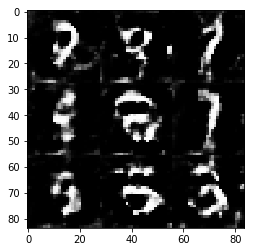

Epoch 2/2: Discriminator Loss: 0.588531 Generator Loss: 1.262698 Difference: 0.674167
Epoch 2/2: Discriminator Loss: 1.077958 Generator Loss: 0.375937 Difference: -0.702022
Epoch 2/2: Discriminator Loss: 0.571937 Generator Loss: 2.805267 Difference: 2.233330
Epoch 2/2: Discriminator Loss: 0.715559 Generator Loss: 1.920541 Difference: 1.204982
Epoch 2/2: Discriminator Loss: 0.392050 Generator Loss: 5.311947 Difference: 4.919897
Epoch 2/2: Discriminator Loss: 0.833765 Generator Loss: 1.108734 Difference: 0.274969
Tensor("generator_82/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_82/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_82/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_82/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_82/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_82/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


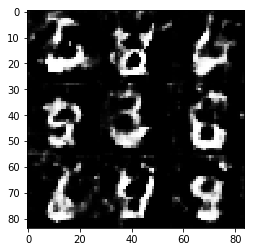

Epoch 2/2: Discriminator Loss: 0.661954 Generator Loss: 1.428193 Difference: 0.766239
Epoch 2/2: Discriminator Loss: 0.538587 Generator Loss: 2.743740 Difference: 2.205153
Epoch 2/2: Discriminator Loss: 0.950264 Generator Loss: 1.131538 Difference: 0.181274
Epoch 2/2: Discriminator Loss: 1.047147 Generator Loss: 1.579243 Difference: 0.532096
Epoch 2/2: Discriminator Loss: 1.763232 Generator Loss: 0.813514 Difference: -0.949717
Epoch 2/2: Discriminator Loss: 1.117625 Generator Loss: 1.495069 Difference: 0.377444
Tensor("generator_83/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_83/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_83/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_83/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_83/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_83/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


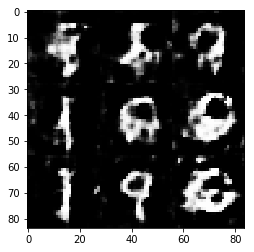

Epoch 2/2: Discriminator Loss: 0.375125 Generator Loss: 4.117779 Difference: 3.742653
Epoch 2/2: Discriminator Loss: 0.857968 Generator Loss: 1.293796 Difference: 0.435829
Epoch 2/2: Discriminator Loss: 0.530789 Generator Loss: 1.857665 Difference: 1.326876
Epoch 2/2: Discriminator Loss: 2.700017 Generator Loss: 0.061013 Difference: -2.639004
Epoch 2/2: Discriminator Loss: 1.882259 Generator Loss: 0.230783 Difference: -1.651476
Epoch 2/2: Discriminator Loss: 0.468330 Generator Loss: 1.783022 Difference: 1.314693
Tensor("generator_84/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_84/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_84/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_84/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_84/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_84/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


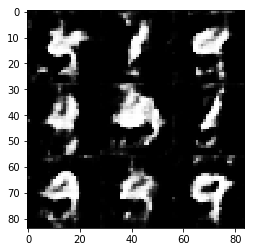

Epoch 2/2: Discriminator Loss: 0.736448 Generator Loss: 1.355602 Difference: 0.619154
Epoch 2/2: Discriminator Loss: 1.132981 Generator Loss: 0.694684 Difference: -0.438297
Epoch 2/2: Discriminator Loss: 2.224139 Generator Loss: 0.205006 Difference: -2.019134
Epoch 2/2: Discriminator Loss: 0.507423 Generator Loss: 2.775577 Difference: 2.268153
Epoch 2/2: Discriminator Loss: 1.167616 Generator Loss: 1.005857 Difference: -0.161759
Epoch 2/2: Discriminator Loss: 0.749166 Generator Loss: 1.633256 Difference: 0.884090
Tensor("generator_85/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_85/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_85/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_85/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_85/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_85/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


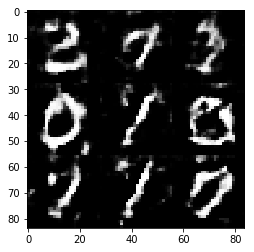

Epoch 2/2: Discriminator Loss: 0.720456 Generator Loss: 1.133384 Difference: 0.412928
Epoch 2/2: Discriminator Loss: 0.593427 Generator Loss: 1.364635 Difference: 0.771208
Epoch 2/2: Discriminator Loss: 1.758102 Generator Loss: 0.379020 Difference: -1.379082
Epoch 2/2: Discriminator Loss: 1.123196 Generator Loss: 1.024427 Difference: -0.098769
Epoch 2/2: Discriminator Loss: 0.498115 Generator Loss: 2.537429 Difference: 2.039313
Epoch 2/2: Discriminator Loss: 0.883762 Generator Loss: 0.974519 Difference: 0.090757
Tensor("generator_86/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_86/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_86/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_86/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_86/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_86/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


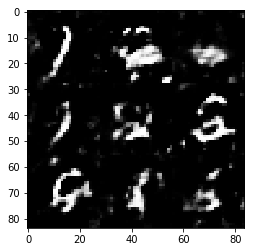

Epoch 2/2: Discriminator Loss: 0.476459 Generator Loss: 3.916108 Difference: 3.439649
Epoch 2/2: Discriminator Loss: 0.511658 Generator Loss: 3.804363 Difference: 3.292705
Epoch 2/2: Discriminator Loss: 0.707917 Generator Loss: 1.658160 Difference: 0.950242
Epoch 2/2: Discriminator Loss: 0.787480 Generator Loss: 1.861161 Difference: 1.073681
Epoch 2/2: Discriminator Loss: 1.361584 Generator Loss: 1.081084 Difference: -0.280500
Epoch 2/2: Discriminator Loss: 0.512490 Generator Loss: 1.704005 Difference: 1.191515
Tensor("generator_87/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_87/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_87/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_87/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_87/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_87/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


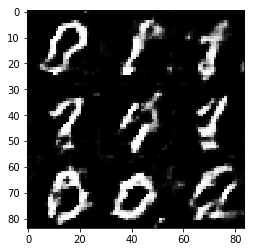

Epoch 2/2: Discriminator Loss: 0.621602 Generator Loss: 2.172043 Difference: 1.550441
Epoch 2/2: Discriminator Loss: 0.538133 Generator Loss: 2.358715 Difference: 1.820582
Epoch 2/2: Discriminator Loss: 0.546055 Generator Loss: 2.040960 Difference: 1.494905
Epoch 2/2: Discriminator Loss: 0.746781 Generator Loss: 4.883601 Difference: 4.136820
Epoch 2/2: Discriminator Loss: 1.132182 Generator Loss: 0.814470 Difference: -0.317712
Epoch 2/2: Discriminator Loss: 1.634284 Generator Loss: 0.335433 Difference: -1.298851
Tensor("generator_88/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_88/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_88/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_88/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_88/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_88/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


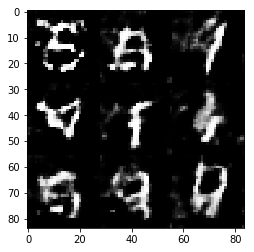

Epoch 2/2: Discriminator Loss: 0.519849 Generator Loss: 1.654879 Difference: 1.135029
Epoch 2/2: Discriminator Loss: 1.278841 Generator Loss: 1.215391 Difference: -0.063450
Epoch 2/2: Discriminator Loss: 1.269160 Generator Loss: 0.658152 Difference: -0.611008
Epoch 2/2: Discriminator Loss: 0.713609 Generator Loss: 2.793519 Difference: 2.079910
Epoch 2/2: Discriminator Loss: 0.878446 Generator Loss: 1.030878 Difference: 0.152432
Epoch 2/2: Discriminator Loss: 0.527902 Generator Loss: 2.757407 Difference: 2.229505
Tensor("generator_89/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_89/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_89/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_89/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_89/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_89/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


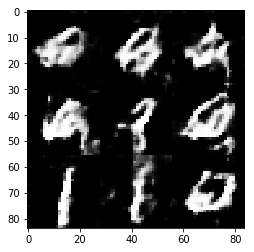

Epoch 2/2: Discriminator Loss: 1.471227 Generator Loss: 0.927675 Difference: -0.543552
Epoch 2/2: Discriminator Loss: 1.460051 Generator Loss: 0.529175 Difference: -0.930876
Epoch 2/2: Discriminator Loss: 0.893827 Generator Loss: 0.935199 Difference: 0.041371
Epoch 2/2: Discriminator Loss: 1.728779 Generator Loss: 0.824954 Difference: -0.903825
Epoch 2/2: Discriminator Loss: 0.466556 Generator Loss: 3.088359 Difference: 2.621803
Epoch 2/2: Discriminator Loss: 1.431211 Generator Loss: 1.806470 Difference: 0.375259
Tensor("generator_90/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_90/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_90/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_90/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_90/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_90/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


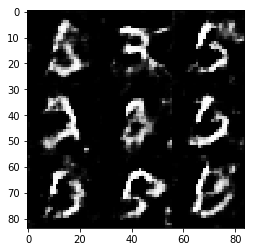

Epoch 2/2: Discriminator Loss: 0.580779 Generator Loss: 0.771130 Difference: 0.190351
Epoch 2/2: Discriminator Loss: 0.805500 Generator Loss: 1.209552 Difference: 0.404052
Epoch 2/2: Discriminator Loss: 0.520620 Generator Loss: 0.853313 Difference: 0.332693
Epoch 2/2: Discriminator Loss: 0.463363 Generator Loss: 3.188890 Difference: 2.725528
Epoch 2/2: Discriminator Loss: 0.500851 Generator Loss: 1.629985 Difference: 1.129134
Epoch 2/2: Discriminator Loss: 0.502448 Generator Loss: 2.446883 Difference: 1.944435
Tensor("generator_91/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_91/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_91/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_91/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_91/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_91/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


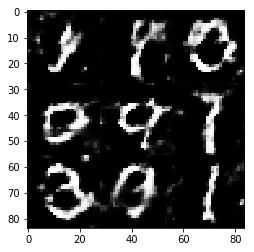

Epoch 2/2: Discriminator Loss: 0.892065 Generator Loss: 1.199974 Difference: 0.307909
Epoch 2/2: Discriminator Loss: 0.607575 Generator Loss: 2.630216 Difference: 2.022642
Epoch 2/2: Discriminator Loss: 0.491172 Generator Loss: 1.119913 Difference: 0.628741
Epoch 2/2: Discriminator Loss: 1.023983 Generator Loss: 1.137174 Difference: 0.113191
Epoch 2/2: Discriminator Loss: 0.611440 Generator Loss: 1.938258 Difference: 1.326818
Epoch 2/2: Discriminator Loss: 0.825381 Generator Loss: 1.872310 Difference: 1.046929
Tensor("generator_92/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_92/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_92/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_92/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_92/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_92/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


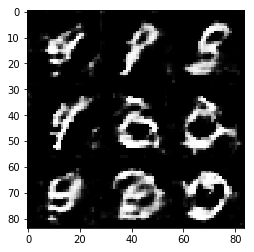

Epoch 2/2: Discriminator Loss: 0.545260 Generator Loss: 5.019563 Difference: 4.474303
Epoch 2/2: Discriminator Loss: 0.955662 Generator Loss: 1.430450 Difference: 0.474787
Epoch 2/2: Discriminator Loss: 0.520831 Generator Loss: 1.856359 Difference: 1.335528
Epoch 2/2: Discriminator Loss: 0.733558 Generator Loss: 2.886595 Difference: 2.153037
Epoch 2/2: Discriminator Loss: 0.587368 Generator Loss: 2.074836 Difference: 1.487468
Epoch 2/2: Discriminator Loss: 0.402420 Generator Loss: 4.186914 Difference: 3.784495
Tensor("generator_93/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_93/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_93/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_93/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_93/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_93/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


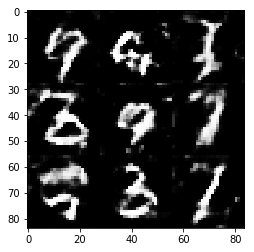

Epoch 2/2: Discriminator Loss: 0.661871 Generator Loss: 0.996799 Difference: 0.334928
Epoch 2/2: Discriminator Loss: 0.728349 Generator Loss: 0.783462 Difference: 0.055113
Epoch 2/2: Discriminator Loss: 1.293838 Generator Loss: 5.625590 Difference: 4.331752
Epoch 2/2: Discriminator Loss: 0.366871 Generator Loss: 2.251477 Difference: 1.884605
Epoch 2/2: Discriminator Loss: 0.396058 Generator Loss: 2.733124 Difference: 2.337066
Epoch 2/2: Discriminator Loss: 0.707427 Generator Loss: 1.917060 Difference: 1.209633
Tensor("generator_94/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_94/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_94/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_94/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_94/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_94/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


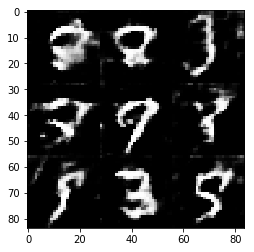

Epoch 2/2: Discriminator Loss: 0.442273 Generator Loss: 1.503517 Difference: 1.061243
Epoch 2/2: Discriminator Loss: 0.556818 Generator Loss: 1.986144 Difference: 1.429326
Epoch 2/2: Discriminator Loss: 0.436870 Generator Loss: 2.949584 Difference: 2.512714
Epoch 2/2: Discriminator Loss: 0.498158 Generator Loss: 2.404276 Difference: 1.906118
Epoch 2/2: Discriminator Loss: 0.889787 Generator Loss: 0.882281 Difference: -0.007506
Epoch 2/2: Discriminator Loss: 0.992716 Generator Loss: 1.274753 Difference: 0.282037
Tensor("generator_95/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_95/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_95/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_95/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_95/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_95/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


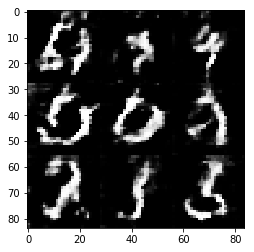

Epoch 2/2: Discriminator Loss: 0.601386 Generator Loss: 2.295298 Difference: 1.693913
Epoch 2/2: Discriminator Loss: 1.868971 Generator Loss: 0.318332 Difference: -1.550639
Epoch 2/2: Discriminator Loss: 0.775473 Generator Loss: 1.126069 Difference: 0.350596
Epoch 2/2: Discriminator Loss: 0.677232 Generator Loss: 0.794427 Difference: 0.117195
Epoch 2/2: Discriminator Loss: 0.671764 Generator Loss: 1.813568 Difference: 1.141804
Epoch 2/2: Discriminator Loss: 0.520601 Generator Loss: 1.756013 Difference: 1.235412
Tensor("generator_96/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_96/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_96/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_96/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_96/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_96/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


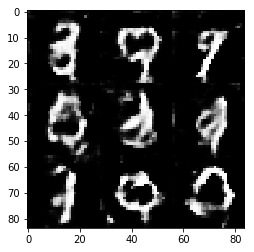

Epoch 2/2: Discriminator Loss: 1.991806 Generator Loss: 0.409954 Difference: -1.581851
Epoch 2/2: Discriminator Loss: 1.068955 Generator Loss: 1.398772 Difference: 0.329817
Epoch 2/2: Discriminator Loss: 0.684403 Generator Loss: 1.983425 Difference: 1.299022
Epoch 2/2: Discriminator Loss: 0.600189 Generator Loss: 1.265250 Difference: 0.665060
Epoch 2/2: Discriminator Loss: 0.642512 Generator Loss: 0.912926 Difference: 0.270414
Epoch 2/2: Discriminator Loss: 0.533578 Generator Loss: 1.899675 Difference: 1.366096
Tensor("generator_97/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_97/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_97/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_97/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_97/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_97/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


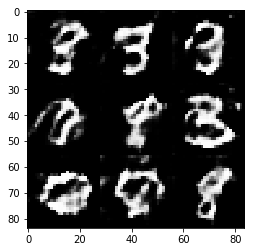

Epoch 2/2: Discriminator Loss: 1.537307 Generator Loss: 0.434521 Difference: -1.102786
Epoch 2/2: Discriminator Loss: 0.476593 Generator Loss: 0.833781 Difference: 0.357188
Epoch 2/2: Discriminator Loss: 0.646852 Generator Loss: 1.361921 Difference: 0.715068
Epoch 2/2: Discriminator Loss: 0.831799 Generator Loss: 2.296426 Difference: 1.464628
Epoch 2/2: Discriminator Loss: 0.675552 Generator Loss: 2.338967 Difference: 1.663414
Epoch 2/2: Discriminator Loss: 1.033979 Generator Loss: 1.016109 Difference: -0.017870
Tensor("generator_98/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_98/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_98/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_98/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_98/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_98/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


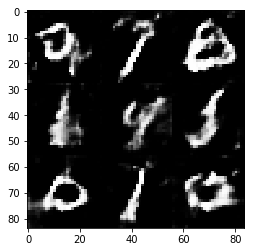

Epoch 2/2: Discriminator Loss: 0.654939 Generator Loss: 2.100663 Difference: 1.445724
Epoch 2/2: Discriminator Loss: 0.466871 Generator Loss: 2.253052 Difference: 1.786181
Epoch 2/2: Discriminator Loss: 0.423352 Generator Loss: 2.174079 Difference: 1.750727
Epoch 2/2: Discriminator Loss: 0.599691 Generator Loss: 2.629475 Difference: 2.029784
Epoch 2/2: Discriminator Loss: 0.733257 Generator Loss: 2.308647 Difference: 1.575389
Epoch 2/2: Discriminator Loss: 0.863698 Generator Loss: 2.267019 Difference: 1.403320
Tensor("generator_99/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_99/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_99/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_99/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_99/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_99/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


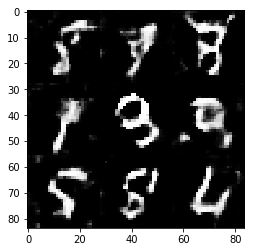

Epoch 2/2: Discriminator Loss: 1.377726 Generator Loss: 0.608191 Difference: -0.769535
Epoch 2/2: Discriminator Loss: 0.980678 Generator Loss: 2.448379 Difference: 1.467701
Epoch 2/2: Discriminator Loss: 0.435970 Generator Loss: 1.258817 Difference: 0.822847
Epoch 2/2: Discriminator Loss: 0.516120 Generator Loss: 1.597885 Difference: 1.081766
Epoch 2/2: Discriminator Loss: 0.619471 Generator Loss: 1.718470 Difference: 1.098999
Epoch 2/2: Discriminator Loss: 1.728936 Generator Loss: 0.961980 Difference: -0.766956
Tensor("generator_100/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_100/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_100/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_100/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_100/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_100/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


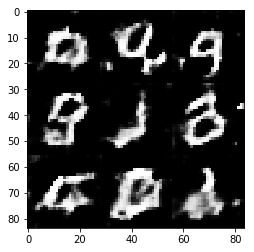

Epoch 2/2: Discriminator Loss: 0.486904 Generator Loss: 0.707766 Difference: 0.220862
Epoch 2/2: Discriminator Loss: 2.802584 Generator Loss: 0.386148 Difference: -2.416436
Epoch 2/2: Discriminator Loss: 0.769011 Generator Loss: 1.632536 Difference: 0.863525
Epoch 2/2: Discriminator Loss: 1.191140 Generator Loss: 0.246533 Difference: -0.944607
Epoch 2/2: Discriminator Loss: 1.199418 Generator Loss: 2.363466 Difference: 1.164047
Epoch 2/2: Discriminator Loss: 1.792773 Generator Loss: 0.477969 Difference: -1.314804
Tensor("generator_101/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_101/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_101/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_101/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_101/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_101/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


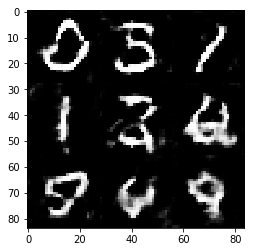

Epoch 2/2: Discriminator Loss: 2.271160 Generator Loss: 0.206621 Difference: -2.064538
Epoch 2/2: Discriminator Loss: 1.046039 Generator Loss: 4.060489 Difference: 3.014449
Epoch 2/2: Discriminator Loss: 0.468812 Generator Loss: 3.191537 Difference: 2.722725
Epoch 2/2: Discriminator Loss: 0.454510 Generator Loss: 2.475675 Difference: 2.021166
Epoch 2/2: Discriminator Loss: 0.762023 Generator Loss: 0.849096 Difference: 0.087072
Epoch 2/2: Discriminator Loss: 0.576389 Generator Loss: 1.838152 Difference: 1.261763
Tensor("generator_102/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_102/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_102/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_102/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_102/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_102/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


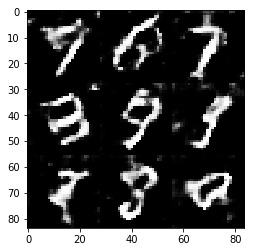

Epoch 2/2: Discriminator Loss: 1.480667 Generator Loss: 0.884594 Difference: -0.596074
Epoch 2/2: Discriminator Loss: 0.697416 Generator Loss: 3.192467 Difference: 2.495051
Epoch 2/2: Discriminator Loss: 0.437723 Generator Loss: 1.218864 Difference: 0.781141
Epoch 2/2: Discriminator Loss: 0.548859 Generator Loss: 2.629326 Difference: 2.080467
Epoch 2/2: Discriminator Loss: 0.599805 Generator Loss: 2.948045 Difference: 2.348240
Epoch 2/2: Discriminator Loss: 1.036195 Generator Loss: 0.890777 Difference: -0.145417
Tensor("generator_103/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_103/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_103/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_103/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_103/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_103/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


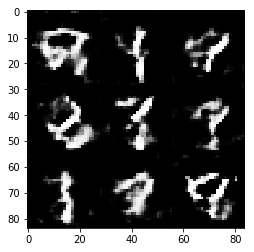

Epoch 2/2: Discriminator Loss: 0.961963 Generator Loss: 1.410510 Difference: 0.448547
Epoch 2/2: Discriminator Loss: 0.903319 Generator Loss: 3.261984 Difference: 2.358665
Epoch 2/2: Discriminator Loss: 0.526204 Generator Loss: 2.912842 Difference: 2.386639
Epoch 2/2: Discriminator Loss: 1.199888 Generator Loss: 0.261930 Difference: -0.937958
Epoch 2/2: Discriminator Loss: 0.709316 Generator Loss: 3.269824 Difference: 2.560509
Epoch 2/2: Discriminator Loss: 0.717536 Generator Loss: 0.813448 Difference: 0.095913
Tensor("generator_104/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_104/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_104/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_104/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_104/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_104/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


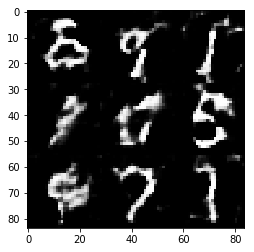

Epoch 2/2: Discriminator Loss: 0.591326 Generator Loss: 1.852582 Difference: 1.261256
Epoch 2/2: Discriminator Loss: 0.425638 Generator Loss: 2.963518 Difference: 2.537879
Epoch 2/2: Discriminator Loss: 0.670778 Generator Loss: 1.915562 Difference: 1.244783
Epoch 2/2: Discriminator Loss: 0.599140 Generator Loss: 1.558355 Difference: 0.959214
Epoch 2/2: Discriminator Loss: 1.123963 Generator Loss: 0.515742 Difference: -0.608221
Epoch 2/2: Discriminator Loss: 1.056268 Generator Loss: 0.893639 Difference: -0.162628
Tensor("generator_105/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_105/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_105/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_105/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_105/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_105/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


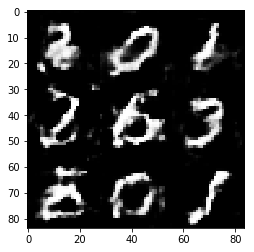

Epoch 2/2: Discriminator Loss: 0.602407 Generator Loss: 2.246887 Difference: 1.644481
Epoch 2/2: Discriminator Loss: 0.677673 Generator Loss: 0.525521 Difference: -0.152152
Epoch 2/2: Discriminator Loss: 1.240518 Generator Loss: 1.247665 Difference: 0.007146
Epoch 2/2: Discriminator Loss: 2.245109 Generator Loss: 0.588218 Difference: -1.656891
Epoch 2/2: Discriminator Loss: 1.611384 Generator Loss: 3.107442 Difference: 1.496057
Epoch 2/2: Discriminator Loss: 0.539664 Generator Loss: 1.363293 Difference: 0.823629
Tensor("generator_106/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_106/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_106/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_106/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_106/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_106/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


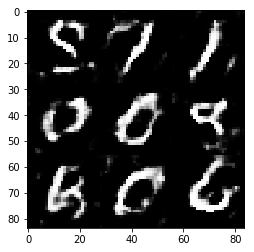

Epoch 2/2: Discriminator Loss: 0.591134 Generator Loss: 2.904037 Difference: 2.312902
Epoch 2/2: Discriminator Loss: 0.687586 Generator Loss: 0.735606 Difference: 0.048019
Epoch 2/2: Discriminator Loss: 0.576044 Generator Loss: 1.631165 Difference: 1.055120
Epoch 2/2: Discriminator Loss: 0.636359 Generator Loss: 1.543039 Difference: 0.906680
Epoch 2/2: Discriminator Loss: 0.494203 Generator Loss: 1.478912 Difference: 0.984708
Epoch 2/2: Discriminator Loss: 0.926660 Generator Loss: 0.870953 Difference: -0.055707
Tensor("generator_107/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_107/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_107/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_107/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_107/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_107/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


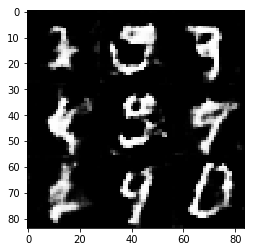

Epoch 2/2: Discriminator Loss: 1.336477 Generator Loss: 0.502636 Difference: -0.833841
Epoch 2/2: Discriminator Loss: 0.702430 Generator Loss: 2.093318 Difference: 1.390888
Epoch 2/2: Discriminator Loss: 0.713811 Generator Loss: 1.172369 Difference: 0.458557
Epoch 2/2: Discriminator Loss: 0.780276 Generator Loss: 1.786598 Difference: 1.006322
Epoch 2/2: Discriminator Loss: 0.746116 Generator Loss: 0.432688 Difference: -0.313427
Epoch 2/2: Discriminator Loss: 3.393298 Generator Loss: 0.079186 Difference: -3.314112
Tensor("generator_108/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_108/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_108/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_108/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_108/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_108/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


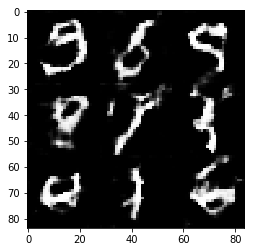

Epoch 2/2: Discriminator Loss: 1.809759 Generator Loss: 0.315191 Difference: -1.494568
Epoch 2/2: Discriminator Loss: 0.702676 Generator Loss: 0.951572 Difference: 0.248896
Epoch 2/2: Discriminator Loss: 0.518470 Generator Loss: 1.591558 Difference: 1.073088
Epoch 2/2: Discriminator Loss: 1.007403 Generator Loss: 0.809591 Difference: -0.197812
Epoch 2/2: Discriminator Loss: 0.461656 Generator Loss: 1.863209 Difference: 1.401553
Epoch 2/2: Discriminator Loss: 0.867904 Generator Loss: 2.115024 Difference: 1.247120
Tensor("generator_109/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_109/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_109/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_109/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_109/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_109/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


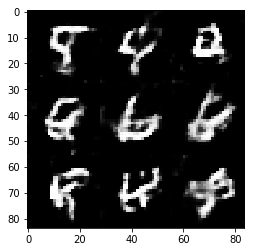

Epoch 2/2: Discriminator Loss: 0.837821 Generator Loss: 1.840027 Difference: 1.002206
Epoch 2/2: Discriminator Loss: 1.567508 Generator Loss: 0.613757 Difference: -0.953750
Epoch 2/2: Discriminator Loss: 1.384997 Generator Loss: 1.516932 Difference: 0.131935
Epoch 2/2: Discriminator Loss: 0.505859 Generator Loss: 4.192081 Difference: 3.686222
Epoch 2/2: Discriminator Loss: 0.527233 Generator Loss: 0.403548 Difference: -0.123685
Epoch 2/2: Discriminator Loss: 0.727811 Generator Loss: 2.082386 Difference: 1.354575
Tensor("generator_110/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_110/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_110/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_110/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_110/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_110/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


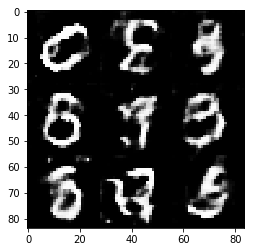

Epoch 2/2: Discriminator Loss: 1.055023 Generator Loss: 0.953201 Difference: -0.101822
Epoch 2/2: Discriminator Loss: 0.682923 Generator Loss: 1.323161 Difference: 0.640238
Epoch 2/2: Discriminator Loss: 0.892257 Generator Loss: 4.269294 Difference: 3.377037
Epoch 2/2: Discriminator Loss: 0.605767 Generator Loss: 1.524762 Difference: 0.918995
Epoch 2/2: Discriminator Loss: 0.659613 Generator Loss: 1.555514 Difference: 0.895900
Epoch 2/2: Discriminator Loss: 1.221224 Generator Loss: 1.695891 Difference: 0.474667
Tensor("generator_111/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_111/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_111/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_111/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_111/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_111/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


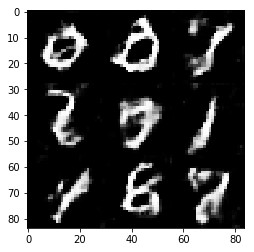

Epoch 2/2: Discriminator Loss: 0.854754 Generator Loss: 0.621527 Difference: -0.233227
Epoch 2/2: Discriminator Loss: 0.663820 Generator Loss: 1.447229 Difference: 0.783409
Epoch 2/2: Discriminator Loss: 1.563147 Generator Loss: 1.613035 Difference: 0.049888
Epoch 2/2: Discriminator Loss: 1.148451 Generator Loss: 1.377291 Difference: 0.228840
Epoch 2/2: Discriminator Loss: 1.445051 Generator Loss: 0.342359 Difference: -1.102692
Epoch 2/2: Discriminator Loss: 1.279288 Generator Loss: 0.427724 Difference: -0.851565
Tensor("generator_112/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_112/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_112/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_112/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_112/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_112/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


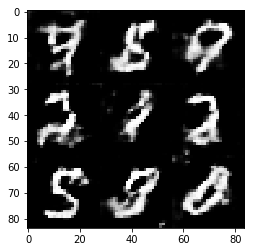

Epoch 2/2: Discriminator Loss: 0.480943 Generator Loss: 1.928561 Difference: 1.447618
Epoch 2/2: Discriminator Loss: 0.726971 Generator Loss: 3.233972 Difference: 2.507001
Epoch 2/2: Discriminator Loss: 0.790975 Generator Loss: 0.886674 Difference: 0.095698
Epoch 2/2: Discriminator Loss: 0.440410 Generator Loss: 2.635326 Difference: 2.194916
Epoch 2/2: Discriminator Loss: 0.539278 Generator Loss: 2.287107 Difference: 1.747829
Epoch 2/2: Discriminator Loss: 0.761974 Generator Loss: 1.175268 Difference: 0.413295
Tensor("generator_113/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_113/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_113/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_113/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_113/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_113/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


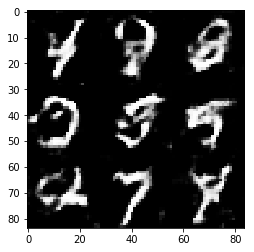

Epoch 2/2: Discriminator Loss: 1.546005 Generator Loss: 0.324559 Difference: -1.221446
Epoch 2/2: Discriminator Loss: 1.469925 Generator Loss: 2.059266 Difference: 0.589340
Epoch 2/2: Discriminator Loss: 0.397032 Generator Loss: 1.738269 Difference: 1.341237
Epoch 2/2: Discriminator Loss: 0.887911 Generator Loss: 0.932034 Difference: 0.044122
Epoch 2/2: Discriminator Loss: 1.363590 Generator Loss: 4.517961 Difference: 3.154371
Epoch 2/2: Discriminator Loss: 0.564440 Generator Loss: 2.548039 Difference: 1.983599
Tensor("generator_114/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_114/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_114/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_114/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_114/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_114/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


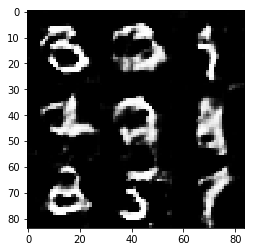

Epoch 2/2: Discriminator Loss: 0.485658 Generator Loss: 1.467460 Difference: 0.981801
Epoch 2/2: Discriminator Loss: 1.119826 Generator Loss: 1.938164 Difference: 0.818337
Epoch 2/2: Discriminator Loss: 0.976761 Generator Loss: 1.317932 Difference: 0.341172
Epoch 2/2: Discriminator Loss: 0.343084 Generator Loss: 2.852742 Difference: 2.509658
Epoch 2/2: Discriminator Loss: 1.583246 Generator Loss: 1.002875 Difference: -0.580371
Epoch 2/2: Discriminator Loss: 0.565492 Generator Loss: 0.971639 Difference: 0.406147
Tensor("generator_115/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_115/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_115/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_115/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_115/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_115/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


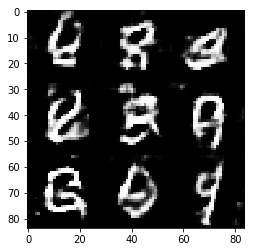

Epoch 2/2: Discriminator Loss: 0.879282 Generator Loss: 2.567059 Difference: 1.687777
Epoch 2/2: Discriminator Loss: 1.124325 Generator Loss: 0.936109 Difference: -0.188216
Epoch 2/2: Discriminator Loss: 0.759488 Generator Loss: 1.366831 Difference: 0.607343
Epoch 2/2: Discriminator Loss: 0.623586 Generator Loss: 2.405811 Difference: 1.782225
Epoch 2/2: Discriminator Loss: 0.520283 Generator Loss: 2.182520 Difference: 1.662237
Epoch 2/2: Discriminator Loss: 0.385320 Generator Loss: 2.010373 Difference: 1.625053
Tensor("generator_116/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_116/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_116/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_116/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_116/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_116/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


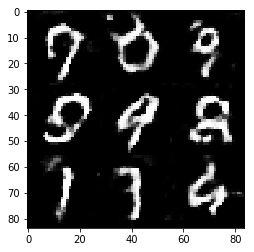

Epoch 2/2: Discriminator Loss: 0.657307 Generator Loss: 3.020785 Difference: 2.363477
Epoch 2/2: Discriminator Loss: 1.074984 Generator Loss: 2.030199 Difference: 0.955215
Epoch 2/2: Discriminator Loss: 0.639018 Generator Loss: 1.852720 Difference: 1.213702
Epoch 2/2: Discriminator Loss: 0.709175 Generator Loss: 0.810629 Difference: 0.101454
Epoch 2/2: Discriminator Loss: 0.637367 Generator Loss: 2.044604 Difference: 1.407237
Epoch 2/2: Discriminator Loss: 0.777997 Generator Loss: 3.094517 Difference: 2.316520
Tensor("generator_117/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_117/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_117/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_117/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_117/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_117/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


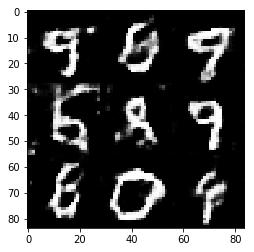

Epoch 2/2: Discriminator Loss: 0.526136 Generator Loss: 3.622605 Difference: 3.096469
Epoch 2/2: Discriminator Loss: 0.606494 Generator Loss: 1.946983 Difference: 1.340489
Epoch 2/2: Discriminator Loss: 1.307597 Generator Loss: 2.663016 Difference: 1.355419
Epoch 2/2: Discriminator Loss: 0.463832 Generator Loss: 2.574293 Difference: 2.110460
Epoch 2/2: Discriminator Loss: 1.151562 Generator Loss: 0.242479 Difference: -0.909083
Epoch 2/2: Discriminator Loss: 0.727958 Generator Loss: 1.586699 Difference: 0.858741
Tensor("generator_118/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_118/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_118/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_118/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_118/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_118/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


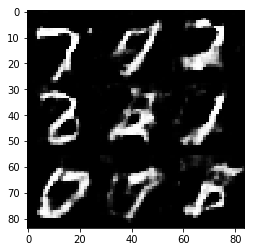

Epoch 2/2: Discriminator Loss: 1.126520 Generator Loss: 1.591168 Difference: 0.464647
Epoch 2/2: Discriminator Loss: 0.817438 Generator Loss: 2.226991 Difference: 1.409552
Epoch 2/2: Discriminator Loss: 0.400058 Generator Loss: 2.111508 Difference: 1.711450
Epoch 2/2: Discriminator Loss: 0.462601 Generator Loss: 1.729825 Difference: 1.267224
Epoch 2/2: Discriminator Loss: 0.868986 Generator Loss: 0.970391 Difference: 0.101404
Epoch 2/2: Discriminator Loss: 0.463763 Generator Loss: 2.328739 Difference: 1.864977
Tensor("generator_119/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_119/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_119/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_119/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_119/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_119/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


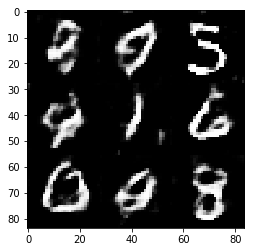

Epoch 2/2: Discriminator Loss: 0.420693 Generator Loss: 2.314591 Difference: 1.893898
Epoch 2/2: Discriminator Loss: 1.121969 Generator Loss: 1.916799 Difference: 0.794830
Epoch 2/2: Discriminator Loss: 0.494063 Generator Loss: 2.353834 Difference: 1.859771
Epoch 2/2: Discriminator Loss: 0.446947 Generator Loss: 2.492827 Difference: 2.045881
Epoch 2/2: Discriminator Loss: 1.634073 Generator Loss: 0.244196 Difference: -1.389877
Epoch 2/2: Discriminator Loss: 1.738457 Generator Loss: 0.120553 Difference: -1.617903
Tensor("generator_120/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_120/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_120/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_120/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_120/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_120/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


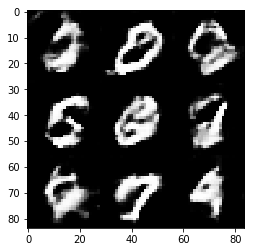

Epoch 2/2: Discriminator Loss: 1.160110 Generator Loss: 3.582494 Difference: 2.422384
Epoch 2/2: Discriminator Loss: 0.825585 Generator Loss: 0.832745 Difference: 0.007160
Epoch 2/2: Discriminator Loss: 0.394865 Generator Loss: 4.245815 Difference: 3.850950
Epoch 2/2: Discriminator Loss: 0.900263 Generator Loss: 1.639439 Difference: 0.739176
Epoch 2/2: Discriminator Loss: 1.065075 Generator Loss: 0.553055 Difference: -0.512021
Epoch 2/2: Discriminator Loss: 0.493574 Generator Loss: 1.551441 Difference: 1.057867
Tensor("generator_121/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_121/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_121/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_121/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_121/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_121/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


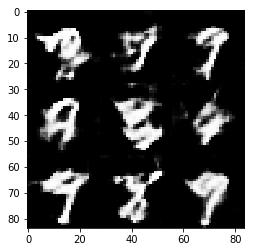

Epoch 2/2: Discriminator Loss: 0.666849 Generator Loss: 1.237922 Difference: 0.571072
Epoch 2/2: Discriminator Loss: 0.718972 Generator Loss: 2.181384 Difference: 1.462413
Epoch 2/2: Discriminator Loss: 0.644685 Generator Loss: 2.323580 Difference: 1.678895
Epoch 2/2: Discriminator Loss: 0.633543 Generator Loss: 2.726842 Difference: 2.093300
Epoch 2/2: Discriminator Loss: 0.723956 Generator Loss: 2.445814 Difference: 1.721858
Epoch 2/2: Discriminator Loss: 0.674799 Generator Loss: 2.061460 Difference: 1.386661
Tensor("generator_122/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_122/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_122/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_122/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_122/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_122/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


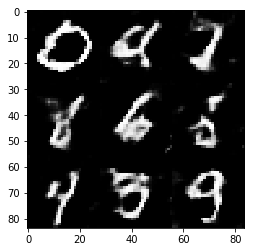

Epoch 2/2: Discriminator Loss: 1.063389 Generator Loss: 0.281856 Difference: -0.781533
Epoch 2/2: Discriminator Loss: 0.545503 Generator Loss: 2.102586 Difference: 1.557082
Epoch 2/2: Discriminator Loss: 0.834738 Generator Loss: 1.335977 Difference: 0.501239
Epoch 2/2: Discriminator Loss: 0.773970 Generator Loss: 0.864434 Difference: 0.090464
Epoch 2/2: Discriminator Loss: 0.484781 Generator Loss: 1.191837 Difference: 0.707056
Epoch 2/2: Discriminator Loss: 0.780870 Generator Loss: 2.394879 Difference: 1.614010
Tensor("generator_123/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_123/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_123/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_123/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_123/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_123/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


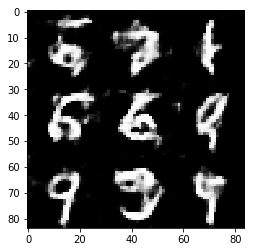

Epoch 2/2: Discriminator Loss: 1.382523 Generator Loss: 0.608425 Difference: -0.774097
Epoch 2/2: Discriminator Loss: 0.772626 Generator Loss: 1.564149 Difference: 0.791523
Epoch 2/2: Discriminator Loss: 0.557857 Generator Loss: 2.167470 Difference: 1.609614
Epoch 2/2: Discriminator Loss: 0.529723 Generator Loss: 2.643148 Difference: 2.113426
Epoch 2/2: Discriminator Loss: 0.919335 Generator Loss: 1.084460 Difference: 0.165125
Epoch 2/2: Discriminator Loss: 0.738654 Generator Loss: 2.002729 Difference: 1.264075
Tensor("generator_124/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_124/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_124/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_124/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_124/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_124/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


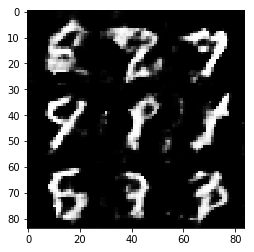

Epoch 2/2: Discriminator Loss: 1.147087 Generator Loss: 0.952824 Difference: -0.194263
Epoch 2/2: Discriminator Loss: 0.673176 Generator Loss: 1.785749 Difference: 1.112573
Epoch 2/2: Discriminator Loss: 0.621899 Generator Loss: 1.827966 Difference: 1.206066
Epoch 2/2: Discriminator Loss: 0.852945 Generator Loss: 1.451089 Difference: 0.598144
Epoch 2/2: Discriminator Loss: 0.743210 Generator Loss: 4.050500 Difference: 3.307290
Epoch 2/2: Discriminator Loss: 0.891371 Generator Loss: 1.169124 Difference: 0.277753
Tensor("generator_125/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_125/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_125/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_125/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_125/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_125/Tanh:0", shape=(?, 28, 28, 1), dtype=float32)


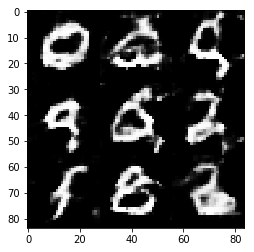

Epoch 2/2: Discriminator Loss: 0.526588 Generator Loss: 2.440553 Difference: 1.913965


In [19]:
batch_size = 32
z_dim = 128
learning_rate = 0.0005
beta1 = .5

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""

epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Tensor("generator/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)
Tensor("discriminator/dropout/mul:0", shape=(?, 14, 14, 64), dtype=float32)
Tensor("discriminator/dropout_1/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("discriminator/dropout_2/mul:0", shape=(?, 4, 4, 256), dtype=float32)
Tensor("discriminator/Reshape:0", shape=(?, 65536), dtype=float32)
Tensor("discriminator_1/dropout/mul:0", shape=(?, 14, 14, 64), dtype=float32)
Tensor("discriminator_1/dropout_1/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("discriminator_1/dropout_2/mul:0", shape=(?, 4, 4, 256), dtype=float32)
Tensor("discriminator_1/Reshape:0", shap

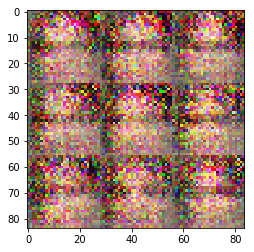

Epoch 1/1: Discriminator Loss: 0.792348 Generator Loss: 1.166330 Difference: 0.373982
Epoch 1/1: Discriminator Loss: 0.891852 Generator Loss: 0.876078 Difference: -0.015774
Epoch 1/1: Discriminator Loss: 0.897693 Generator Loss: 1.377335 Difference: 0.479642
Epoch 1/1: Discriminator Loss: 0.674952 Generator Loss: 1.629106 Difference: 0.954154
Epoch 1/1: Discriminator Loss: 1.048513 Generator Loss: 1.312435 Difference: 0.263922
Epoch 1/1: Discriminator Loss: 2.161815 Generator Loss: 0.170580 Difference: -1.991235
Tensor("generator_2/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_2/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_2/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_2/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_2/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_2/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


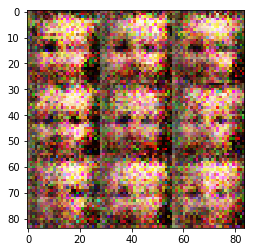

Epoch 1/1: Discriminator Loss: 1.132676 Generator Loss: 1.177460 Difference: 0.044784
Epoch 1/1: Discriminator Loss: 1.042008 Generator Loss: 1.213881 Difference: 0.171873
Epoch 1/1: Discriminator Loss: 0.769807 Generator Loss: 1.760491 Difference: 0.990683
Epoch 1/1: Discriminator Loss: 0.683242 Generator Loss: 1.966341 Difference: 1.283100
Epoch 1/1: Discriminator Loss: 0.809753 Generator Loss: 0.801181 Difference: -0.008572
Epoch 1/1: Discriminator Loss: 0.515142 Generator Loss: 2.394415 Difference: 1.879273
Tensor("generator_3/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_3/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_3/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_3/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_3/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_3/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


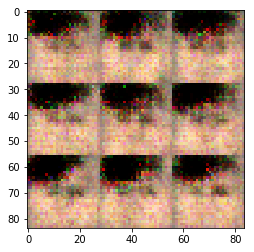

Epoch 1/1: Discriminator Loss: 0.511004 Generator Loss: 2.014544 Difference: 1.503540
Epoch 1/1: Discriminator Loss: 0.946031 Generator Loss: 0.810234 Difference: -0.135797
Epoch 1/1: Discriminator Loss: 1.539709 Generator Loss: 1.046538 Difference: -0.493171
Epoch 1/1: Discriminator Loss: 1.181515 Generator Loss: 0.687844 Difference: -0.493671
Epoch 1/1: Discriminator Loss: 1.250431 Generator Loss: 1.284880 Difference: 0.034449
Epoch 1/1: Discriminator Loss: 1.224428 Generator Loss: 0.637419 Difference: -0.587009
Tensor("generator_4/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_4/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_4/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_4/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_4/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_4/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


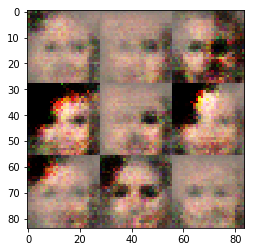

Epoch 1/1: Discriminator Loss: 1.031614 Generator Loss: 0.930237 Difference: -0.101377
Epoch 1/1: Discriminator Loss: 0.921146 Generator Loss: 0.977066 Difference: 0.055920
Epoch 1/1: Discriminator Loss: 1.529493 Generator Loss: 1.196871 Difference: -0.332622
Epoch 1/1: Discriminator Loss: 1.183897 Generator Loss: 0.645827 Difference: -0.538070
Epoch 1/1: Discriminator Loss: 1.119771 Generator Loss: 0.622651 Difference: -0.497120
Epoch 1/1: Discriminator Loss: 1.927609 Generator Loss: 1.046383 Difference: -0.881227
Tensor("generator_5/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_5/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_5/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_5/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_5/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_5/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


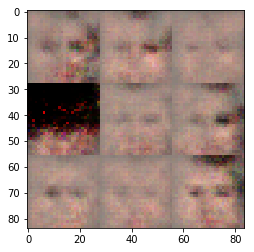

Epoch 1/1: Discriminator Loss: 1.023645 Generator Loss: 0.863572 Difference: -0.160073
Epoch 1/1: Discriminator Loss: 1.138244 Generator Loss: 1.164813 Difference: 0.026569
Epoch 1/1: Discriminator Loss: 1.040579 Generator Loss: 0.993943 Difference: -0.046636
Epoch 1/1: Discriminator Loss: 0.742632 Generator Loss: 1.422239 Difference: 0.679606
Epoch 1/1: Discriminator Loss: 1.070746 Generator Loss: 1.428285 Difference: 0.357539
Epoch 1/1: Discriminator Loss: 0.673946 Generator Loss: 1.437521 Difference: 0.763576
Tensor("generator_6/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_6/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_6/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_6/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_6/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_6/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


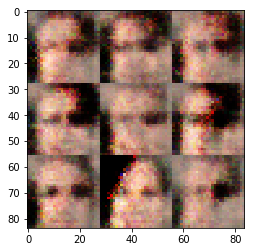

Epoch 1/1: Discriminator Loss: 1.849149 Generator Loss: 0.402346 Difference: -1.446803
Epoch 1/1: Discriminator Loss: 0.785439 Generator Loss: 1.183609 Difference: 0.398170
Epoch 1/1: Discriminator Loss: 1.011237 Generator Loss: 0.747840 Difference: -0.263397
Epoch 1/1: Discriminator Loss: 1.868585 Generator Loss: 0.253551 Difference: -1.615034
Epoch 1/1: Discriminator Loss: 0.718844 Generator Loss: 1.344290 Difference: 0.625446
Epoch 1/1: Discriminator Loss: 0.711488 Generator Loss: 1.592226 Difference: 0.880738
Tensor("generator_7/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_7/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_7/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_7/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_7/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_7/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


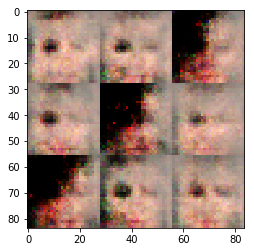

Epoch 1/1: Discriminator Loss: 0.829676 Generator Loss: 1.809967 Difference: 0.980291
Epoch 1/1: Discriminator Loss: 0.817384 Generator Loss: 0.949073 Difference: 0.131690
Epoch 1/1: Discriminator Loss: 0.567887 Generator Loss: 1.564147 Difference: 0.996260
Epoch 1/1: Discriminator Loss: 1.235868 Generator Loss: 0.523904 Difference: -0.711965
Epoch 1/1: Discriminator Loss: 0.765442 Generator Loss: 1.830859 Difference: 1.065418
Epoch 1/1: Discriminator Loss: 0.730117 Generator Loss: 2.083963 Difference: 1.353846
Tensor("generator_8/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_8/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_8/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_8/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_8/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_8/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


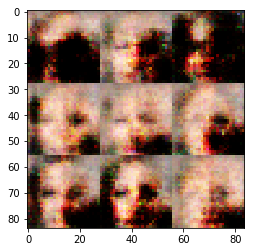

Epoch 1/1: Discriminator Loss: 0.779003 Generator Loss: 1.115382 Difference: 0.336379
Epoch 1/1: Discriminator Loss: 1.146044 Generator Loss: 2.241598 Difference: 1.095555
Epoch 1/1: Discriminator Loss: 3.585623 Generator Loss: 0.075922 Difference: -3.509701
Epoch 1/1: Discriminator Loss: 0.875285 Generator Loss: 1.610495 Difference: 0.735210
Epoch 1/1: Discriminator Loss: 1.492543 Generator Loss: 0.463270 Difference: -1.029273
Epoch 1/1: Discriminator Loss: 0.861813 Generator Loss: 0.894687 Difference: 0.032875
Tensor("generator_9/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_9/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_9/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_9/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_9/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_9/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


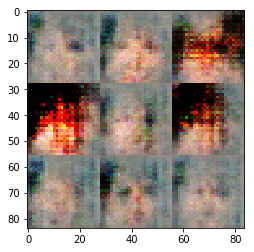

Epoch 1/1: Discriminator Loss: 1.150037 Generator Loss: 0.736747 Difference: -0.413290
Epoch 1/1: Discriminator Loss: 0.726310 Generator Loss: 1.389346 Difference: 0.663036
Epoch 1/1: Discriminator Loss: 1.593751 Generator Loss: 0.561440 Difference: -1.032311
Epoch 1/1: Discriminator Loss: 0.751982 Generator Loss: 1.202342 Difference: 0.450359
Epoch 1/1: Discriminator Loss: 1.172580 Generator Loss: 1.938977 Difference: 0.766398
Epoch 1/1: Discriminator Loss: 0.911090 Generator Loss: 1.305862 Difference: 0.394771
Tensor("generator_10/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_10/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_10/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_10/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_10/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_10/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


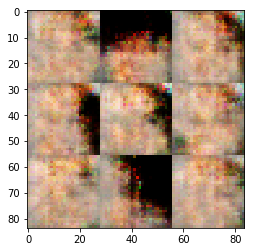

Epoch 1/1: Discriminator Loss: 1.095045 Generator Loss: 0.995606 Difference: -0.099438
Epoch 1/1: Discriminator Loss: 0.910394 Generator Loss: 1.047175 Difference: 0.136781
Epoch 1/1: Discriminator Loss: 1.343955 Generator Loss: 0.518659 Difference: -0.825296
Epoch 1/1: Discriminator Loss: 0.804161 Generator Loss: 1.027932 Difference: 0.223771
Epoch 1/1: Discriminator Loss: 1.392351 Generator Loss: 0.741506 Difference: -0.650844
Epoch 1/1: Discriminator Loss: 0.886975 Generator Loss: 1.833528 Difference: 0.946553
Tensor("generator_11/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_11/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_11/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_11/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_11/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_11/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


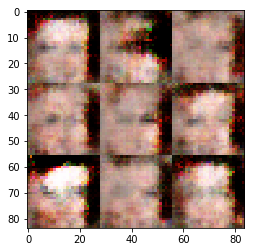

Epoch 1/1: Discriminator Loss: 1.219766 Generator Loss: 0.577731 Difference: -0.642035
Epoch 1/1: Discriminator Loss: 0.937137 Generator Loss: 0.871882 Difference: -0.065255
Epoch 1/1: Discriminator Loss: 0.834863 Generator Loss: 1.121169 Difference: 0.286306
Epoch 1/1: Discriminator Loss: 1.421513 Generator Loss: 0.552433 Difference: -0.869079
Epoch 1/1: Discriminator Loss: 1.001729 Generator Loss: 1.144780 Difference: 0.143051
Epoch 1/1: Discriminator Loss: 1.142588 Generator Loss: 0.939840 Difference: -0.202748
Tensor("generator_12/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_12/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_12/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_12/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_12/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_12/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


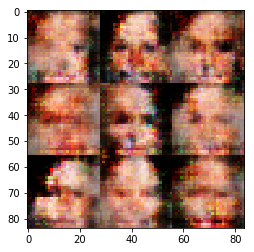

Epoch 1/1: Discriminator Loss: 0.955595 Generator Loss: 1.523174 Difference: 0.567579
Epoch 1/1: Discriminator Loss: 0.740704 Generator Loss: 1.390035 Difference: 0.649331
Epoch 1/1: Discriminator Loss: 1.144199 Generator Loss: 0.626514 Difference: -0.517685
Epoch 1/1: Discriminator Loss: 0.803324 Generator Loss: 0.999155 Difference: 0.195831
Epoch 1/1: Discriminator Loss: 2.288930 Generator Loss: 0.438362 Difference: -1.850568
Epoch 1/1: Discriminator Loss: 1.567827 Generator Loss: 0.514407 Difference: -1.053421
Tensor("generator_13/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_13/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_13/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_13/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_13/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_13/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


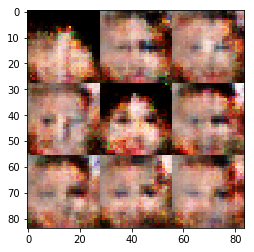

Epoch 1/1: Discriminator Loss: 1.655837 Generator Loss: 0.490833 Difference: -1.165004
Epoch 1/1: Discriminator Loss: 1.306132 Generator Loss: 1.034952 Difference: -0.271180
Epoch 1/1: Discriminator Loss: 1.416977 Generator Loss: 0.483356 Difference: -0.933620
Epoch 1/1: Discriminator Loss: 1.198412 Generator Loss: 0.741273 Difference: -0.457140
Epoch 1/1: Discriminator Loss: 1.669953 Generator Loss: 0.570467 Difference: -1.099486
Epoch 1/1: Discriminator Loss: 0.955798 Generator Loss: 0.910221 Difference: -0.045578
Tensor("generator_14/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_14/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_14/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_14/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_14/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_14/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


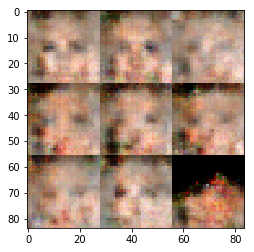

Epoch 1/1: Discriminator Loss: 1.109056 Generator Loss: 0.779642 Difference: -0.329415
Epoch 1/1: Discriminator Loss: 0.660876 Generator Loss: 1.682328 Difference: 1.021452
Epoch 1/1: Discriminator Loss: 1.781567 Generator Loss: 1.020863 Difference: -0.760704
Epoch 1/1: Discriminator Loss: 1.059457 Generator Loss: 0.923074 Difference: -0.136383
Epoch 1/1: Discriminator Loss: 0.929608 Generator Loss: 1.289123 Difference: 0.359515
Epoch 1/1: Discriminator Loss: 0.919765 Generator Loss: 1.034190 Difference: 0.114425
Tensor("generator_15/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_15/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_15/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_15/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_15/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_15/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


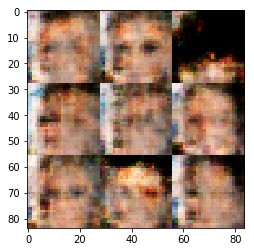

Epoch 1/1: Discriminator Loss: 1.316232 Generator Loss: 1.435709 Difference: 0.119477
Epoch 1/1: Discriminator Loss: 1.252448 Generator Loss: 0.724512 Difference: -0.527936
Epoch 1/1: Discriminator Loss: 1.033102 Generator Loss: 0.772782 Difference: -0.260320
Epoch 1/1: Discriminator Loss: 1.056716 Generator Loss: 1.170477 Difference: 0.113760
Epoch 1/1: Discriminator Loss: 1.183900 Generator Loss: 0.655772 Difference: -0.528128
Epoch 1/1: Discriminator Loss: 1.039131 Generator Loss: 0.669472 Difference: -0.369659
Tensor("generator_16/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_16/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_16/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_16/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_16/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_16/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


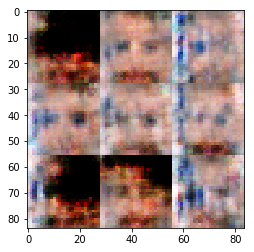

Epoch 1/1: Discriminator Loss: 0.907032 Generator Loss: 0.807338 Difference: -0.099694
Epoch 1/1: Discriminator Loss: 1.722859 Generator Loss: 0.880589 Difference: -0.842270
Epoch 1/1: Discriminator Loss: 1.306478 Generator Loss: 0.824241 Difference: -0.482237
Epoch 1/1: Discriminator Loss: 1.388509 Generator Loss: 0.537948 Difference: -0.850561
Epoch 1/1: Discriminator Loss: 1.487456 Generator Loss: 1.432113 Difference: -0.055343
Epoch 1/1: Discriminator Loss: 0.961317 Generator Loss: 0.975551 Difference: 0.014234
Tensor("generator_17/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_17/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_17/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_17/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_17/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_17/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


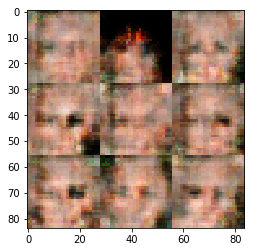

Epoch 1/1: Discriminator Loss: 0.713249 Generator Loss: 1.346800 Difference: 0.633551
Epoch 1/1: Discriminator Loss: 1.824300 Generator Loss: 0.241786 Difference: -1.582514
Epoch 1/1: Discriminator Loss: 1.049835 Generator Loss: 0.903007 Difference: -0.146829
Epoch 1/1: Discriminator Loss: 1.629186 Generator Loss: 1.100298 Difference: -0.528888
Epoch 1/1: Discriminator Loss: 0.738731 Generator Loss: 1.539730 Difference: 0.800999
Epoch 1/1: Discriminator Loss: 0.720412 Generator Loss: 1.457632 Difference: 0.737219
Tensor("generator_18/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_18/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_18/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_18/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_18/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_18/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


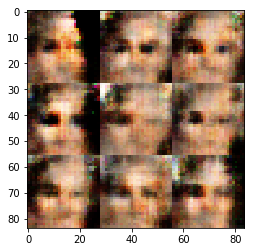

Epoch 1/1: Discriminator Loss: 1.423830 Generator Loss: 0.847704 Difference: -0.576126
Epoch 1/1: Discriminator Loss: 1.727214 Generator Loss: 2.978132 Difference: 1.250918
Epoch 1/1: Discriminator Loss: 0.720696 Generator Loss: 1.321580 Difference: 0.600883
Epoch 1/1: Discriminator Loss: 1.288493 Generator Loss: 0.828836 Difference: -0.459657
Epoch 1/1: Discriminator Loss: 1.416102 Generator Loss: 0.526247 Difference: -0.889855
Epoch 1/1: Discriminator Loss: 1.045691 Generator Loss: 2.053908 Difference: 1.008217
Tensor("generator_19/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_19/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_19/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_19/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_19/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_19/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


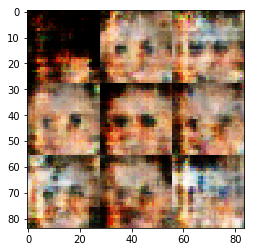

Epoch 1/1: Discriminator Loss: 1.197209 Generator Loss: 0.628665 Difference: -0.568544
Epoch 1/1: Discriminator Loss: 0.689187 Generator Loss: 1.450369 Difference: 0.761183
Epoch 1/1: Discriminator Loss: 1.696091 Generator Loss: 0.322740 Difference: -1.373351
Epoch 1/1: Discriminator Loss: 1.065839 Generator Loss: 1.778739 Difference: 0.712899
Epoch 1/1: Discriminator Loss: 1.688081 Generator Loss: 0.383804 Difference: -1.304277
Epoch 1/1: Discriminator Loss: 1.284048 Generator Loss: 0.675724 Difference: -0.608324
Tensor("generator_20/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_20/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_20/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_20/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_20/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_20/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


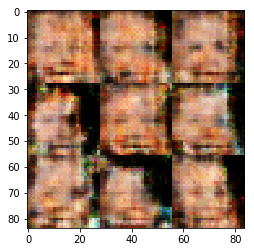

Epoch 1/1: Discriminator Loss: 1.566475 Generator Loss: 0.752768 Difference: -0.813707
Epoch 1/1: Discriminator Loss: 1.632797 Generator Loss: 0.347120 Difference: -1.285676
Epoch 1/1: Discriminator Loss: 0.870554 Generator Loss: 1.261812 Difference: 0.391258
Epoch 1/1: Discriminator Loss: 1.441092 Generator Loss: 0.476758 Difference: -0.964335
Epoch 1/1: Discriminator Loss: 0.826755 Generator Loss: 1.273567 Difference: 0.446812
Epoch 1/1: Discriminator Loss: 2.243416 Generator Loss: 0.163670 Difference: -2.079746
Tensor("generator_21/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_21/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_21/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_21/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_21/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_21/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


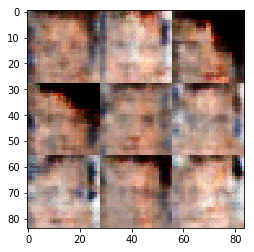

Epoch 1/1: Discriminator Loss: 0.743438 Generator Loss: 1.479732 Difference: 0.736294
Epoch 1/1: Discriminator Loss: 1.082044 Generator Loss: 0.778129 Difference: -0.303916
Epoch 1/1: Discriminator Loss: 0.892754 Generator Loss: 1.197493 Difference: 0.304739
Epoch 1/1: Discriminator Loss: 1.104368 Generator Loss: 0.956068 Difference: -0.148300
Epoch 1/1: Discriminator Loss: 1.425442 Generator Loss: 1.475889 Difference: 0.050447
Epoch 1/1: Discriminator Loss: 1.209272 Generator Loss: 1.094237 Difference: -0.115035
Tensor("generator_22/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_22/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_22/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_22/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_22/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_22/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


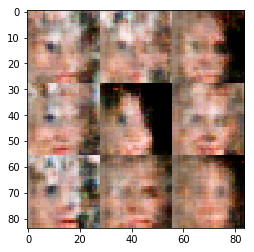

Epoch 1/1: Discriminator Loss: 1.013932 Generator Loss: 0.977390 Difference: -0.036542
Epoch 1/1: Discriminator Loss: 1.188294 Generator Loss: 0.587300 Difference: -0.600994
Epoch 1/1: Discriminator Loss: 1.030488 Generator Loss: 1.959583 Difference: 0.929096
Epoch 1/1: Discriminator Loss: 1.240798 Generator Loss: 1.831291 Difference: 0.590493
Epoch 1/1: Discriminator Loss: 1.508283 Generator Loss: 0.555763 Difference: -0.952519
Epoch 1/1: Discriminator Loss: 1.250758 Generator Loss: 1.282798 Difference: 0.032040
Tensor("generator_23/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_23/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_23/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_23/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_23/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_23/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


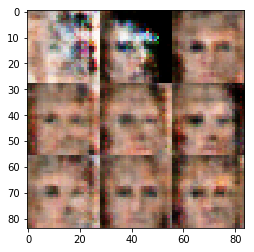

Epoch 1/1: Discriminator Loss: 0.801614 Generator Loss: 1.137635 Difference: 0.336021
Epoch 1/1: Discriminator Loss: 0.749563 Generator Loss: 1.259346 Difference: 0.509784
Epoch 1/1: Discriminator Loss: 1.003175 Generator Loss: 2.394407 Difference: 1.391232
Epoch 1/1: Discriminator Loss: 1.101493 Generator Loss: 1.039573 Difference: -0.061920
Epoch 1/1: Discriminator Loss: 1.421641 Generator Loss: 0.561754 Difference: -0.859887
Epoch 1/1: Discriminator Loss: 1.458095 Generator Loss: 2.058044 Difference: 0.599949
Tensor("generator_24/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_24/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_24/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_24/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_24/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_24/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


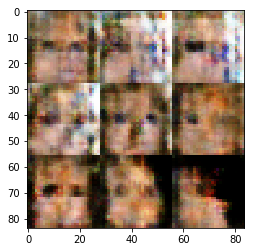

Epoch 1/1: Discriminator Loss: 1.244149 Generator Loss: 0.454352 Difference: -0.789797
Epoch 1/1: Discriminator Loss: 0.881199 Generator Loss: 1.121019 Difference: 0.239821
Epoch 1/1: Discriminator Loss: 1.593261 Generator Loss: 0.352513 Difference: -1.240748
Epoch 1/1: Discriminator Loss: 1.949459 Generator Loss: 0.201237 Difference: -1.748222
Epoch 1/1: Discriminator Loss: 1.675139 Generator Loss: 0.258003 Difference: -1.417136
Epoch 1/1: Discriminator Loss: 0.971345 Generator Loss: 1.005998 Difference: 0.034653
Tensor("generator_25/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_25/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_25/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_25/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_25/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_25/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


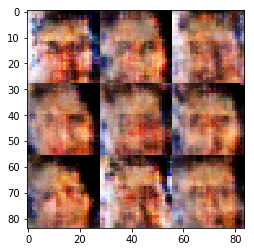

Epoch 1/1: Discriminator Loss: 0.626373 Generator Loss: 1.558119 Difference: 0.931745
Epoch 1/1: Discriminator Loss: 3.234452 Generator Loss: 4.100908 Difference: 0.866456
Epoch 1/1: Discriminator Loss: 0.850883 Generator Loss: 1.375936 Difference: 0.525053
Epoch 1/1: Discriminator Loss: 0.906930 Generator Loss: 1.459824 Difference: 0.552894
Epoch 1/1: Discriminator Loss: 1.014371 Generator Loss: 1.515048 Difference: 0.500677
Epoch 1/1: Discriminator Loss: 1.101704 Generator Loss: 0.630807 Difference: -0.470897
Tensor("generator_26/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_26/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_26/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_26/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_26/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_26/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


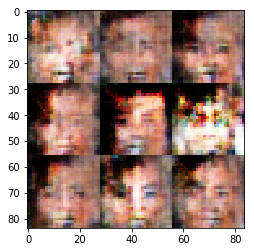

Epoch 1/1: Discriminator Loss: 0.622254 Generator Loss: 1.394861 Difference: 0.772607
Epoch 1/1: Discriminator Loss: 0.827821 Generator Loss: 1.152487 Difference: 0.324666
Epoch 1/1: Discriminator Loss: 0.896883 Generator Loss: 0.733318 Difference: -0.163565
Epoch 1/1: Discriminator Loss: 2.999940 Generator Loss: 5.195374 Difference: 2.195434
Epoch 1/1: Discriminator Loss: 1.222966 Generator Loss: 0.812996 Difference: -0.409970
Epoch 1/1: Discriminator Loss: 0.889073 Generator Loss: 1.246020 Difference: 0.356947
Tensor("generator_27/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_27/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_27/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_27/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_27/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_27/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


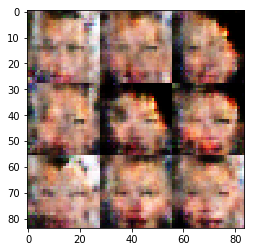

Epoch 1/1: Discriminator Loss: 1.016334 Generator Loss: 1.088272 Difference: 0.071938
Epoch 1/1: Discriminator Loss: 1.350625 Generator Loss: 0.687942 Difference: -0.662683
Epoch 1/1: Discriminator Loss: 0.884465 Generator Loss: 1.594208 Difference: 0.709742
Epoch 1/1: Discriminator Loss: 1.411131 Generator Loss: 1.297850 Difference: -0.113281
Epoch 1/1: Discriminator Loss: 1.464353 Generator Loss: 0.470910 Difference: -0.993443
Epoch 1/1: Discriminator Loss: 0.840387 Generator Loss: 1.316248 Difference: 0.475861
Tensor("generator_28/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_28/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_28/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_28/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_28/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_28/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


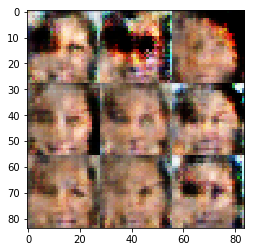

Epoch 1/1: Discriminator Loss: 1.706252 Generator Loss: 1.062457 Difference: -0.643796
Epoch 1/1: Discriminator Loss: 1.207917 Generator Loss: 1.512766 Difference: 0.304849
Epoch 1/1: Discriminator Loss: 0.901752 Generator Loss: 1.969879 Difference: 1.068127
Epoch 1/1: Discriminator Loss: 1.015126 Generator Loss: 0.856108 Difference: -0.159018
Epoch 1/1: Discriminator Loss: 1.257837 Generator Loss: 0.519778 Difference: -0.738059
Epoch 1/1: Discriminator Loss: 1.101965 Generator Loss: 0.624271 Difference: -0.477695
Tensor("generator_29/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_29/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_29/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_29/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_29/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_29/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


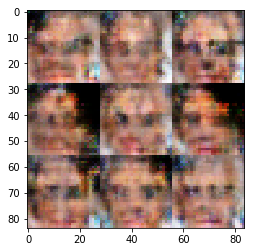

Epoch 1/1: Discriminator Loss: 0.957527 Generator Loss: 1.829698 Difference: 0.872172
Epoch 1/1: Discriminator Loss: 0.795611 Generator Loss: 1.074632 Difference: 0.279021
Epoch 1/1: Discriminator Loss: 0.830727 Generator Loss: 1.157784 Difference: 0.327057
Epoch 1/1: Discriminator Loss: 1.027447 Generator Loss: 0.954446 Difference: -0.073001
Epoch 1/1: Discriminator Loss: 0.783189 Generator Loss: 1.746154 Difference: 0.962965
Epoch 1/1: Discriminator Loss: 0.985220 Generator Loss: 0.809917 Difference: -0.175304
Tensor("generator_30/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_30/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_30/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_30/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_30/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_30/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


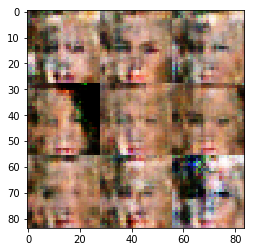

Epoch 1/1: Discriminator Loss: 0.964960 Generator Loss: 0.775110 Difference: -0.189851
Epoch 1/1: Discriminator Loss: 0.706761 Generator Loss: 1.543119 Difference: 0.836358
Epoch 1/1: Discriminator Loss: 2.592062 Generator Loss: 0.087453 Difference: -2.504610
Epoch 1/1: Discriminator Loss: 0.894249 Generator Loss: 0.806808 Difference: -0.087441
Epoch 1/1: Discriminator Loss: 1.931840 Generator Loss: 0.141565 Difference: -1.790275
Epoch 1/1: Discriminator Loss: 0.786648 Generator Loss: 0.691940 Difference: -0.094708
Tensor("generator_31/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_31/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_31/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_31/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_31/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_31/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


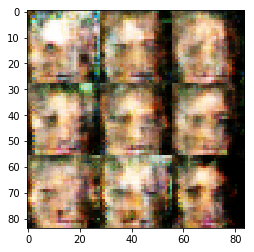

Epoch 1/1: Discriminator Loss: 0.963555 Generator Loss: 0.883214 Difference: -0.080341
Epoch 1/1: Discriminator Loss: 4.497664 Generator Loss: 0.024475 Difference: -4.473189
Epoch 1/1: Discriminator Loss: 0.704527 Generator Loss: 1.508128 Difference: 0.803601
Epoch 1/1: Discriminator Loss: 1.073442 Generator Loss: 0.988189 Difference: -0.085253
Epoch 1/1: Discriminator Loss: 0.901022 Generator Loss: 1.034316 Difference: 0.133293
Epoch 1/1: Discriminator Loss: 1.487511 Generator Loss: 2.714540 Difference: 1.227030
Tensor("generator_32/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_32/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_32/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_32/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_32/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_32/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


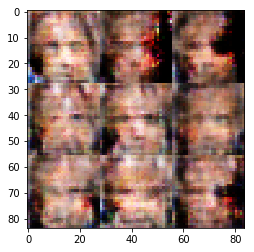

Epoch 1/1: Discriminator Loss: 0.675973 Generator Loss: 1.450370 Difference: 0.774397
Epoch 1/1: Discriminator Loss: 0.774943 Generator Loss: 1.431613 Difference: 0.656670
Epoch 1/1: Discriminator Loss: 0.930313 Generator Loss: 0.832014 Difference: -0.098299
Epoch 1/1: Discriminator Loss: 0.834993 Generator Loss: 0.922713 Difference: 0.087720
Epoch 1/1: Discriminator Loss: 0.650077 Generator Loss: 1.409406 Difference: 0.759329
Epoch 1/1: Discriminator Loss: 1.387079 Generator Loss: 2.766791 Difference: 1.379711
Tensor("generator_33/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_33/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_33/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_33/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_33/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_33/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


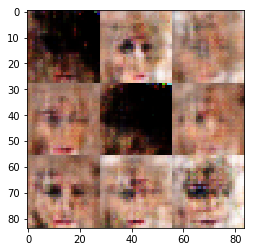

Epoch 1/1: Discriminator Loss: 1.294127 Generator Loss: 0.639523 Difference: -0.654604
Epoch 1/1: Discriminator Loss: 1.339374 Generator Loss: 0.306647 Difference: -1.032727
Epoch 1/1: Discriminator Loss: 0.861125 Generator Loss: 2.546916 Difference: 1.685790
Epoch 1/1: Discriminator Loss: 1.563767 Generator Loss: 0.311133 Difference: -1.252633
Epoch 1/1: Discriminator Loss: 1.321098 Generator Loss: 1.055701 Difference: -0.265397
Epoch 1/1: Discriminator Loss: 0.988278 Generator Loss: 0.948214 Difference: -0.040064
Tensor("generator_34/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_34/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_34/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_34/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_34/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_34/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


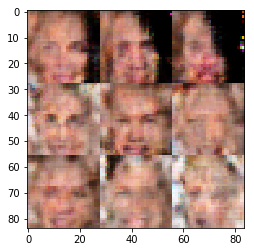

Epoch 1/1: Discriminator Loss: 1.078133 Generator Loss: 0.943307 Difference: -0.134826
Epoch 1/1: Discriminator Loss: 0.876360 Generator Loss: 1.523520 Difference: 0.647160
Epoch 1/1: Discriminator Loss: 1.580054 Generator Loss: 0.590623 Difference: -0.989432
Epoch 1/1: Discriminator Loss: 0.667883 Generator Loss: 1.651721 Difference: 0.983839
Epoch 1/1: Discriminator Loss: 1.612468 Generator Loss: 0.704769 Difference: -0.907699
Epoch 1/1: Discriminator Loss: 1.270512 Generator Loss: 0.672850 Difference: -0.597663
Tensor("generator_35/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_35/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_35/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_35/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_35/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_35/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


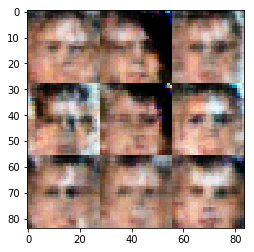

Epoch 1/1: Discriminator Loss: 1.310404 Generator Loss: 0.537079 Difference: -0.773325
Epoch 1/1: Discriminator Loss: 0.770517 Generator Loss: 1.866174 Difference: 1.095657
Epoch 1/1: Discriminator Loss: 0.956668 Generator Loss: 1.347964 Difference: 0.391296
Epoch 1/1: Discriminator Loss: 0.980784 Generator Loss: 1.036974 Difference: 0.056191
Epoch 1/1: Discriminator Loss: 1.357498 Generator Loss: 0.537575 Difference: -0.819923
Epoch 1/1: Discriminator Loss: 0.828131 Generator Loss: 1.676917 Difference: 0.848786
Tensor("generator_36/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_36/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_36/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_36/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_36/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_36/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


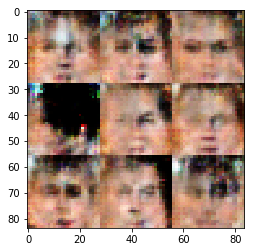

Epoch 1/1: Discriminator Loss: 1.167657 Generator Loss: 0.611807 Difference: -0.555850
Epoch 1/1: Discriminator Loss: 0.730106 Generator Loss: 2.434005 Difference: 1.703899
Epoch 1/1: Discriminator Loss: 0.921569 Generator Loss: 1.377042 Difference: 0.455473
Epoch 1/1: Discriminator Loss: 1.362491 Generator Loss: 0.673919 Difference: -0.688572
Epoch 1/1: Discriminator Loss: 0.603703 Generator Loss: 1.113576 Difference: 0.509874
Epoch 1/1: Discriminator Loss: 0.949562 Generator Loss: 0.844536 Difference: -0.105026
Tensor("generator_37/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_37/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_37/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_37/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_37/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_37/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


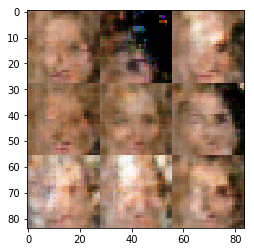

Epoch 1/1: Discriminator Loss: 0.488564 Generator Loss: 2.907915 Difference: 2.419351
Epoch 1/1: Discriminator Loss: 1.114328 Generator Loss: 2.513541 Difference: 1.399214
Epoch 1/1: Discriminator Loss: 0.642019 Generator Loss: 2.299558 Difference: 1.657539
Epoch 1/1: Discriminator Loss: 1.048583 Generator Loss: 0.875529 Difference: -0.173055
Epoch 1/1: Discriminator Loss: 1.689830 Generator Loss: 1.730341 Difference: 0.040510
Epoch 1/1: Discriminator Loss: 0.988935 Generator Loss: 1.590684 Difference: 0.601749
Tensor("generator_38/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_38/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_38/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_38/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_38/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_38/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


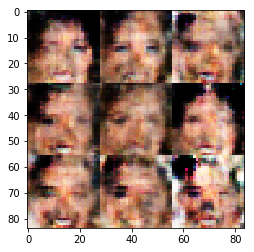

Epoch 1/1: Discriminator Loss: 1.450518 Generator Loss: 0.551112 Difference: -0.899406
Epoch 1/1: Discriminator Loss: 1.275855 Generator Loss: 0.613641 Difference: -0.662214
Epoch 1/1: Discriminator Loss: 1.972095 Generator Loss: 0.229550 Difference: -1.742545
Epoch 1/1: Discriminator Loss: 0.746108 Generator Loss: 1.318636 Difference: 0.572528
Epoch 1/1: Discriminator Loss: 1.202501 Generator Loss: 0.587251 Difference: -0.615250
Epoch 1/1: Discriminator Loss: 0.715871 Generator Loss: 1.652926 Difference: 0.937055
Tensor("generator_39/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_39/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_39/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_39/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_39/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_39/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


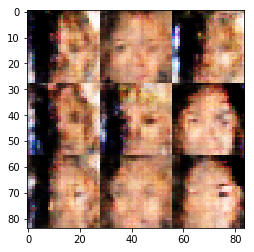

Epoch 1/1: Discriminator Loss: 1.106946 Generator Loss: 0.605560 Difference: -0.501386
Epoch 1/1: Discriminator Loss: 1.931151 Generator Loss: 0.343829 Difference: -1.587322
Epoch 1/1: Discriminator Loss: 0.966909 Generator Loss: 0.968271 Difference: 0.001362
Epoch 1/1: Discriminator Loss: 0.865521 Generator Loss: 1.173249 Difference: 0.307728
Epoch 1/1: Discriminator Loss: 0.967594 Generator Loss: 0.902855 Difference: -0.064738
Epoch 1/1: Discriminator Loss: 0.684891 Generator Loss: 1.482842 Difference: 0.797951
Tensor("generator_40/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_40/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_40/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_40/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_40/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_40/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


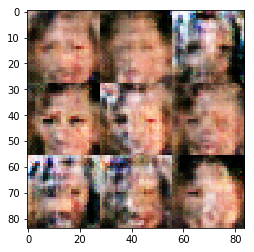

Epoch 1/1: Discriminator Loss: 1.032774 Generator Loss: 0.719164 Difference: -0.313609
Epoch 1/1: Discriminator Loss: 0.954258 Generator Loss: 2.402878 Difference: 1.448619
Epoch 1/1: Discriminator Loss: 0.781874 Generator Loss: 1.022455 Difference: 0.240581
Epoch 1/1: Discriminator Loss: 2.324800 Generator Loss: 0.222227 Difference: -2.102573
Epoch 1/1: Discriminator Loss: 0.611756 Generator Loss: 1.286625 Difference: 0.674868
Epoch 1/1: Discriminator Loss: 0.746950 Generator Loss: 1.028914 Difference: 0.281964
Tensor("generator_41/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_41/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_41/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_41/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_41/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_41/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


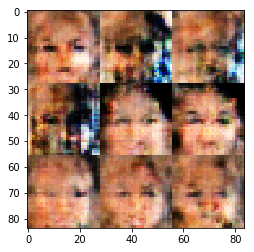

Epoch 1/1: Discriminator Loss: 1.014968 Generator Loss: 1.051745 Difference: 0.036777
Epoch 1/1: Discriminator Loss: 1.132065 Generator Loss: 0.695147 Difference: -0.436918
Epoch 1/1: Discriminator Loss: 1.210154 Generator Loss: 1.944318 Difference: 0.734164
Epoch 1/1: Discriminator Loss: 0.895388 Generator Loss: 1.780807 Difference: 0.885419
Epoch 1/1: Discriminator Loss: 0.803879 Generator Loss: 1.142555 Difference: 0.338676
Epoch 1/1: Discriminator Loss: 1.113132 Generator Loss: 0.946460 Difference: -0.166672
Tensor("generator_42/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_42/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_42/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_42/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_42/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_42/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


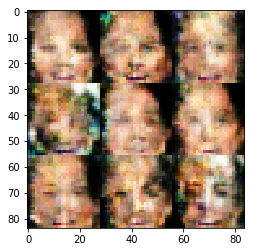

Epoch 1/1: Discriminator Loss: 0.883918 Generator Loss: 2.403823 Difference: 1.519906
Epoch 1/1: Discriminator Loss: 1.729700 Generator Loss: 0.404022 Difference: -1.325678
Epoch 1/1: Discriminator Loss: 0.818730 Generator Loss: 1.336901 Difference: 0.518170
Epoch 1/1: Discriminator Loss: 0.957978 Generator Loss: 0.955078 Difference: -0.002900
Epoch 1/1: Discriminator Loss: 0.591893 Generator Loss: 4.183573 Difference: 3.591680
Epoch 1/1: Discriminator Loss: 0.915557 Generator Loss: 1.926870 Difference: 1.011313
Tensor("generator_43/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_43/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_43/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_43/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_43/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_43/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


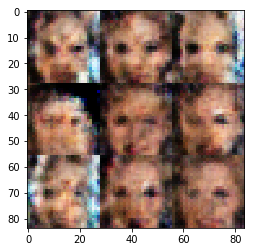

Epoch 1/1: Discriminator Loss: 1.535666 Generator Loss: 0.365476 Difference: -1.170190
Epoch 1/1: Discriminator Loss: 1.607208 Generator Loss: 0.803614 Difference: -0.803593
Epoch 1/1: Discriminator Loss: 0.978472 Generator Loss: 2.580199 Difference: 1.601727
Epoch 1/1: Discriminator Loss: 2.328077 Generator Loss: 0.510688 Difference: -1.817389
Epoch 1/1: Discriminator Loss: 0.771051 Generator Loss: 1.356459 Difference: 0.585408
Epoch 1/1: Discriminator Loss: 0.720187 Generator Loss: 1.369664 Difference: 0.649476
Tensor("generator_44/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_44/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_44/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_44/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_44/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_44/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


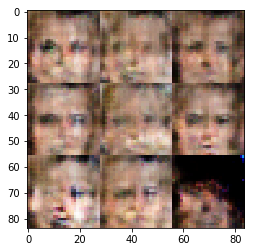

Epoch 1/1: Discriminator Loss: 1.073820 Generator Loss: 2.540122 Difference: 1.466301
Epoch 1/1: Discriminator Loss: 0.916731 Generator Loss: 0.981556 Difference: 0.064824
Epoch 1/1: Discriminator Loss: 0.849641 Generator Loss: 1.001129 Difference: 0.151488
Epoch 1/1: Discriminator Loss: 0.565712 Generator Loss: 2.029337 Difference: 1.463625
Epoch 1/1: Discriminator Loss: 1.346860 Generator Loss: 0.552599 Difference: -0.794261
Epoch 1/1: Discriminator Loss: 2.047232 Generator Loss: 0.273030 Difference: -1.774201
Tensor("generator_45/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_45/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_45/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_45/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_45/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_45/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


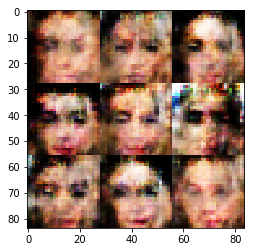

Epoch 1/1: Discriminator Loss: 0.903017 Generator Loss: 1.902736 Difference: 0.999720
Epoch 1/1: Discriminator Loss: 0.615835 Generator Loss: 1.051147 Difference: 0.435312
Epoch 1/1: Discriminator Loss: 0.782527 Generator Loss: 1.129898 Difference: 0.347371
Epoch 1/1: Discriminator Loss: 0.710478 Generator Loss: 1.815227 Difference: 1.104749
Epoch 1/1: Discriminator Loss: 1.648793 Generator Loss: 0.458951 Difference: -1.189842
Epoch 1/1: Discriminator Loss: 1.048014 Generator Loss: 1.104896 Difference: 0.056883
Tensor("generator_46/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_46/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_46/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_46/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_46/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_46/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


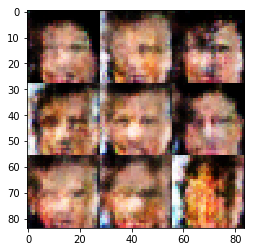

Epoch 1/1: Discriminator Loss: 0.723952 Generator Loss: 1.900820 Difference: 1.176868
Epoch 1/1: Discriminator Loss: 0.944312 Generator Loss: 1.023257 Difference: 0.078945
Epoch 1/1: Discriminator Loss: 1.178053 Generator Loss: 0.574693 Difference: -0.603360
Epoch 1/1: Discriminator Loss: 0.557042 Generator Loss: 3.062512 Difference: 2.505470
Epoch 1/1: Discriminator Loss: 0.927812 Generator Loss: 0.746312 Difference: -0.181499
Epoch 1/1: Discriminator Loss: 0.847596 Generator Loss: 1.918368 Difference: 1.070772
Tensor("generator_47/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_47/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_47/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_47/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_47/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_47/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


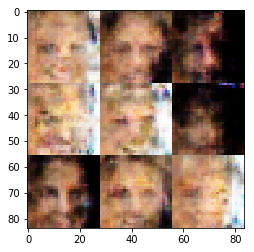

Epoch 1/1: Discriminator Loss: 0.642508 Generator Loss: 2.316450 Difference: 1.673942
Epoch 1/1: Discriminator Loss: 0.546027 Generator Loss: 2.014430 Difference: 1.468402
Epoch 1/1: Discriminator Loss: 0.887845 Generator Loss: 0.751502 Difference: -0.136343
Epoch 1/1: Discriminator Loss: 0.773651 Generator Loss: 2.908179 Difference: 2.134529
Epoch 1/1: Discriminator Loss: 1.169504 Generator Loss: 0.922172 Difference: -0.247332
Epoch 1/1: Discriminator Loss: 0.869245 Generator Loss: 2.753512 Difference: 1.884267
Tensor("generator_48/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_48/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_48/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_48/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_48/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_48/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


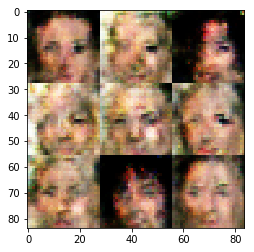

Epoch 1/1: Discriminator Loss: 0.933218 Generator Loss: 0.898813 Difference: -0.034405
Epoch 1/1: Discriminator Loss: 0.681010 Generator Loss: 1.286379 Difference: 0.605369
Epoch 1/1: Discriminator Loss: 2.475161 Generator Loss: 0.222268 Difference: -2.252892
Epoch 1/1: Discriminator Loss: 0.673550 Generator Loss: 1.535401 Difference: 0.861852
Epoch 1/1: Discriminator Loss: 1.044028 Generator Loss: 2.833218 Difference: 1.789190
Epoch 1/1: Discriminator Loss: 1.549790 Generator Loss: 3.010721 Difference: 1.460931
Tensor("generator_49/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_49/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_49/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_49/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_49/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_49/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


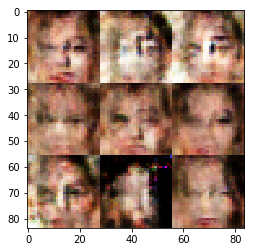

Epoch 1/1: Discriminator Loss: 1.059208 Generator Loss: 1.353185 Difference: 0.293977
Epoch 1/1: Discriminator Loss: 0.696734 Generator Loss: 1.160792 Difference: 0.464058
Epoch 1/1: Discriminator Loss: 1.269408 Generator Loss: 0.414908 Difference: -0.854499
Epoch 1/1: Discriminator Loss: 1.097943 Generator Loss: 0.858507 Difference: -0.239436
Epoch 1/1: Discriminator Loss: 1.847852 Generator Loss: 0.340631 Difference: -1.507221
Epoch 1/1: Discriminator Loss: 1.243996 Generator Loss: 0.815384 Difference: -0.428612
Tensor("generator_50/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_50/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_50/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_50/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_50/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_50/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


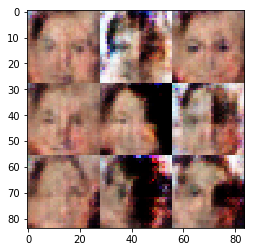

Epoch 1/1: Discriminator Loss: 1.854370 Generator Loss: 0.412054 Difference: -1.442316
Epoch 1/1: Discriminator Loss: 1.008298 Generator Loss: 0.955588 Difference: -0.052710
Epoch 1/1: Discriminator Loss: 1.018005 Generator Loss: 1.100093 Difference: 0.082087
Epoch 1/1: Discriminator Loss: 0.797540 Generator Loss: 2.076458 Difference: 1.278918
Epoch 1/1: Discriminator Loss: 0.764929 Generator Loss: 1.547301 Difference: 0.782372
Epoch 1/1: Discriminator Loss: 0.598075 Generator Loss: 2.169448 Difference: 1.571373
Tensor("generator_51/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_51/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_51/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_51/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_51/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_51/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


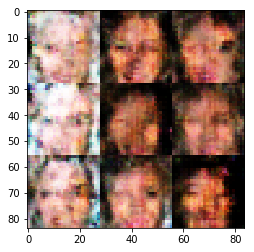

Epoch 1/1: Discriminator Loss: 0.846249 Generator Loss: 2.069541 Difference: 1.223292
Epoch 1/1: Discriminator Loss: 0.995180 Generator Loss: 1.965401 Difference: 0.970221
Epoch 1/1: Discriminator Loss: 1.049309 Generator Loss: 1.035268 Difference: -0.014040
Epoch 1/1: Discriminator Loss: 0.767224 Generator Loss: 1.545548 Difference: 0.778323
Epoch 1/1: Discriminator Loss: 1.662456 Generator Loss: 0.412078 Difference: -1.250379
Epoch 1/1: Discriminator Loss: 1.064724 Generator Loss: 0.825227 Difference: -0.239497
Tensor("generator_52/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_52/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_52/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_52/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_52/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_52/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


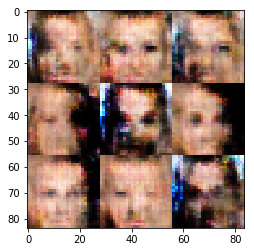

Epoch 1/1: Discriminator Loss: 0.535854 Generator Loss: 1.934829 Difference: 1.398975
Epoch 1/1: Discriminator Loss: 1.191629 Generator Loss: 3.013485 Difference: 1.821856
Epoch 1/1: Discriminator Loss: 0.677051 Generator Loss: 2.771779 Difference: 2.094728
Epoch 1/1: Discriminator Loss: 0.829573 Generator Loss: 1.220710 Difference: 0.391137
Epoch 1/1: Discriminator Loss: 0.608177 Generator Loss: 1.207705 Difference: 0.599527
Epoch 1/1: Discriminator Loss: 0.625468 Generator Loss: 1.374334 Difference: 0.748867
Tensor("generator_53/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_53/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_53/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_53/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_53/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_53/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


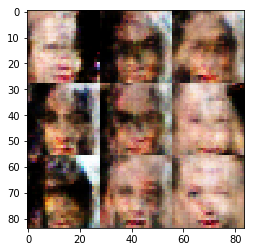

Epoch 1/1: Discriminator Loss: 1.323020 Generator Loss: 1.468493 Difference: 0.145474
Epoch 1/1: Discriminator Loss: 1.721941 Generator Loss: 5.266536 Difference: 3.544596
Epoch 1/1: Discriminator Loss: 1.057469 Generator Loss: 2.120752 Difference: 1.063283
Epoch 1/1: Discriminator Loss: 0.844497 Generator Loss: 1.077489 Difference: 0.232992
Epoch 1/1: Discriminator Loss: 1.261189 Generator Loss: 2.716011 Difference: 1.454823
Epoch 1/1: Discriminator Loss: 1.249062 Generator Loss: 0.616025 Difference: -0.633037
Tensor("generator_54/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_54/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_54/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_54/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_54/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_54/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


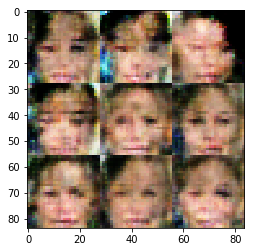

Epoch 1/1: Discriminator Loss: 1.371196 Generator Loss: 4.301285 Difference: 2.930089
Epoch 1/1: Discriminator Loss: 1.109961 Generator Loss: 0.804735 Difference: -0.305226
Epoch 1/1: Discriminator Loss: 1.574824 Generator Loss: 3.136063 Difference: 1.561239
Epoch 1/1: Discriminator Loss: 0.968954 Generator Loss: 1.025642 Difference: 0.056688
Epoch 1/1: Discriminator Loss: 1.495622 Generator Loss: 0.675952 Difference: -0.819670
Epoch 1/1: Discriminator Loss: 0.873511 Generator Loss: 1.888844 Difference: 1.015332
Tensor("generator_55/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_55/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_55/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_55/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_55/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_55/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


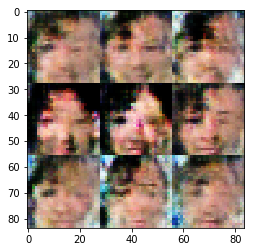

Epoch 1/1: Discriminator Loss: 0.631071 Generator Loss: 1.831839 Difference: 1.200768
Epoch 1/1: Discriminator Loss: 0.436338 Generator Loss: 3.024507 Difference: 2.588168
Epoch 1/1: Discriminator Loss: 1.380507 Generator Loss: 0.565751 Difference: -0.814756
Epoch 1/1: Discriminator Loss: 2.142284 Generator Loss: 6.697755 Difference: 4.555471
Epoch 1/1: Discriminator Loss: 0.657484 Generator Loss: 1.289687 Difference: 0.632204
Epoch 1/1: Discriminator Loss: 1.511356 Generator Loss: 3.081837 Difference: 1.570481
Tensor("generator_56/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_56/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_56/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_56/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_56/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_56/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


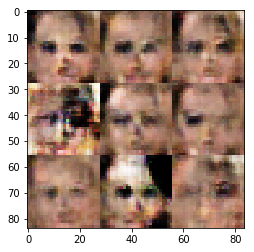

Epoch 1/1: Discriminator Loss: 0.754904 Generator Loss: 1.244375 Difference: 0.489471
Epoch 1/1: Discriminator Loss: 1.166610 Generator Loss: 0.592455 Difference: -0.574155
Epoch 1/1: Discriminator Loss: 0.768018 Generator Loss: 1.788879 Difference: 1.020861
Epoch 1/1: Discriminator Loss: 0.853658 Generator Loss: 1.580828 Difference: 0.727170
Epoch 1/1: Discriminator Loss: 0.906530 Generator Loss: 0.325423 Difference: -0.581107
Epoch 1/1: Discriminator Loss: 0.676181 Generator Loss: 4.076046 Difference: 3.399865
Tensor("generator_57/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_57/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_57/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_57/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_57/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_57/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


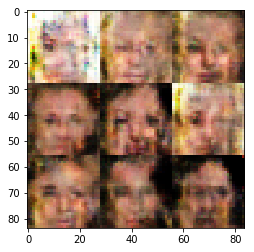

Epoch 1/1: Discriminator Loss: 0.539597 Generator Loss: 2.315401 Difference: 1.775804
Epoch 1/1: Discriminator Loss: 1.264395 Generator Loss: 0.780279 Difference: -0.484116
Epoch 1/1: Discriminator Loss: 0.659166 Generator Loss: 1.279455 Difference: 0.620290
Epoch 1/1: Discriminator Loss: 1.519895 Generator Loss: 0.840299 Difference: -0.679596
Epoch 1/1: Discriminator Loss: 2.688522 Generator Loss: 0.193102 Difference: -2.495420
Epoch 1/1: Discriminator Loss: 0.702878 Generator Loss: 2.158655 Difference: 1.455777
Tensor("generator_58/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_58/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_58/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_58/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_58/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_58/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


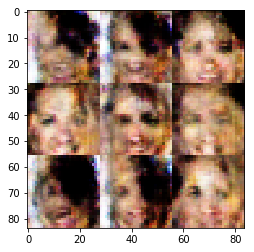

Epoch 1/1: Discriminator Loss: 1.018429 Generator Loss: 0.947385 Difference: -0.071044
Epoch 1/1: Discriminator Loss: 0.676252 Generator Loss: 2.752409 Difference: 2.076157
Epoch 1/1: Discriminator Loss: 1.019541 Generator Loss: 1.004796 Difference: -0.014746
Epoch 1/1: Discriminator Loss: 0.612323 Generator Loss: 1.949678 Difference: 1.337355
Epoch 1/1: Discriminator Loss: 1.687628 Generator Loss: 0.430562 Difference: -1.257066
Epoch 1/1: Discriminator Loss: 0.662593 Generator Loss: 1.731682 Difference: 1.069089
Tensor("generator_59/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_59/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_59/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_59/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_59/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_59/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


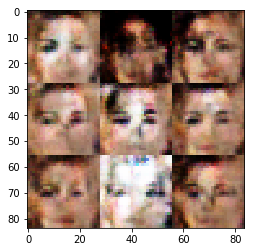

Epoch 1/1: Discriminator Loss: 0.569329 Generator Loss: 1.003532 Difference: 0.434203
Epoch 1/1: Discriminator Loss: 0.627603 Generator Loss: 2.286520 Difference: 1.658918
Epoch 1/1: Discriminator Loss: 1.628571 Generator Loss: 1.056915 Difference: -0.571656
Epoch 1/1: Discriminator Loss: 3.597424 Generator Loss: 0.029239 Difference: -3.568185
Epoch 1/1: Discriminator Loss: 0.699655 Generator Loss: 3.745454 Difference: 3.045799
Epoch 1/1: Discriminator Loss: 0.954888 Generator Loss: 0.655742 Difference: -0.299147
Tensor("generator_60/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_60/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_60/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_60/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_60/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_60/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


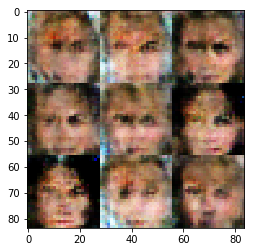

Epoch 1/1: Discriminator Loss: 0.587425 Generator Loss: 1.485096 Difference: 0.897671
Epoch 1/1: Discriminator Loss: 1.811435 Generator Loss: 0.812120 Difference: -0.999314
Epoch 1/1: Discriminator Loss: 1.061763 Generator Loss: 0.961306 Difference: -0.100457
Epoch 1/1: Discriminator Loss: 0.765091 Generator Loss: 1.499031 Difference: 0.733940
Epoch 1/1: Discriminator Loss: 0.587221 Generator Loss: 2.265273 Difference: 1.678052
Epoch 1/1: Discriminator Loss: 0.890510 Generator Loss: 0.967883 Difference: 0.077373
Tensor("generator_61/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_61/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_61/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_61/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_61/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_61/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


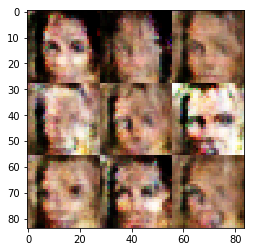

Epoch 1/1: Discriminator Loss: 0.406150 Generator Loss: 4.030704 Difference: 3.624554
Epoch 1/1: Discriminator Loss: 2.840195 Generator Loss: 6.625863 Difference: 3.785668
Epoch 1/1: Discriminator Loss: 0.556607 Generator Loss: 2.649453 Difference: 2.092846
Epoch 1/1: Discriminator Loss: 0.602049 Generator Loss: 2.060984 Difference: 1.458935
Epoch 1/1: Discriminator Loss: 0.512465 Generator Loss: 2.937825 Difference: 2.425360
Epoch 1/1: Discriminator Loss: 1.467665 Generator Loss: 0.270860 Difference: -1.196805
Tensor("generator_62/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_62/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_62/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_62/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_62/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_62/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


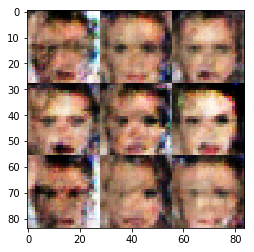

Epoch 1/1: Discriminator Loss: 1.254070 Generator Loss: 0.540494 Difference: -0.713576
Epoch 1/1: Discriminator Loss: 4.307953 Generator Loss: 0.127956 Difference: -4.179997
Epoch 1/1: Discriminator Loss: 0.575626 Generator Loss: 2.797144 Difference: 2.221518
Epoch 1/1: Discriminator Loss: 0.826932 Generator Loss: 0.898593 Difference: 0.071661
Epoch 1/1: Discriminator Loss: 0.950627 Generator Loss: 0.632568 Difference: -0.318060
Epoch 1/1: Discriminator Loss: 0.578157 Generator Loss: 1.728463 Difference: 1.150306
Tensor("generator_63/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_63/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_63/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_63/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_63/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_63/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


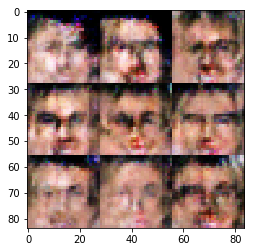

Epoch 1/1: Discriminator Loss: 2.712034 Generator Loss: 0.163321 Difference: -2.548712
Epoch 1/1: Discriminator Loss: 0.671127 Generator Loss: 0.860546 Difference: 0.189419
Epoch 1/1: Discriminator Loss: 0.770327 Generator Loss: 1.476856 Difference: 0.706528
Epoch 1/1: Discriminator Loss: 0.523097 Generator Loss: 2.478892 Difference: 1.955796
Epoch 1/1: Discriminator Loss: 0.425634 Generator Loss: 2.955989 Difference: 2.530354
Epoch 1/1: Discriminator Loss: 0.535264 Generator Loss: 3.874644 Difference: 3.339381
Tensor("generator_64/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_64/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_64/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_64/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_64/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_64/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


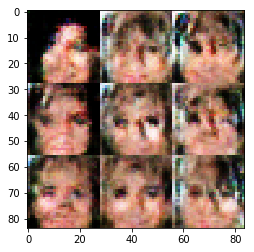

Epoch 1/1: Discriminator Loss: 1.775364 Generator Loss: 0.420153 Difference: -1.355211
Epoch 1/1: Discriminator Loss: 1.805234 Generator Loss: 0.310485 Difference: -1.494749
Epoch 1/1: Discriminator Loss: 0.416864 Generator Loss: 3.165808 Difference: 2.748944
Epoch 1/1: Discriminator Loss: 1.356219 Generator Loss: 0.480789 Difference: -0.875430
Epoch 1/1: Discriminator Loss: 0.444183 Generator Loss: 3.811541 Difference: 3.367357
Epoch 1/1: Discriminator Loss: 0.874650 Generator Loss: 0.891463 Difference: 0.016813
Tensor("generator_65/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_65/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_65/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_65/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_65/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_65/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


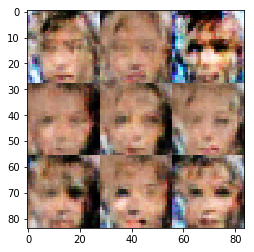

Epoch 1/1: Discriminator Loss: 2.130760 Generator Loss: 0.248678 Difference: -1.882082
Epoch 1/1: Discriminator Loss: 0.743049 Generator Loss: 1.285201 Difference: 0.542153
Epoch 1/1: Discriminator Loss: 0.434468 Generator Loss: 5.244237 Difference: 4.809769
Epoch 1/1: Discriminator Loss: 0.576142 Generator Loss: 1.309552 Difference: 0.733410
Epoch 1/1: Discriminator Loss: 0.944469 Generator Loss: 1.496902 Difference: 0.552433
Epoch 1/1: Discriminator Loss: 0.800221 Generator Loss: 0.632839 Difference: -0.167382
Tensor("generator_66/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_66/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_66/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_66/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_66/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_66/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


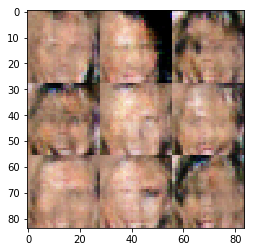

Epoch 1/1: Discriminator Loss: 1.463146 Generator Loss: 1.711937 Difference: 0.248791
Epoch 1/1: Discriminator Loss: 0.851761 Generator Loss: 1.179737 Difference: 0.327977
Epoch 1/1: Discriminator Loss: 1.260255 Generator Loss: 0.851232 Difference: -0.409023
Epoch 1/1: Discriminator Loss: 1.047427 Generator Loss: 1.431106 Difference: 0.383679
Epoch 1/1: Discriminator Loss: 0.577980 Generator Loss: 2.059211 Difference: 1.481231
Epoch 1/1: Discriminator Loss: 0.592537 Generator Loss: 2.922070 Difference: 2.329533
Tensor("generator_67/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_67/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_67/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_67/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_67/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_67/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


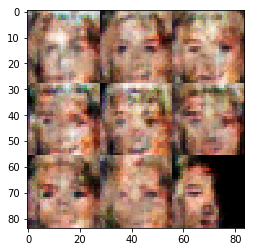

Epoch 1/1: Discriminator Loss: 0.412535 Generator Loss: 2.224869 Difference: 1.812334
Epoch 1/1: Discriminator Loss: 1.318993 Generator Loss: 0.871320 Difference: -0.447673
Epoch 1/1: Discriminator Loss: 0.492951 Generator Loss: 2.451347 Difference: 1.958395
Epoch 1/1: Discriminator Loss: 0.430258 Generator Loss: 3.927382 Difference: 3.497124
Epoch 1/1: Discriminator Loss: 3.053559 Generator Loss: 0.043931 Difference: -3.009628
Epoch 1/1: Discriminator Loss: 0.767551 Generator Loss: 0.919345 Difference: 0.151794
Tensor("generator_68/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_68/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_68/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_68/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_68/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_68/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


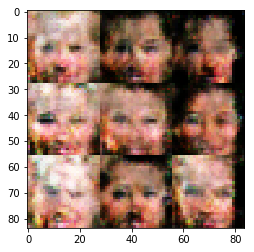

Epoch 1/1: Discriminator Loss: 0.895535 Generator Loss: 2.954891 Difference: 2.059355
Epoch 1/1: Discriminator Loss: 0.631986 Generator Loss: 2.744484 Difference: 2.112499
Epoch 1/1: Discriminator Loss: 0.757214 Generator Loss: 1.994276 Difference: 1.237063
Epoch 1/1: Discriminator Loss: 0.499883 Generator Loss: 2.405266 Difference: 1.905383
Epoch 1/1: Discriminator Loss: 0.709233 Generator Loss: 1.960505 Difference: 1.251271
Epoch 1/1: Discriminator Loss: 0.477285 Generator Loss: 2.064766 Difference: 1.587481
Tensor("generator_69/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_69/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_69/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_69/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_69/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_69/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


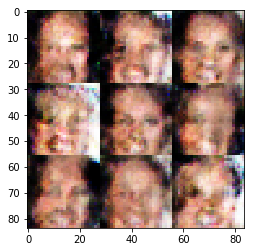

Epoch 1/1: Discriminator Loss: 0.475669 Generator Loss: 2.705590 Difference: 2.229920
Epoch 1/1: Discriminator Loss: 0.753720 Generator Loss: 1.478922 Difference: 0.725201
Epoch 1/1: Discriminator Loss: 0.887877 Generator Loss: 0.654991 Difference: -0.232886
Epoch 1/1: Discriminator Loss: 1.178806 Generator Loss: 5.258241 Difference: 4.079435
Epoch 1/1: Discriminator Loss: 0.473484 Generator Loss: 2.654444 Difference: 2.180960
Epoch 1/1: Discriminator Loss: 0.713115 Generator Loss: 1.849946 Difference: 1.136831
Tensor("generator_70/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_70/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_70/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_70/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_70/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_70/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


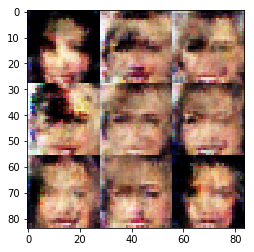

Epoch 1/1: Discriminator Loss: 1.390174 Generator Loss: 3.771802 Difference: 2.381628
Epoch 1/1: Discriminator Loss: 0.617623 Generator Loss: 1.405476 Difference: 0.787853
Epoch 1/1: Discriminator Loss: 0.922692 Generator Loss: 5.653546 Difference: 4.730854
Epoch 1/1: Discriminator Loss: 0.583213 Generator Loss: 2.450289 Difference: 1.867076
Epoch 1/1: Discriminator Loss: 0.639597 Generator Loss: 1.263204 Difference: 0.623607
Epoch 1/1: Discriminator Loss: 0.432141 Generator Loss: 2.017575 Difference: 1.585434
Tensor("generator_71/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_71/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_71/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_71/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_71/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_71/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


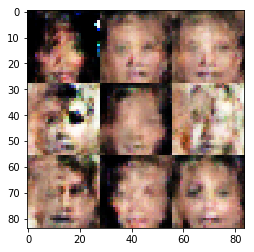

Epoch 1/1: Discriminator Loss: 0.726283 Generator Loss: 1.542939 Difference: 0.816656
Epoch 1/1: Discriminator Loss: 0.952222 Generator Loss: 1.062202 Difference: 0.109980
Epoch 1/1: Discriminator Loss: 0.671796 Generator Loss: 2.720008 Difference: 2.048212
Epoch 1/1: Discriminator Loss: 0.418449 Generator Loss: 2.373701 Difference: 1.955252
Epoch 1/1: Discriminator Loss: 0.749519 Generator Loss: 3.259810 Difference: 2.510291
Epoch 1/1: Discriminator Loss: 0.715003 Generator Loss: 2.463001 Difference: 1.747997
Tensor("generator_72/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_72/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_72/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_72/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_72/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_72/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


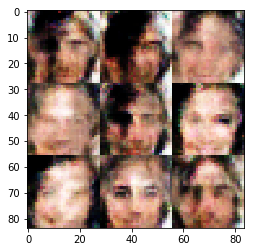

Epoch 1/1: Discriminator Loss: 0.752293 Generator Loss: 1.722833 Difference: 0.970540
Epoch 1/1: Discriminator Loss: 1.720370 Generator Loss: 0.305926 Difference: -1.414444
Epoch 1/1: Discriminator Loss: 0.593660 Generator Loss: 1.512778 Difference: 0.919119
Epoch 1/1: Discriminator Loss: 0.737567 Generator Loss: 1.191711 Difference: 0.454144
Epoch 1/1: Discriminator Loss: 1.700189 Generator Loss: 6.014234 Difference: 4.314045
Epoch 1/1: Discriminator Loss: 0.743869 Generator Loss: 2.077483 Difference: 1.333614
Tensor("generator_73/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_73/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_73/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_73/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_73/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_73/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


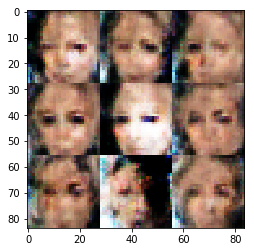

Epoch 1/1: Discriminator Loss: 0.885035 Generator Loss: 5.399872 Difference: 4.514837
Epoch 1/1: Discriminator Loss: 0.725567 Generator Loss: 1.744031 Difference: 1.018464
Epoch 1/1: Discriminator Loss: 0.925003 Generator Loss: 1.568044 Difference: 0.643041
Epoch 1/1: Discriminator Loss: 0.594407 Generator Loss: 2.450158 Difference: 1.855750
Epoch 1/1: Discriminator Loss: 2.668442 Generator Loss: 0.113079 Difference: -2.555364
Epoch 1/1: Discriminator Loss: 1.142229 Generator Loss: 0.432257 Difference: -0.709972
Tensor("generator_74/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_74/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_74/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_74/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_74/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_74/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


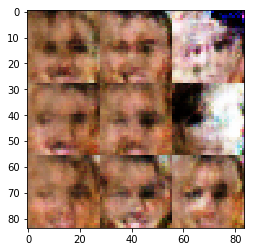

Epoch 1/1: Discriminator Loss: 2.804879 Generator Loss: 0.460141 Difference: -2.344738
Epoch 1/1: Discriminator Loss: 0.849123 Generator Loss: 0.885041 Difference: 0.035918
Epoch 1/1: Discriminator Loss: 1.046089 Generator Loss: 1.218606 Difference: 0.172517
Epoch 1/1: Discriminator Loss: 0.454589 Generator Loss: 2.352981 Difference: 1.898392
Epoch 1/1: Discriminator Loss: 0.543523 Generator Loss: 2.885685 Difference: 2.342163
Epoch 1/1: Discriminator Loss: 1.257866 Generator Loss: 0.523381 Difference: -0.734484
Tensor("generator_75/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_75/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_75/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_75/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_75/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_75/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


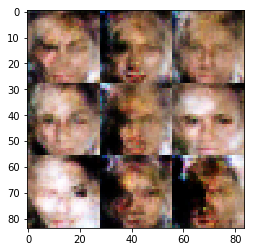

Epoch 1/1: Discriminator Loss: 1.456730 Generator Loss: 2.992184 Difference: 1.535453
Epoch 1/1: Discriminator Loss: 1.143394 Generator Loss: 0.822360 Difference: -0.321034
Epoch 1/1: Discriminator Loss: 0.445660 Generator Loss: 2.563725 Difference: 2.118064
Epoch 1/1: Discriminator Loss: 0.567267 Generator Loss: 2.167084 Difference: 1.599818
Epoch 1/1: Discriminator Loss: 3.336026 Generator Loss: 0.098140 Difference: -3.237887
Epoch 1/1: Discriminator Loss: 0.466365 Generator Loss: 1.489166 Difference: 1.022802
Tensor("generator_76/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_76/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_76/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_76/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_76/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_76/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


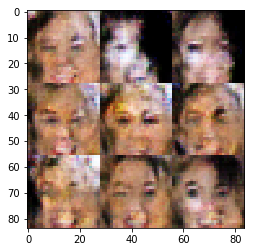

Epoch 1/1: Discriminator Loss: 0.917300 Generator Loss: 0.897978 Difference: -0.019322
Epoch 1/1: Discriminator Loss: 0.694497 Generator Loss: 1.008742 Difference: 0.314245
Epoch 1/1: Discriminator Loss: 2.575883 Generator Loss: 0.159456 Difference: -2.416427
Epoch 1/1: Discriminator Loss: 0.651048 Generator Loss: 2.697098 Difference: 2.046050
Epoch 1/1: Discriminator Loss: 0.368951 Generator Loss: 2.442416 Difference: 2.073465
Epoch 1/1: Discriminator Loss: 1.210981 Generator Loss: 5.673030 Difference: 4.462049
Tensor("generator_77/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_77/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_77/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_77/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_77/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_77/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


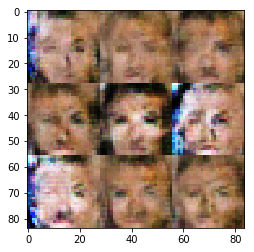

Epoch 1/1: Discriminator Loss: 1.027908 Generator Loss: 0.880038 Difference: -0.147870
Epoch 1/1: Discriminator Loss: 0.582642 Generator Loss: 1.980187 Difference: 1.397545
Epoch 1/1: Discriminator Loss: 0.557688 Generator Loss: 1.752411 Difference: 1.194724
Epoch 1/1: Discriminator Loss: 0.911396 Generator Loss: 0.902409 Difference: -0.008987
Epoch 1/1: Discriminator Loss: 0.398693 Generator Loss: 3.126459 Difference: 2.727766
Epoch 1/1: Discriminator Loss: 0.960176 Generator Loss: 1.311520 Difference: 0.351344
Tensor("generator_78/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_78/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_78/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_78/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_78/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_78/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


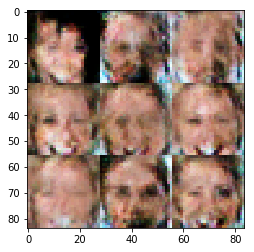

Epoch 1/1: Discriminator Loss: 2.698926 Generator Loss: 8.817005 Difference: 6.118079
Epoch 1/1: Discriminator Loss: 0.507414 Generator Loss: 2.397677 Difference: 1.890264
Epoch 1/1: Discriminator Loss: 1.005416 Generator Loss: 0.555207 Difference: -0.450209
Epoch 1/1: Discriminator Loss: 0.646511 Generator Loss: 0.883726 Difference: 0.237215
Epoch 1/1: Discriminator Loss: 1.093643 Generator Loss: 2.312650 Difference: 1.219007
Epoch 1/1: Discriminator Loss: 0.562307 Generator Loss: 1.653514 Difference: 1.091207
Tensor("generator_79/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_79/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_79/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_79/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_79/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_79/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


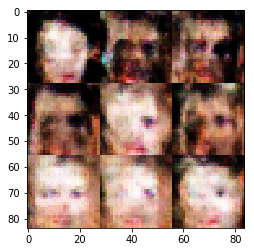

Epoch 1/1: Discriminator Loss: 0.705446 Generator Loss: 3.206301 Difference: 2.500854
Epoch 1/1: Discriminator Loss: 1.184504 Generator Loss: 0.470192 Difference: -0.714312
Epoch 1/1: Discriminator Loss: 0.502067 Generator Loss: 3.839307 Difference: 3.337240
Epoch 1/1: Discriminator Loss: 0.529699 Generator Loss: 1.950803 Difference: 1.421104
Epoch 1/1: Discriminator Loss: 0.594200 Generator Loss: 2.610265 Difference: 2.016064
Epoch 1/1: Discriminator Loss: 0.492361 Generator Loss: 6.352904 Difference: 5.860542
Tensor("generator_80/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_80/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_80/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_80/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_80/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_80/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


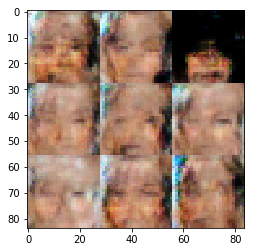

Epoch 1/1: Discriminator Loss: 1.819664 Generator Loss: 6.259094 Difference: 4.439430
Epoch 1/1: Discriminator Loss: 0.468483 Generator Loss: 2.260851 Difference: 1.792368
Epoch 1/1: Discriminator Loss: 0.513218 Generator Loss: 2.198548 Difference: 1.685330
Epoch 1/1: Discriminator Loss: 0.472457 Generator Loss: 2.217693 Difference: 1.745235
Epoch 1/1: Discriminator Loss: 0.499362 Generator Loss: 2.275215 Difference: 1.775852
Epoch 1/1: Discriminator Loss: 0.950664 Generator Loss: 1.425774 Difference: 0.475110
Tensor("generator_81/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_81/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_81/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_81/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_81/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_81/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


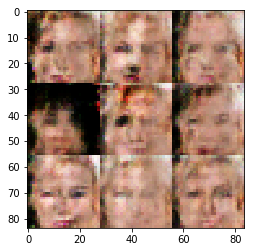

Epoch 1/1: Discriminator Loss: 0.552755 Generator Loss: 1.647269 Difference: 1.094514
Epoch 1/1: Discriminator Loss: 1.232507 Generator Loss: 0.850976 Difference: -0.381530
Epoch 1/1: Discriminator Loss: 0.583111 Generator Loss: 3.363707 Difference: 2.780595
Epoch 1/1: Discriminator Loss: 1.170083 Generator Loss: 0.718895 Difference: -0.451187
Epoch 1/1: Discriminator Loss: 1.023840 Generator Loss: 0.540645 Difference: -0.483195
Epoch 1/1: Discriminator Loss: 1.176494 Generator Loss: 5.708845 Difference: 4.532351
Tensor("generator_82/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_82/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_82/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_82/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_82/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_82/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


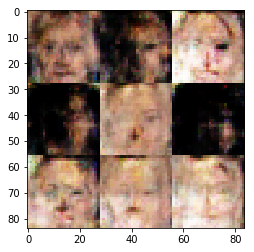

Epoch 1/1: Discriminator Loss: 0.422184 Generator Loss: 2.626059 Difference: 2.203875
Epoch 1/1: Discriminator Loss: 0.585763 Generator Loss: 1.693924 Difference: 1.108162
Epoch 1/1: Discriminator Loss: 0.364416 Generator Loss: 4.876509 Difference: 4.512093
Epoch 1/1: Discriminator Loss: 0.497249 Generator Loss: 3.670118 Difference: 3.172869
Epoch 1/1: Discriminator Loss: 1.632441 Generator Loss: 0.832003 Difference: -0.800438
Epoch 1/1: Discriminator Loss: 1.086545 Generator Loss: 5.810139 Difference: 4.723593
Tensor("generator_83/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_83/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_83/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_83/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_83/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_83/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


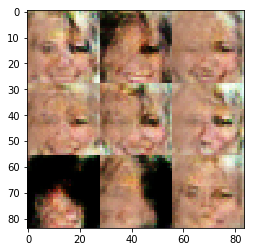

Epoch 1/1: Discriminator Loss: 0.503529 Generator Loss: 2.241423 Difference: 1.737895
Epoch 1/1: Discriminator Loss: 0.599480 Generator Loss: 4.826678 Difference: 4.227198
Epoch 1/1: Discriminator Loss: 0.584071 Generator Loss: 1.366333 Difference: 0.782261
Epoch 1/1: Discriminator Loss: 0.567875 Generator Loss: 1.767076 Difference: 1.199200
Epoch 1/1: Discriminator Loss: 1.256294 Generator Loss: 0.633267 Difference: -0.623027
Epoch 1/1: Discriminator Loss: 1.191308 Generator Loss: 1.047115 Difference: -0.144193
Tensor("generator_84/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_84/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_84/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_84/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_84/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_84/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


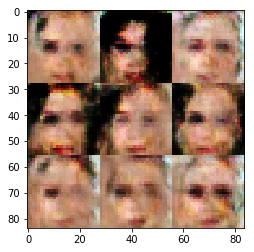

Epoch 1/1: Discriminator Loss: 1.347550 Generator Loss: 1.265958 Difference: -0.081592
Epoch 1/1: Discriminator Loss: 1.028412 Generator Loss: 1.393131 Difference: 0.364719
Epoch 1/1: Discriminator Loss: 0.592265 Generator Loss: 3.060854 Difference: 2.468589
Epoch 1/1: Discriminator Loss: 0.509708 Generator Loss: 2.514657 Difference: 2.004950
Epoch 1/1: Discriminator Loss: 1.420235 Generator Loss: 6.564378 Difference: 5.144143
Epoch 1/1: Discriminator Loss: 1.601615 Generator Loss: 5.983678 Difference: 4.382063
Tensor("generator_85/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_85/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_85/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_85/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_85/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_85/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


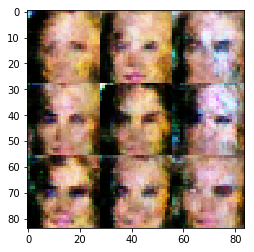

Epoch 1/1: Discriminator Loss: 0.457329 Generator Loss: 5.154330 Difference: 4.697001
Epoch 1/1: Discriminator Loss: 0.469707 Generator Loss: 3.123017 Difference: 2.653309
Epoch 1/1: Discriminator Loss: 0.698677 Generator Loss: 1.276331 Difference: 0.577654
Epoch 1/1: Discriminator Loss: 1.106228 Generator Loss: 0.658018 Difference: -0.448209
Epoch 1/1: Discriminator Loss: 0.349639 Generator Loss: 3.830552 Difference: 3.480913
Epoch 1/1: Discriminator Loss: 0.619870 Generator Loss: 5.292319 Difference: 4.672449
Tensor("generator_86/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_86/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_86/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_86/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_86/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_86/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


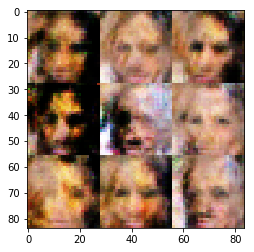

Epoch 1/1: Discriminator Loss: 1.839362 Generator Loss: 0.267427 Difference: -1.571934
Epoch 1/1: Discriminator Loss: 2.882177 Generator Loss: 0.315204 Difference: -2.566973
Epoch 1/1: Discriminator Loss: 0.483749 Generator Loss: 6.180781 Difference: 5.697032
Epoch 1/1: Discriminator Loss: 0.475895 Generator Loss: 2.199851 Difference: 1.723955
Epoch 1/1: Discriminator Loss: 0.448824 Generator Loss: 2.608875 Difference: 2.160051
Epoch 1/1: Discriminator Loss: 0.727635 Generator Loss: 1.031152 Difference: 0.303517
Tensor("generator_87/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_87/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_87/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_87/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_87/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_87/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


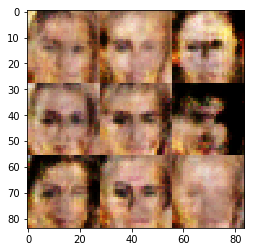

Epoch 1/1: Discriminator Loss: 2.240376 Generator Loss: 0.114467 Difference: -2.125910
Epoch 1/1: Discriminator Loss: 0.503582 Generator Loss: 2.280739 Difference: 1.777157
Epoch 1/1: Discriminator Loss: 0.603796 Generator Loss: 1.616824 Difference: 1.013028
Epoch 1/1: Discriminator Loss: 0.581770 Generator Loss: 1.223153 Difference: 0.641383
Epoch 1/1: Discriminator Loss: 0.449414 Generator Loss: 2.026296 Difference: 1.576882
Epoch 1/1: Discriminator Loss: 0.599336 Generator Loss: 1.989324 Difference: 1.389988
Tensor("generator_88/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_88/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_88/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_88/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_88/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_88/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


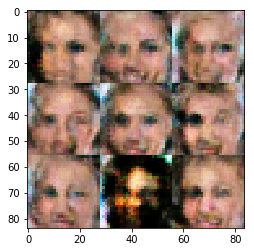

Epoch 1/1: Discriminator Loss: 1.877811 Generator Loss: 0.343660 Difference: -1.534151
Epoch 1/1: Discriminator Loss: 1.012083 Generator Loss: 1.563339 Difference: 0.551256
Epoch 1/1: Discriminator Loss: 0.725897 Generator Loss: 1.251442 Difference: 0.525545
Epoch 1/1: Discriminator Loss: 0.474727 Generator Loss: 2.222221 Difference: 1.747494
Epoch 1/1: Discriminator Loss: 1.215784 Generator Loss: 0.829105 Difference: -0.386679
Epoch 1/1: Discriminator Loss: 0.744791 Generator Loss: 1.724134 Difference: 0.979343
Tensor("generator_89/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_89/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_89/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_89/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_89/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_89/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


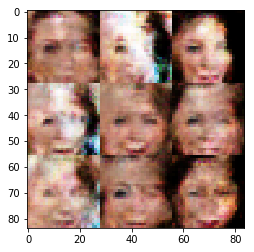

Epoch 1/1: Discriminator Loss: 0.603549 Generator Loss: 1.190042 Difference: 0.586493
Epoch 1/1: Discriminator Loss: 0.721461 Generator Loss: 1.745962 Difference: 1.024501
Epoch 1/1: Discriminator Loss: 0.650507 Generator Loss: 1.424893 Difference: 0.774386
Epoch 1/1: Discriminator Loss: 0.938030 Generator Loss: 1.291815 Difference: 0.353785
Epoch 1/1: Discriminator Loss: 0.660558 Generator Loss: 2.261310 Difference: 1.600751
Epoch 1/1: Discriminator Loss: 0.497581 Generator Loss: 2.648634 Difference: 2.151053
Tensor("generator_90/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_90/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_90/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_90/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_90/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_90/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


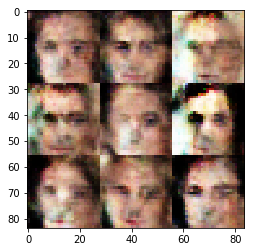

Epoch 1/1: Discriminator Loss: 1.613222 Generator Loss: 8.482892 Difference: 6.869670
Epoch 1/1: Discriminator Loss: 0.455710 Generator Loss: 2.832173 Difference: 2.376463
Epoch 1/1: Discriminator Loss: 0.741836 Generator Loss: 5.029590 Difference: 4.287754
Epoch 1/1: Discriminator Loss: 0.612769 Generator Loss: 1.160819 Difference: 0.548050
Epoch 1/1: Discriminator Loss: 0.874873 Generator Loss: 1.554136 Difference: 0.679262
Epoch 1/1: Discriminator Loss: 1.556544 Generator Loss: 0.612788 Difference: -0.943756
Tensor("generator_91/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_91/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_91/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_91/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_91/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_91/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


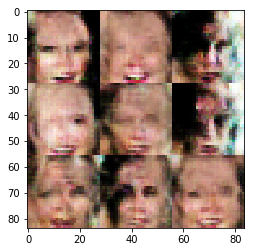

Epoch 1/1: Discriminator Loss: 0.552478 Generator Loss: 1.480437 Difference: 0.927959
Epoch 1/1: Discriminator Loss: 0.541643 Generator Loss: 1.961113 Difference: 1.419470
Epoch 1/1: Discriminator Loss: 0.460489 Generator Loss: 4.243835 Difference: 3.783346
Epoch 1/1: Discriminator Loss: 1.270938 Generator Loss: 0.691290 Difference: -0.579648
Epoch 1/1: Discriminator Loss: 0.514898 Generator Loss: 2.937505 Difference: 2.422606
Epoch 1/1: Discriminator Loss: 0.606344 Generator Loss: 1.693068 Difference: 1.086724
Tensor("generator_92/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_92/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_92/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_92/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_92/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_92/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


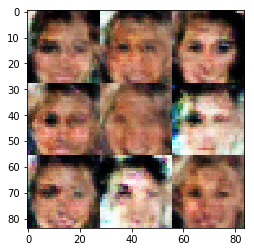

Epoch 1/1: Discriminator Loss: 0.494362 Generator Loss: 1.782146 Difference: 1.287784
Epoch 1/1: Discriminator Loss: 0.933666 Generator Loss: 3.897757 Difference: 2.964091
Epoch 1/1: Discriminator Loss: 3.767543 Generator Loss: 0.524460 Difference: -3.243083
Epoch 1/1: Discriminator Loss: 0.507760 Generator Loss: 1.352172 Difference: 0.844412
Epoch 1/1: Discriminator Loss: 0.530289 Generator Loss: 1.728495 Difference: 1.198207
Epoch 1/1: Discriminator Loss: 0.794136 Generator Loss: 0.597262 Difference: -0.196873
Tensor("generator_93/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_93/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_93/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_93/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_93/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_93/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


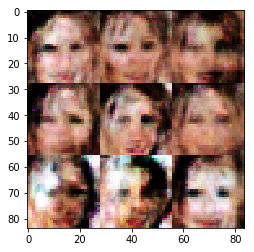

Epoch 1/1: Discriminator Loss: 1.410463 Generator Loss: 0.553423 Difference: -0.857041
Epoch 1/1: Discriminator Loss: 0.758172 Generator Loss: 1.210988 Difference: 0.452816
Epoch 1/1: Discriminator Loss: 0.447177 Generator Loss: 4.244542 Difference: 3.797365
Epoch 1/1: Discriminator Loss: 0.688378 Generator Loss: 1.153620 Difference: 0.465242
Epoch 1/1: Discriminator Loss: 0.538337 Generator Loss: 1.491681 Difference: 0.953344
Epoch 1/1: Discriminator Loss: 0.432739 Generator Loss: 4.332626 Difference: 3.899888
Tensor("generator_94/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_94/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_94/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_94/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_94/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_94/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


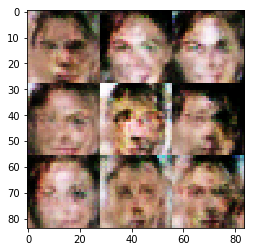

Epoch 1/1: Discriminator Loss: 0.947157 Generator Loss: 0.278543 Difference: -0.668614
Epoch 1/1: Discriminator Loss: 0.576782 Generator Loss: 1.923829 Difference: 1.347046
Epoch 1/1: Discriminator Loss: 0.795159 Generator Loss: 1.647786 Difference: 0.852627
Epoch 1/1: Discriminator Loss: 1.893798 Generator Loss: 0.354367 Difference: -1.539431
Epoch 1/1: Discriminator Loss: 0.432671 Generator Loss: 3.595675 Difference: 3.163004
Epoch 1/1: Discriminator Loss: 0.358891 Generator Loss: 3.283212 Difference: 2.924322
Tensor("generator_95/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_95/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_95/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_95/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_95/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_95/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


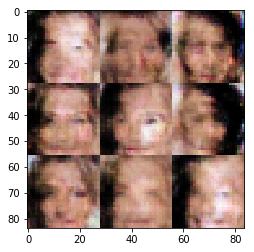

Epoch 1/1: Discriminator Loss: 3.157564 Generator Loss: 6.982499 Difference: 3.824935
Epoch 1/1: Discriminator Loss: 0.866370 Generator Loss: 1.076917 Difference: 0.210546
Epoch 1/1: Discriminator Loss: 0.623398 Generator Loss: 2.522160 Difference: 1.898762
Epoch 1/1: Discriminator Loss: 0.602386 Generator Loss: 4.141943 Difference: 3.539557
Epoch 1/1: Discriminator Loss: 0.578191 Generator Loss: 2.011280 Difference: 1.433089
Epoch 1/1: Discriminator Loss: 0.388018 Generator Loss: 3.056066 Difference: 2.668048
Tensor("generator_96/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_96/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_96/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_96/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_96/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_96/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


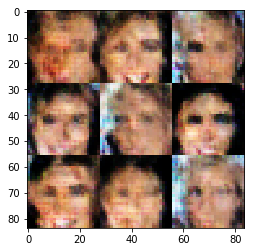

Epoch 1/1: Discriminator Loss: 0.659502 Generator Loss: 2.460003 Difference: 1.800501
Epoch 1/1: Discriminator Loss: 0.656924 Generator Loss: 0.768298 Difference: 0.111374
Epoch 1/1: Discriminator Loss: 0.700531 Generator Loss: 1.318232 Difference: 0.617701
Epoch 1/1: Discriminator Loss: 0.778270 Generator Loss: 1.367617 Difference: 0.589347
Epoch 1/1: Discriminator Loss: 3.162274 Generator Loss: 0.090419 Difference: -3.071856
Epoch 1/1: Discriminator Loss: 0.748103 Generator Loss: 1.566130 Difference: 0.818027
Tensor("generator_97/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_97/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_97/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_97/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_97/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_97/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


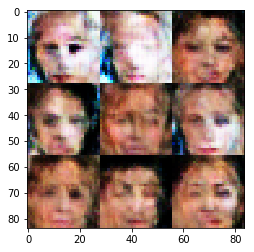

Epoch 1/1: Discriminator Loss: 0.667678 Generator Loss: 2.275969 Difference: 1.608292
Epoch 1/1: Discriminator Loss: 0.831611 Generator Loss: 1.305539 Difference: 0.473928
Epoch 1/1: Discriminator Loss: 0.686170 Generator Loss: 2.929557 Difference: 2.243387
Epoch 1/1: Discriminator Loss: 0.670456 Generator Loss: 2.208295 Difference: 1.537839
Epoch 1/1: Discriminator Loss: 0.490882 Generator Loss: 3.248166 Difference: 2.757284
Epoch 1/1: Discriminator Loss: 0.653402 Generator Loss: 1.986543 Difference: 1.333141
Tensor("generator_98/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_98/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_98/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_98/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_98/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_98/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


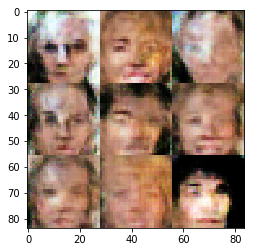

Epoch 1/1: Discriminator Loss: 0.941727 Generator Loss: 1.345992 Difference: 0.404265
Epoch 1/1: Discriminator Loss: 0.384920 Generator Loss: 2.241532 Difference: 1.856612
Epoch 1/1: Discriminator Loss: 0.685511 Generator Loss: 0.518834 Difference: -0.166677
Epoch 1/1: Discriminator Loss: 0.457138 Generator Loss: 3.201577 Difference: 2.744439
Epoch 1/1: Discriminator Loss: 0.458552 Generator Loss: 2.421899 Difference: 1.963347
Epoch 1/1: Discriminator Loss: 0.750966 Generator Loss: 3.089255 Difference: 2.338289
Tensor("generator_99/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_99/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_99/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_99/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_99/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_99/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


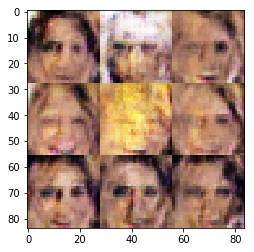

Epoch 1/1: Discriminator Loss: 2.728317 Generator Loss: 7.438422 Difference: 4.710105
Epoch 1/1: Discriminator Loss: 0.495943 Generator Loss: 1.896468 Difference: 1.400525
Epoch 1/1: Discriminator Loss: 1.090858 Generator Loss: 0.622240 Difference: -0.468617
Epoch 1/1: Discriminator Loss: 0.401530 Generator Loss: 6.007007 Difference: 5.605476
Epoch 1/1: Discriminator Loss: 2.582042 Generator Loss: 0.520721 Difference: -2.061321
Epoch 1/1: Discriminator Loss: 0.903069 Generator Loss: 4.832017 Difference: 3.928948
Tensor("generator_100/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_100/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_100/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_100/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_100/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_100/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


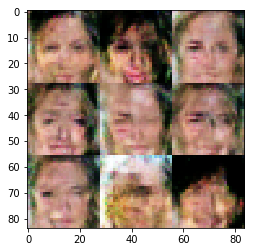

Epoch 1/1: Discriminator Loss: 1.073112 Generator Loss: 4.429556 Difference: 3.356443
Epoch 1/1: Discriminator Loss: 1.286396 Generator Loss: 4.668112 Difference: 3.381716
Epoch 1/1: Discriminator Loss: 3.729587 Generator Loss: 5.935955 Difference: 2.206368
Epoch 1/1: Discriminator Loss: 2.479453 Generator Loss: 0.389318 Difference: -2.090135
Epoch 1/1: Discriminator Loss: 0.558138 Generator Loss: 2.979461 Difference: 2.421323
Epoch 1/1: Discriminator Loss: 1.923687 Generator Loss: 0.335404 Difference: -1.588283
Tensor("generator_101/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_101/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_101/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_101/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_101/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_101/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


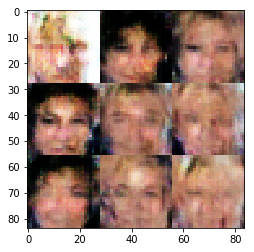

Epoch 1/1: Discriminator Loss: 0.927481 Generator Loss: 2.189364 Difference: 1.261883
Epoch 1/1: Discriminator Loss: 2.332862 Generator Loss: 0.886901 Difference: -1.445961
Epoch 1/1: Discriminator Loss: 1.120470 Generator Loss: 0.855453 Difference: -0.265017
Epoch 1/1: Discriminator Loss: 1.573248 Generator Loss: 0.896630 Difference: -0.676618
Epoch 1/1: Discriminator Loss: 0.523902 Generator Loss: 2.489021 Difference: 1.965118
Epoch 1/1: Discriminator Loss: 0.545003 Generator Loss: 2.358507 Difference: 1.813504
Tensor("generator_102/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_102/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_102/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_102/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_102/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_102/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


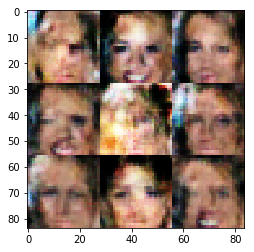

Epoch 1/1: Discriminator Loss: 3.936193 Generator Loss: 6.823450 Difference: 2.887257
Epoch 1/1: Discriminator Loss: 0.644079 Generator Loss: 1.953029 Difference: 1.308950
Epoch 1/1: Discriminator Loss: 0.675937 Generator Loss: 1.617693 Difference: 0.941756
Epoch 1/1: Discriminator Loss: 0.384741 Generator Loss: 4.404450 Difference: 4.019709
Epoch 1/1: Discriminator Loss: 0.426983 Generator Loss: 2.522928 Difference: 2.095945
Epoch 1/1: Discriminator Loss: 0.775546 Generator Loss: 2.721981 Difference: 1.946435
Tensor("generator_103/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_103/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_103/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_103/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_103/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_103/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


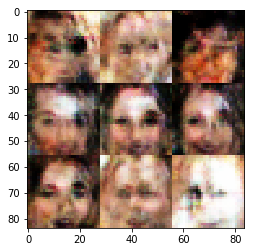

Epoch 1/1: Discriminator Loss: 0.518430 Generator Loss: 1.377918 Difference: 0.859488
Epoch 1/1: Discriminator Loss: 0.416056 Generator Loss: 4.335146 Difference: 3.919090
Epoch 1/1: Discriminator Loss: 0.793104 Generator Loss: 1.790231 Difference: 0.997126
Epoch 1/1: Discriminator Loss: 0.553600 Generator Loss: 0.665604 Difference: 0.112004
Epoch 1/1: Discriminator Loss: 0.587383 Generator Loss: 2.921541 Difference: 2.334158
Epoch 1/1: Discriminator Loss: 0.344423 Generator Loss: 5.426633 Difference: 5.082210
Tensor("generator_104/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_104/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_104/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_104/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_104/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_104/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


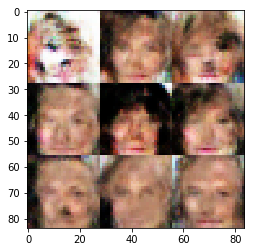

Epoch 1/1: Discriminator Loss: 1.757903 Generator Loss: 6.226178 Difference: 4.468275
Epoch 1/1: Discriminator Loss: 0.439288 Generator Loss: 3.316165 Difference: 2.876877
Epoch 1/1: Discriminator Loss: 0.671277 Generator Loss: 1.808541 Difference: 1.137264
Epoch 1/1: Discriminator Loss: 0.649008 Generator Loss: 1.909013 Difference: 1.260005
Epoch 1/1: Discriminator Loss: 0.714873 Generator Loss: 1.650429 Difference: 0.935556
Epoch 1/1: Discriminator Loss: 1.046391 Generator Loss: 5.770315 Difference: 4.723924
Tensor("generator_105/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_105/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_105/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_105/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_105/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_105/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


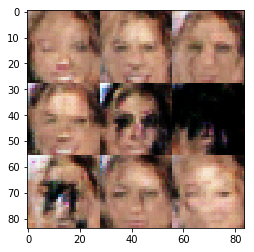

Epoch 1/1: Discriminator Loss: 0.595043 Generator Loss: 2.877963 Difference: 2.282920
Epoch 1/1: Discriminator Loss: 0.528126 Generator Loss: 2.439921 Difference: 1.911794
Epoch 1/1: Discriminator Loss: 1.353303 Generator Loss: 0.669606 Difference: -0.683696
Epoch 1/1: Discriminator Loss: 2.179144 Generator Loss: 0.325693 Difference: -1.853451
Epoch 1/1: Discriminator Loss: 0.885122 Generator Loss: 0.902975 Difference: 0.017854
Epoch 1/1: Discriminator Loss: 0.724454 Generator Loss: 2.477014 Difference: 1.752559
Tensor("generator_106/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_106/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_106/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_106/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_106/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_106/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


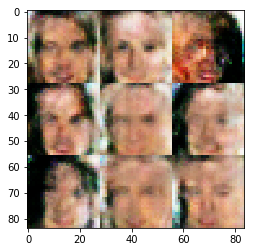

Epoch 1/1: Discriminator Loss: 0.491871 Generator Loss: 3.049430 Difference: 2.557559
Epoch 1/1: Discriminator Loss: 0.487093 Generator Loss: 2.696776 Difference: 2.209682
Epoch 1/1: Discriminator Loss: 0.478330 Generator Loss: 3.253716 Difference: 2.775387
Epoch 1/1: Discriminator Loss: 0.470357 Generator Loss: 3.634897 Difference: 3.164540
Epoch 1/1: Discriminator Loss: 0.542074 Generator Loss: 1.998053 Difference: 1.455979
Epoch 1/1: Discriminator Loss: 0.493062 Generator Loss: 3.042386 Difference: 2.549324
Tensor("generator_107/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_107/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_107/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_107/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_107/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_107/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


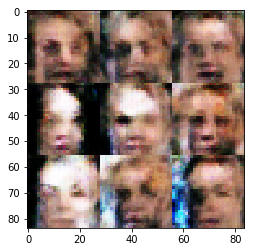

Epoch 1/1: Discriminator Loss: 1.081563 Generator Loss: 1.120743 Difference: 0.039179
Epoch 1/1: Discriminator Loss: 0.757263 Generator Loss: 2.250890 Difference: 1.493627
Epoch 1/1: Discriminator Loss: 0.947504 Generator Loss: 1.361775 Difference: 0.414271
Epoch 1/1: Discriminator Loss: 0.387625 Generator Loss: 3.685412 Difference: 3.297787
Epoch 1/1: Discriminator Loss: 0.476507 Generator Loss: 2.327157 Difference: 1.850650
Epoch 1/1: Discriminator Loss: 1.217533 Generator Loss: 1.213922 Difference: -0.003611
Tensor("generator_108/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_108/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_108/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_108/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_108/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_108/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


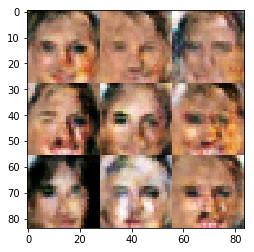

Epoch 1/1: Discriminator Loss: 0.471453 Generator Loss: 2.555417 Difference: 2.083963
Epoch 1/1: Discriminator Loss: 0.508389 Generator Loss: 2.477343 Difference: 1.968954
Epoch 1/1: Discriminator Loss: 0.460769 Generator Loss: 2.786362 Difference: 2.325593
Epoch 1/1: Discriminator Loss: 1.387558 Generator Loss: 1.492440 Difference: 0.104882
Epoch 1/1: Discriminator Loss: 1.210488 Generator Loss: 0.904465 Difference: -0.306024
Epoch 1/1: Discriminator Loss: 0.491031 Generator Loss: 2.121267 Difference: 1.630236
Tensor("generator_109/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_109/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_109/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_109/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_109/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_109/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


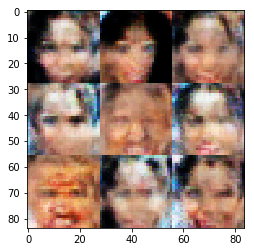

Epoch 1/1: Discriminator Loss: 2.357183 Generator Loss: 0.306646 Difference: -2.050537
Epoch 1/1: Discriminator Loss: 0.524538 Generator Loss: 2.794864 Difference: 2.270326
Epoch 1/1: Discriminator Loss: 0.880008 Generator Loss: 0.998164 Difference: 0.118156
Epoch 1/1: Discriminator Loss: 1.165906 Generator Loss: 0.346016 Difference: -0.819890
Epoch 1/1: Discriminator Loss: 0.598161 Generator Loss: 2.167711 Difference: 1.569550
Epoch 1/1: Discriminator Loss: 0.586112 Generator Loss: 0.705771 Difference: 0.119660
Tensor("generator_110/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_110/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_110/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_110/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_110/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_110/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


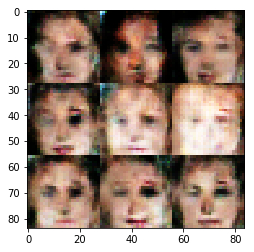

Epoch 1/1: Discriminator Loss: 0.344390 Generator Loss: 2.804651 Difference: 2.460261
Epoch 1/1: Discriminator Loss: 0.530278 Generator Loss: 1.546987 Difference: 1.016710
Epoch 1/1: Discriminator Loss: 4.101252 Generator Loss: 11.614862 Difference: 7.513611
Epoch 1/1: Discriminator Loss: 0.383916 Generator Loss: 3.803964 Difference: 3.420048
Epoch 1/1: Discriminator Loss: 1.139775 Generator Loss: 0.298109 Difference: -0.841666
Epoch 1/1: Discriminator Loss: 0.457924 Generator Loss: 2.289509 Difference: 1.831585
Tensor("generator_111/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_111/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_111/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_111/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_111/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_111/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


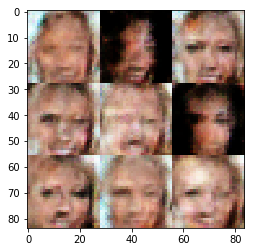

Epoch 1/1: Discriminator Loss: 0.597195 Generator Loss: 1.454625 Difference: 0.857430
Epoch 1/1: Discriminator Loss: 0.921124 Generator Loss: 1.994043 Difference: 1.072919
Epoch 1/1: Discriminator Loss: 0.434447 Generator Loss: 4.219851 Difference: 3.785405
Epoch 1/1: Discriminator Loss: 0.889934 Generator Loss: 5.629537 Difference: 4.739603
Epoch 1/1: Discriminator Loss: 0.606177 Generator Loss: 1.265441 Difference: 0.659264
Epoch 1/1: Discriminator Loss: 1.732836 Generator Loss: 7.478067 Difference: 5.745231
Tensor("generator_112/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_112/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_112/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_112/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_112/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_112/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


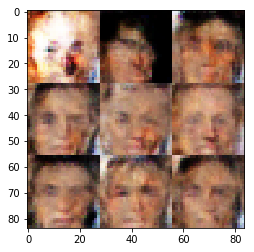

Epoch 1/1: Discriminator Loss: 0.560775 Generator Loss: 2.784215 Difference: 2.223440
Epoch 1/1: Discriminator Loss: 1.029051 Generator Loss: 7.333401 Difference: 6.304349
Epoch 1/1: Discriminator Loss: 0.654616 Generator Loss: 2.356036 Difference: 1.701420
Epoch 1/1: Discriminator Loss: 0.634433 Generator Loss: 4.190964 Difference: 3.556531
Epoch 1/1: Discriminator Loss: 0.476066 Generator Loss: 1.611797 Difference: 1.135731
Epoch 1/1: Discriminator Loss: 0.523869 Generator Loss: 2.194596 Difference: 1.670727
Tensor("generator_113/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_113/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_113/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_113/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_113/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_113/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


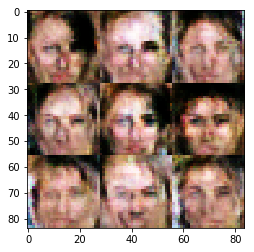

Epoch 1/1: Discriminator Loss: 1.127623 Generator Loss: 5.253428 Difference: 4.125804
Epoch 1/1: Discriminator Loss: 0.514526 Generator Loss: 3.271949 Difference: 2.757423
Epoch 1/1: Discriminator Loss: 0.482880 Generator Loss: 2.327256 Difference: 1.844376
Epoch 1/1: Discriminator Loss: 0.597059 Generator Loss: 2.772753 Difference: 2.175694
Epoch 1/1: Discriminator Loss: 2.213106 Generator Loss: 0.951793 Difference: -1.261313
Epoch 1/1: Discriminator Loss: 0.578605 Generator Loss: 1.460906 Difference: 0.882301
Tensor("generator_114/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_114/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_114/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_114/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_114/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_114/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


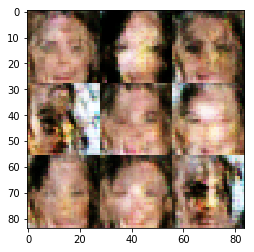

Epoch 1/1: Discriminator Loss: 3.035620 Generator Loss: 1.061780 Difference: -1.973840
Epoch 1/1: Discriminator Loss: 0.368478 Generator Loss: 3.431228 Difference: 3.062750
Epoch 1/1: Discriminator Loss: 0.525431 Generator Loss: 6.659685 Difference: 6.134254
Epoch 1/1: Discriminator Loss: 0.832545 Generator Loss: 1.581542 Difference: 0.748997
Epoch 1/1: Discriminator Loss: 0.496244 Generator Loss: 1.811517 Difference: 1.315273
Epoch 1/1: Discriminator Loss: 1.503818 Generator Loss: 0.299825 Difference: -1.203993
Tensor("generator_115/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_115/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_115/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_115/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_115/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_115/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


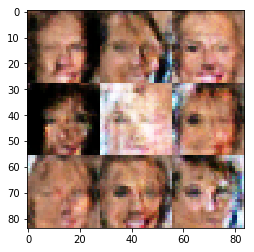

Epoch 1/1: Discriminator Loss: 0.944278 Generator Loss: 2.021510 Difference: 1.077232
Epoch 1/1: Discriminator Loss: 0.409927 Generator Loss: 2.500451 Difference: 2.090524
Epoch 1/1: Discriminator Loss: 0.435876 Generator Loss: 2.139386 Difference: 1.703510
Epoch 1/1: Discriminator Loss: 0.593453 Generator Loss: 1.513022 Difference: 0.919569
Epoch 1/1: Discriminator Loss: 0.694277 Generator Loss: 3.572369 Difference: 2.878092
Epoch 1/1: Discriminator Loss: 0.604424 Generator Loss: 1.935081 Difference: 1.330657
Tensor("generator_116/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_116/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_116/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_116/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_116/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_116/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


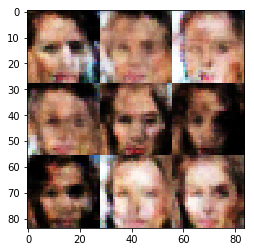

Epoch 1/1: Discriminator Loss: 0.906655 Generator Loss: 1.574065 Difference: 0.667410
Epoch 1/1: Discriminator Loss: 0.390077 Generator Loss: 3.313504 Difference: 2.923426
Epoch 1/1: Discriminator Loss: 0.716928 Generator Loss: 1.409968 Difference: 0.693040
Epoch 1/1: Discriminator Loss: 0.822252 Generator Loss: 0.928832 Difference: 0.106579
Epoch 1/1: Discriminator Loss: 1.155390 Generator Loss: 0.707452 Difference: -0.447938
Epoch 1/1: Discriminator Loss: 0.510546 Generator Loss: 3.560673 Difference: 3.050127
Tensor("generator_117/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_117/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_117/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_117/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_117/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_117/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


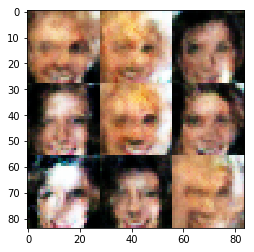

Epoch 1/1: Discriminator Loss: 0.550043 Generator Loss: 1.896623 Difference: 1.346580
Epoch 1/1: Discriminator Loss: 0.607292 Generator Loss: 1.807029 Difference: 1.199737
Epoch 1/1: Discriminator Loss: 0.510778 Generator Loss: 1.794410 Difference: 1.283631
Epoch 1/1: Discriminator Loss: 0.439409 Generator Loss: 3.312804 Difference: 2.873396
Epoch 1/1: Discriminator Loss: 0.560948 Generator Loss: 2.059500 Difference: 1.498553
Epoch 1/1: Discriminator Loss: 0.377787 Generator Loss: 3.700042 Difference: 3.322255
Tensor("generator_118/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_118/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_118/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_118/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_118/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_118/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


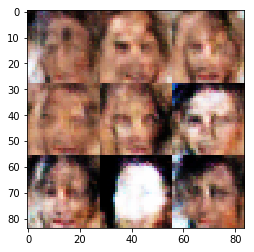

Epoch 1/1: Discriminator Loss: 0.484740 Generator Loss: 1.907214 Difference: 1.422474
Epoch 1/1: Discriminator Loss: 0.489907 Generator Loss: 1.527560 Difference: 1.037653
Epoch 1/1: Discriminator Loss: 0.636994 Generator Loss: 1.900115 Difference: 1.263121
Epoch 1/1: Discriminator Loss: 1.075008 Generator Loss: 0.493791 Difference: -0.581218
Epoch 1/1: Discriminator Loss: 0.575922 Generator Loss: 2.051199 Difference: 1.475277
Epoch 1/1: Discriminator Loss: 0.998758 Generator Loss: 0.602224 Difference: -0.396534
Tensor("generator_119/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_119/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_119/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_119/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_119/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_119/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


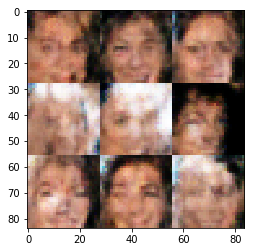

Epoch 1/1: Discriminator Loss: 0.409236 Generator Loss: 3.273628 Difference: 2.864392
Epoch 1/1: Discriminator Loss: 0.524100 Generator Loss: 2.029503 Difference: 1.505403
Epoch 1/1: Discriminator Loss: 0.589545 Generator Loss: 2.001110 Difference: 1.411565
Epoch 1/1: Discriminator Loss: 0.991986 Generator Loss: 0.960678 Difference: -0.031308
Epoch 1/1: Discriminator Loss: 0.566677 Generator Loss: 1.705118 Difference: 1.138440
Epoch 1/1: Discriminator Loss: 0.457353 Generator Loss: 4.891561 Difference: 4.434207
Tensor("generator_120/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_120/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_120/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_120/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_120/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_120/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


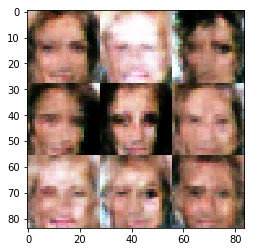

Epoch 1/1: Discriminator Loss: 0.421275 Generator Loss: 2.372782 Difference: 1.951506
Epoch 1/1: Discriminator Loss: 0.385810 Generator Loss: 4.505869 Difference: 4.120059
Epoch 1/1: Discriminator Loss: 0.913614 Generator Loss: 1.660134 Difference: 0.746520
Epoch 1/1: Discriminator Loss: 1.855488 Generator Loss: 0.261111 Difference: -1.594377
Epoch 1/1: Discriminator Loss: 0.362931 Generator Loss: 3.946709 Difference: 3.583778
Epoch 1/1: Discriminator Loss: 0.678097 Generator Loss: 1.427639 Difference: 0.749542
Tensor("generator_121/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_121/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_121/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_121/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_121/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_121/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


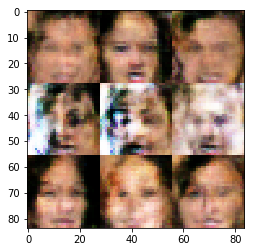

Epoch 1/1: Discriminator Loss: 0.513298 Generator Loss: 2.154381 Difference: 1.641083
Epoch 1/1: Discriminator Loss: 0.564871 Generator Loss: 1.902982 Difference: 1.338112
Epoch 1/1: Discriminator Loss: 0.466547 Generator Loss: 2.447206 Difference: 1.980659
Epoch 1/1: Discriminator Loss: 1.470715 Generator Loss: 1.098769 Difference: -0.371946
Epoch 1/1: Discriminator Loss: 0.497217 Generator Loss: 3.494267 Difference: 2.997049
Epoch 1/1: Discriminator Loss: 0.664952 Generator Loss: 5.839102 Difference: 5.174150
Tensor("generator_122/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_122/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_122/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_122/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_122/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_122/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


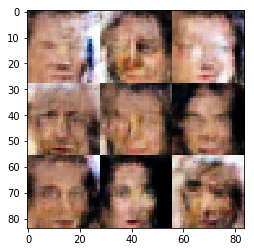

Epoch 1/1: Discriminator Loss: 0.590551 Generator Loss: 1.827887 Difference: 1.237336
Epoch 1/1: Discriminator Loss: 0.580551 Generator Loss: 4.536478 Difference: 3.955927
Epoch 1/1: Discriminator Loss: 0.850251 Generator Loss: 2.463806 Difference: 1.613555
Epoch 1/1: Discriminator Loss: 0.652475 Generator Loss: 1.508264 Difference: 0.855789
Epoch 1/1: Discriminator Loss: 0.463889 Generator Loss: 2.210491 Difference: 1.746603
Epoch 1/1: Discriminator Loss: 0.827264 Generator Loss: 1.189888 Difference: 0.362624
Tensor("generator_123/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_123/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_123/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_123/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_123/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_123/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


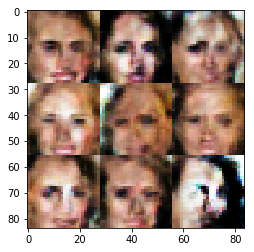

Epoch 1/1: Discriminator Loss: 1.272170 Generator Loss: 0.856997 Difference: -0.415173
Epoch 1/1: Discriminator Loss: 3.010638 Generator Loss: 0.082604 Difference: -2.928034
Epoch 1/1: Discriminator Loss: 0.661523 Generator Loss: 1.421194 Difference: 0.759671
Epoch 1/1: Discriminator Loss: 0.466304 Generator Loss: 3.577674 Difference: 3.111370
Epoch 1/1: Discriminator Loss: 0.538860 Generator Loss: 1.619782 Difference: 1.080922
Epoch 1/1: Discriminator Loss: 0.818152 Generator Loss: 1.282068 Difference: 0.463916
Tensor("generator_124/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_124/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_124/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_124/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_124/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_124/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


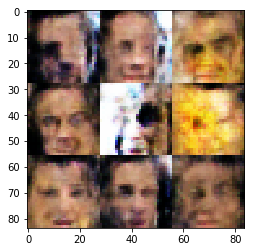

Epoch 1/1: Discriminator Loss: 0.891459 Generator Loss: 4.557644 Difference: 3.666185
Epoch 1/1: Discriminator Loss: 0.520509 Generator Loss: 4.200227 Difference: 3.679718
Epoch 1/1: Discriminator Loss: 1.751670 Generator Loss: 0.501587 Difference: -1.250083
Epoch 1/1: Discriminator Loss: 0.846277 Generator Loss: 1.461288 Difference: 0.615011
Epoch 1/1: Discriminator Loss: 0.496954 Generator Loss: 1.890830 Difference: 1.393876
Epoch 1/1: Discriminator Loss: 0.517828 Generator Loss: 2.821626 Difference: 2.303798
Tensor("generator_125/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_125/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_125/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_125/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_125/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_125/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


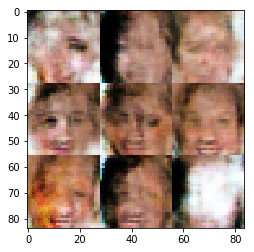

Epoch 1/1: Discriminator Loss: 1.244993 Generator Loss: 0.737762 Difference: -0.507231
Epoch 1/1: Discriminator Loss: 0.667298 Generator Loss: 2.526699 Difference: 1.859400
Epoch 1/1: Discriminator Loss: 0.681414 Generator Loss: 1.957592 Difference: 1.276179
Epoch 1/1: Discriminator Loss: 1.047298 Generator Loss: 1.687660 Difference: 0.640362
Epoch 1/1: Discriminator Loss: 0.523531 Generator Loss: 2.664453 Difference: 2.140922
Epoch 1/1: Discriminator Loss: 0.837304 Generator Loss: 1.199994 Difference: 0.362691
Tensor("generator_126/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_126/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_126/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_126/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_126/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_126/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


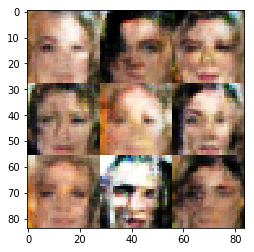

Epoch 1/1: Discriminator Loss: 0.743186 Generator Loss: 1.286075 Difference: 0.542889
Epoch 1/1: Discriminator Loss: 0.531202 Generator Loss: 2.218554 Difference: 1.687351
Epoch 1/1: Discriminator Loss: 0.670641 Generator Loss: 2.281780 Difference: 1.611139
Epoch 1/1: Discriminator Loss: 0.920945 Generator Loss: 0.962172 Difference: 0.041227
Epoch 1/1: Discriminator Loss: 2.669788 Generator Loss: 7.218344 Difference: 4.548556
Epoch 1/1: Discriminator Loss: 0.809565 Generator Loss: 0.791629 Difference: -0.017936
Tensor("generator_127/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_127/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_127/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_127/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_127/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_127/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


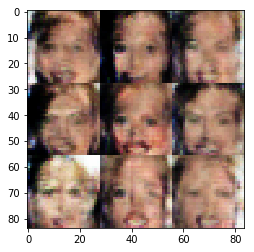

Epoch 1/1: Discriminator Loss: 1.229561 Generator Loss: 0.353740 Difference: -0.875821
Epoch 1/1: Discriminator Loss: 0.494532 Generator Loss: 2.152542 Difference: 1.658010
Epoch 1/1: Discriminator Loss: 0.907756 Generator Loss: 4.911590 Difference: 4.003834
Epoch 1/1: Discriminator Loss: 0.584923 Generator Loss: 4.359039 Difference: 3.774116
Epoch 1/1: Discriminator Loss: 0.733450 Generator Loss: 1.108120 Difference: 0.374670
Epoch 1/1: Discriminator Loss: 0.600496 Generator Loss: 3.352983 Difference: 2.752487
Tensor("generator_128/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_128/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_128/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_128/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_128/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_128/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


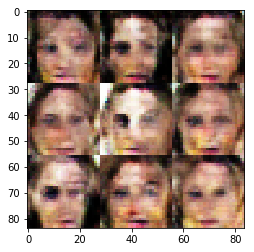

Epoch 1/1: Discriminator Loss: 1.177717 Generator Loss: 10.618992 Difference: 9.441275
Epoch 1/1: Discriminator Loss: 0.445222 Generator Loss: 1.665235 Difference: 1.220013
Epoch 1/1: Discriminator Loss: 0.353942 Generator Loss: 3.944083 Difference: 3.590141
Epoch 1/1: Discriminator Loss: 0.538752 Generator Loss: 2.236705 Difference: 1.697953
Epoch 1/1: Discriminator Loss: 0.869660 Generator Loss: 1.267698 Difference: 0.398038
Epoch 1/1: Discriminator Loss: 0.966536 Generator Loss: 1.202424 Difference: 0.235887
Tensor("generator_129/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_129/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_129/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_129/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_129/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_129/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


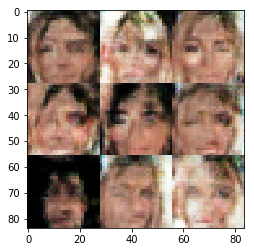

Epoch 1/1: Discriminator Loss: 0.572835 Generator Loss: 1.742407 Difference: 1.169572
Epoch 1/1: Discriminator Loss: 0.960512 Generator Loss: 1.418468 Difference: 0.457956
Epoch 1/1: Discriminator Loss: 1.192842 Generator Loss: 7.305478 Difference: 6.112636
Epoch 1/1: Discriminator Loss: 0.371315 Generator Loss: 4.356359 Difference: 3.985044
Epoch 1/1: Discriminator Loss: 0.697988 Generator Loss: 0.828997 Difference: 0.131009
Epoch 1/1: Discriminator Loss: 0.381882 Generator Loss: 4.479830 Difference: 4.097948
Tensor("generator_130/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_130/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_130/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_130/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_130/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_130/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


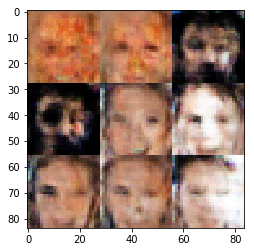

Epoch 1/1: Discriminator Loss: 0.442038 Generator Loss: 3.763296 Difference: 3.321258
Epoch 1/1: Discriminator Loss: 0.382463 Generator Loss: 3.303928 Difference: 2.921465
Epoch 1/1: Discriminator Loss: 0.583615 Generator Loss: 2.139346 Difference: 1.555731
Epoch 1/1: Discriminator Loss: 0.639776 Generator Loss: 4.255422 Difference: 3.615647
Epoch 1/1: Discriminator Loss: 0.700290 Generator Loss: 2.633514 Difference: 1.933223
Epoch 1/1: Discriminator Loss: 0.906435 Generator Loss: 2.599341 Difference: 1.692906
Tensor("generator_131/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_131/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_131/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_131/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_131/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_131/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


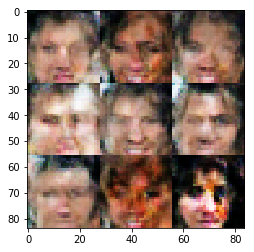

Epoch 1/1: Discriminator Loss: 0.981960 Generator Loss: 0.776908 Difference: -0.205052
Epoch 1/1: Discriminator Loss: 1.993051 Generator Loss: 1.145166 Difference: -0.847885
Epoch 1/1: Discriminator Loss: 0.554708 Generator Loss: 1.623705 Difference: 1.068997
Epoch 1/1: Discriminator Loss: 0.503080 Generator Loss: 1.559821 Difference: 1.056741
Epoch 1/1: Discriminator Loss: 0.754143 Generator Loss: 4.647342 Difference: 3.893199
Epoch 1/1: Discriminator Loss: 0.663965 Generator Loss: 1.921627 Difference: 1.257662
Tensor("generator_132/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_132/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_132/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_132/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_132/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_132/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


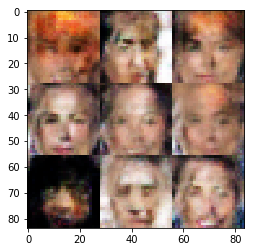

Epoch 1/1: Discriminator Loss: 0.446408 Generator Loss: 2.097425 Difference: 1.651016
Epoch 1/1: Discriminator Loss: 1.129101 Generator Loss: 0.352018 Difference: -0.777083
Epoch 1/1: Discriminator Loss: 0.754125 Generator Loss: 0.968395 Difference: 0.214269
Epoch 1/1: Discriminator Loss: 0.596518 Generator Loss: 1.434334 Difference: 0.837815
Epoch 1/1: Discriminator Loss: 0.406226 Generator Loss: 3.692786 Difference: 3.286561
Epoch 1/1: Discriminator Loss: 0.915008 Generator Loss: 0.783324 Difference: -0.131684
Tensor("generator_133/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_133/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_133/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_133/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_133/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_133/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


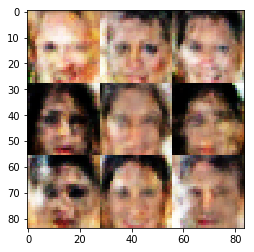

Epoch 1/1: Discriminator Loss: 0.382820 Generator Loss: 4.076469 Difference: 3.693649
Epoch 1/1: Discriminator Loss: 0.494924 Generator Loss: 3.390783 Difference: 2.895859
Epoch 1/1: Discriminator Loss: 0.506226 Generator Loss: 3.035872 Difference: 2.529645
Epoch 1/1: Discriminator Loss: 0.474641 Generator Loss: 2.034712 Difference: 1.560071
Epoch 1/1: Discriminator Loss: 0.472834 Generator Loss: 1.915430 Difference: 1.442597
Epoch 1/1: Discriminator Loss: 0.801674 Generator Loss: 1.016077 Difference: 0.214403
Tensor("generator_134/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_134/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_134/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_134/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_134/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_134/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


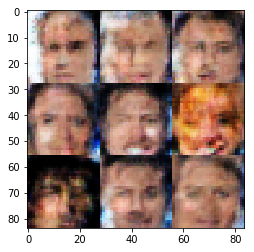

Epoch 1/1: Discriminator Loss: 0.606543 Generator Loss: 2.151387 Difference: 1.544844
Epoch 1/1: Discriminator Loss: 1.387502 Generator Loss: 0.904139 Difference: -0.483364
Epoch 1/1: Discriminator Loss: 1.571929 Generator Loss: 0.384798 Difference: -1.187131
Epoch 1/1: Discriminator Loss: 0.630266 Generator Loss: 2.383870 Difference: 1.753604
Epoch 1/1: Discriminator Loss: 0.758153 Generator Loss: 0.956968 Difference: 0.198815
Epoch 1/1: Discriminator Loss: 1.363739 Generator Loss: 0.476534 Difference: -0.887205
Tensor("generator_135/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_135/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_135/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_135/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_135/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_135/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


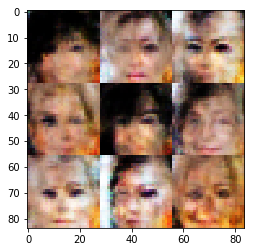

Epoch 1/1: Discriminator Loss: 0.626400 Generator Loss: 1.742343 Difference: 1.115943
Epoch 1/1: Discriminator Loss: 0.470751 Generator Loss: 3.604093 Difference: 3.133342
Epoch 1/1: Discriminator Loss: 1.129931 Generator Loss: 3.404068 Difference: 2.274136
Epoch 1/1: Discriminator Loss: 1.330952 Generator Loss: 1.829733 Difference: 0.498781
Epoch 1/1: Discriminator Loss: 0.866549 Generator Loss: 2.121253 Difference: 1.254703
Epoch 1/1: Discriminator Loss: 0.628454 Generator Loss: 1.409981 Difference: 0.781527
Tensor("generator_136/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_136/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_136/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_136/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_136/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_136/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


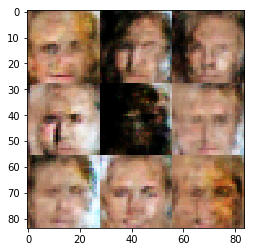

Epoch 1/1: Discriminator Loss: 0.784146 Generator Loss: 2.354384 Difference: 1.570238
Epoch 1/1: Discriminator Loss: 0.681795 Generator Loss: 0.652714 Difference: -0.029081
Epoch 1/1: Discriminator Loss: 0.453001 Generator Loss: 2.832968 Difference: 2.379967
Epoch 1/1: Discriminator Loss: 1.246762 Generator Loss: 5.474115 Difference: 4.227353
Epoch 1/1: Discriminator Loss: 0.418474 Generator Loss: 4.591494 Difference: 4.173019
Epoch 1/1: Discriminator Loss: 0.750820 Generator Loss: 0.711967 Difference: -0.038854
Tensor("generator_137/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_137/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_137/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_137/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_137/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_137/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


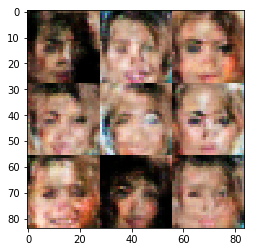

Epoch 1/1: Discriminator Loss: 0.975864 Generator Loss: 1.489992 Difference: 0.514128
Epoch 1/1: Discriminator Loss: 1.498113 Generator Loss: 1.498280 Difference: 0.000167
Epoch 1/1: Discriminator Loss: 0.408594 Generator Loss: 2.719377 Difference: 2.310782
Epoch 1/1: Discriminator Loss: 0.470726 Generator Loss: 4.974468 Difference: 4.503742
Epoch 1/1: Discriminator Loss: 0.805069 Generator Loss: 0.638953 Difference: -0.166116
Epoch 1/1: Discriminator Loss: 0.730769 Generator Loss: 5.999324 Difference: 5.268555
Tensor("generator_138/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_138/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_138/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_138/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_138/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_138/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


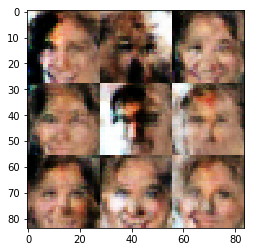

Epoch 1/1: Discriminator Loss: 0.951826 Generator Loss: 1.169456 Difference: 0.217630
Epoch 1/1: Discriminator Loss: 0.440253 Generator Loss: 3.872202 Difference: 3.431949
Epoch 1/1: Discriminator Loss: 0.388694 Generator Loss: 2.301349 Difference: 1.912656
Epoch 1/1: Discriminator Loss: 1.688075 Generator Loss: 0.842715 Difference: -0.845359
Epoch 1/1: Discriminator Loss: 1.090222 Generator Loss: 5.210728 Difference: 4.120505
Epoch 1/1: Discriminator Loss: 1.481668 Generator Loss: 0.445581 Difference: -1.036087
Tensor("generator_139/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_139/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_139/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_139/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_139/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_139/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


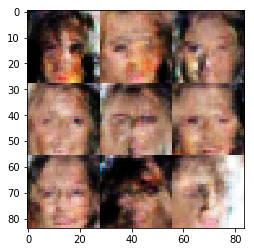

Epoch 1/1: Discriminator Loss: 1.202802 Generator Loss: 0.792140 Difference: -0.410662
Epoch 1/1: Discriminator Loss: 0.409906 Generator Loss: 2.772221 Difference: 2.362314
Epoch 1/1: Discriminator Loss: 0.527344 Generator Loss: 4.184865 Difference: 3.657520
Epoch 1/1: Discriminator Loss: 0.737405 Generator Loss: 0.525475 Difference: -0.211930
Epoch 1/1: Discriminator Loss: 0.353049 Generator Loss: 5.913822 Difference: 5.560773
Epoch 1/1: Discriminator Loss: 1.783202 Generator Loss: 0.263759 Difference: -1.519443
Tensor("generator_140/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_140/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_140/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_140/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_140/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_140/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


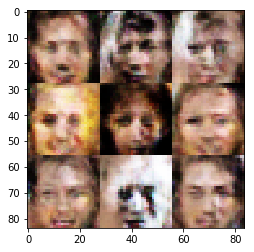

Epoch 1/1: Discriminator Loss: 0.724323 Generator Loss: 1.919483 Difference: 1.195159
Epoch 1/1: Discriminator Loss: 0.861280 Generator Loss: 5.222819 Difference: 4.361539
Epoch 1/1: Discriminator Loss: 0.631631 Generator Loss: 1.077927 Difference: 0.446296
Epoch 1/1: Discriminator Loss: 0.371506 Generator Loss: 4.514909 Difference: 4.143403
Epoch 1/1: Discriminator Loss: 0.800813 Generator Loss: 2.512075 Difference: 1.711261
Epoch 1/1: Discriminator Loss: 2.456556 Generator Loss: 0.186510 Difference: -2.270047
Tensor("generator_141/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_141/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_141/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_141/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_141/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_141/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


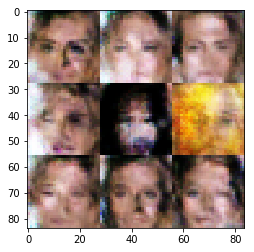

Epoch 1/1: Discriminator Loss: 0.467642 Generator Loss: 2.445931 Difference: 1.978289
Epoch 1/1: Discriminator Loss: 0.457197 Generator Loss: 2.881996 Difference: 2.424799
Epoch 1/1: Discriminator Loss: 0.455879 Generator Loss: 2.646361 Difference: 2.190482
Epoch 1/1: Discriminator Loss: 1.035445 Generator Loss: 1.161360 Difference: 0.125915
Epoch 1/1: Discriminator Loss: 0.555834 Generator Loss: 7.479566 Difference: 6.923731
Epoch 1/1: Discriminator Loss: 0.467287 Generator Loss: 3.637730 Difference: 3.170443
Tensor("generator_142/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_142/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_142/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_142/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_142/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_142/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


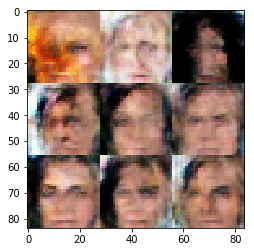

Epoch 1/1: Discriminator Loss: 1.092922 Generator Loss: 0.807664 Difference: -0.285258
Epoch 1/1: Discriminator Loss: 0.478549 Generator Loss: 2.609607 Difference: 2.131057
Epoch 1/1: Discriminator Loss: 1.416533 Generator Loss: 0.976375 Difference: -0.440158
Epoch 1/1: Discriminator Loss: 0.579234 Generator Loss: 2.652562 Difference: 2.073328
Epoch 1/1: Discriminator Loss: 0.646782 Generator Loss: 2.167196 Difference: 1.520414
Epoch 1/1: Discriminator Loss: 0.538257 Generator Loss: 1.839565 Difference: 1.301308
Tensor("generator_143/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_143/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_143/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_143/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_143/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_143/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


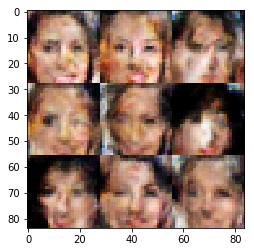

Epoch 1/1: Discriminator Loss: 1.941565 Generator Loss: 1.173142 Difference: -0.768422
Epoch 1/1: Discriminator Loss: 0.984429 Generator Loss: 1.258747 Difference: 0.274318
Epoch 1/1: Discriminator Loss: 0.742341 Generator Loss: 0.954284 Difference: 0.211943
Epoch 1/1: Discriminator Loss: 0.974606 Generator Loss: 3.691502 Difference: 2.716896
Epoch 1/1: Discriminator Loss: 0.934147 Generator Loss: 5.182588 Difference: 4.248441
Epoch 1/1: Discriminator Loss: 0.503201 Generator Loss: 1.672622 Difference: 1.169421
Tensor("generator_144/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_144/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_144/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_144/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_144/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_144/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


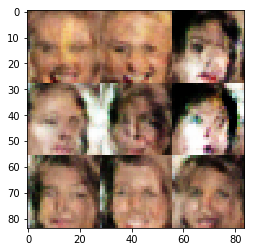

Epoch 1/1: Discriminator Loss: 0.452994 Generator Loss: 5.637585 Difference: 5.184590
Epoch 1/1: Discriminator Loss: 0.521383 Generator Loss: 3.429439 Difference: 2.908056
Epoch 1/1: Discriminator Loss: 0.491312 Generator Loss: 1.662632 Difference: 1.171320
Epoch 1/1: Discriminator Loss: 0.505570 Generator Loss: 1.746717 Difference: 1.241148
Epoch 1/1: Discriminator Loss: 0.545212 Generator Loss: 6.885585 Difference: 6.340373
Epoch 1/1: Discriminator Loss: 0.386983 Generator Loss: 3.742417 Difference: 3.355435
Tensor("generator_145/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_145/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_145/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_145/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_145/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_145/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


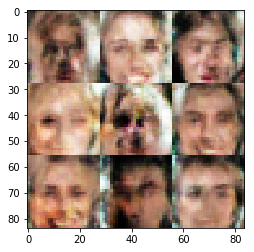

Epoch 1/1: Discriminator Loss: 0.863889 Generator Loss: 1.502741 Difference: 0.638852
Epoch 1/1: Discriminator Loss: 0.843988 Generator Loss: 2.041938 Difference: 1.197950
Epoch 1/1: Discriminator Loss: 0.829797 Generator Loss: 1.392685 Difference: 0.562888
Epoch 1/1: Discriminator Loss: 1.330932 Generator Loss: 4.591368 Difference: 3.260436
Epoch 1/1: Discriminator Loss: 0.423719 Generator Loss: 2.598382 Difference: 2.174663
Epoch 1/1: Discriminator Loss: 1.139851 Generator Loss: 0.512879 Difference: -0.626971
Tensor("generator_146/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_146/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_146/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_146/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_146/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_146/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


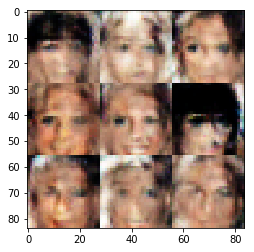

Epoch 1/1: Discriminator Loss: 0.549541 Generator Loss: 3.861795 Difference: 3.312254
Epoch 1/1: Discriminator Loss: 1.642337 Generator Loss: 0.636036 Difference: -1.006301
Epoch 1/1: Discriminator Loss: 0.439934 Generator Loss: 3.678999 Difference: 3.239066
Epoch 1/1: Discriminator Loss: 0.615656 Generator Loss: 1.902469 Difference: 1.286813
Epoch 1/1: Discriminator Loss: 0.510122 Generator Loss: 1.856688 Difference: 1.346566
Epoch 1/1: Discriminator Loss: 0.743512 Generator Loss: 1.355381 Difference: 0.611869
Tensor("generator_147/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_147/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_147/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_147/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_147/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_147/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


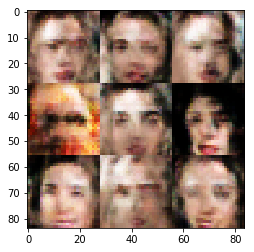

Epoch 1/1: Discriminator Loss: 1.238502 Generator Loss: 1.251795 Difference: 0.013293
Epoch 1/1: Discriminator Loss: 0.375585 Generator Loss: 5.283995 Difference: 4.908410
Epoch 1/1: Discriminator Loss: 1.620712 Generator Loss: 0.919772 Difference: -0.700940
Epoch 1/1: Discriminator Loss: 0.510169 Generator Loss: 1.820366 Difference: 1.310197
Epoch 1/1: Discriminator Loss: 0.458916 Generator Loss: 4.378361 Difference: 3.919445
Epoch 1/1: Discriminator Loss: 0.568668 Generator Loss: 1.978446 Difference: 1.409778
Tensor("generator_148/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_148/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_148/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_148/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_148/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_148/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


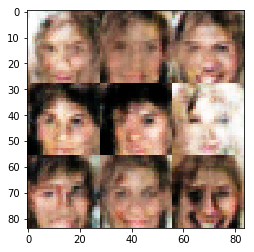

Epoch 1/1: Discriminator Loss: 0.537513 Generator Loss: 3.415193 Difference: 2.877680
Epoch 1/1: Discriminator Loss: 0.503210 Generator Loss: 2.274843 Difference: 1.771633
Epoch 1/1: Discriminator Loss: 2.358565 Generator Loss: 0.191841 Difference: -2.166724
Epoch 1/1: Discriminator Loss: 0.651017 Generator Loss: 4.933183 Difference: 4.282166
Epoch 1/1: Discriminator Loss: 0.361756 Generator Loss: 3.489293 Difference: 3.127536
Epoch 1/1: Discriminator Loss: 0.688570 Generator Loss: 2.625455 Difference: 1.936885
Tensor("generator_149/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_149/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_149/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_149/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_149/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_149/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


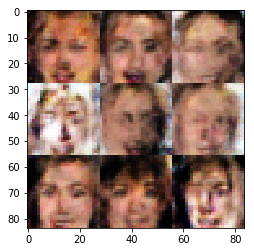

Epoch 1/1: Discriminator Loss: 0.471469 Generator Loss: 3.078664 Difference: 2.607196
Epoch 1/1: Discriminator Loss: 0.944494 Generator Loss: 1.253491 Difference: 0.308997
Epoch 1/1: Discriminator Loss: 1.050998 Generator Loss: 1.899088 Difference: 0.848089
Epoch 1/1: Discriminator Loss: 0.611641 Generator Loss: 1.488498 Difference: 0.876857
Epoch 1/1: Discriminator Loss: 0.617337 Generator Loss: 2.251398 Difference: 1.634060
Epoch 1/1: Discriminator Loss: 2.330231 Generator Loss: 6.761184 Difference: 4.430952
Tensor("generator_150/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_150/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_150/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_150/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_150/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_150/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


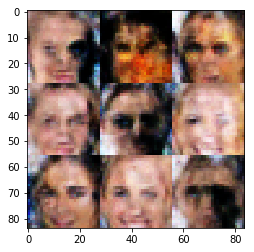

Epoch 1/1: Discriminator Loss: 0.369027 Generator Loss: 2.961649 Difference: 2.592622
Epoch 1/1: Discriminator Loss: 0.607093 Generator Loss: 2.041867 Difference: 1.434774
Epoch 1/1: Discriminator Loss: 0.762624 Generator Loss: 1.676355 Difference: 0.913731
Epoch 1/1: Discriminator Loss: 0.482749 Generator Loss: 1.631878 Difference: 1.149129
Epoch 1/1: Discriminator Loss: 0.499479 Generator Loss: 1.243141 Difference: 0.743662
Epoch 1/1: Discriminator Loss: 0.695384 Generator Loss: 2.178525 Difference: 1.483141
Tensor("generator_151/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_151/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_151/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_151/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_151/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_151/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


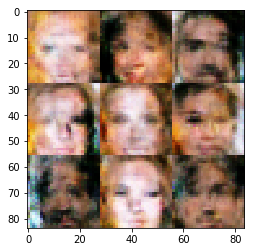

Epoch 1/1: Discriminator Loss: 0.530490 Generator Loss: 2.803551 Difference: 2.273061
Epoch 1/1: Discriminator Loss: 0.606290 Generator Loss: 2.567535 Difference: 1.961245
Epoch 1/1: Discriminator Loss: 0.408074 Generator Loss: 2.277781 Difference: 1.869706
Epoch 1/1: Discriminator Loss: 0.594806 Generator Loss: 1.059987 Difference: 0.465181
Epoch 1/1: Discriminator Loss: 2.203096 Generator Loss: 0.670507 Difference: -1.532588
Epoch 1/1: Discriminator Loss: 0.408724 Generator Loss: 8.889019 Difference: 8.480294
Tensor("generator_152/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_152/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_152/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_152/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_152/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_152/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


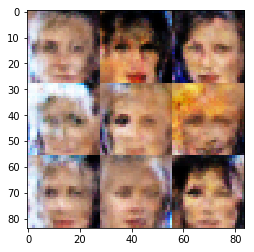

Epoch 1/1: Discriminator Loss: 0.618160 Generator Loss: 1.349280 Difference: 0.731119
Epoch 1/1: Discriminator Loss: 0.432073 Generator Loss: 4.132621 Difference: 3.700549
Epoch 1/1: Discriminator Loss: 0.553477 Generator Loss: 2.162169 Difference: 1.608693
Epoch 1/1: Discriminator Loss: 0.455215 Generator Loss: 3.560987 Difference: 3.105772
Epoch 1/1: Discriminator Loss: 0.437528 Generator Loss: 4.528573 Difference: 4.091045
Epoch 1/1: Discriminator Loss: 0.523030 Generator Loss: 3.288921 Difference: 2.765891
Tensor("generator_153/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_153/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_153/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_153/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_153/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_153/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


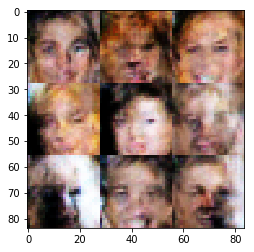

Epoch 1/1: Discriminator Loss: 0.754040 Generator Loss: 2.656467 Difference: 1.902426
Epoch 1/1: Discriminator Loss: 0.520648 Generator Loss: 2.152892 Difference: 1.632245
Epoch 1/1: Discriminator Loss: 0.457747 Generator Loss: 1.750860 Difference: 1.293113
Epoch 1/1: Discriminator Loss: 0.676952 Generator Loss: 5.679102 Difference: 5.002151
Epoch 1/1: Discriminator Loss: 0.342721 Generator Loss: 5.708605 Difference: 5.365883
Epoch 1/1: Discriminator Loss: 0.637266 Generator Loss: 3.148372 Difference: 2.511106
Tensor("generator_154/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_154/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_154/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_154/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_154/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_154/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


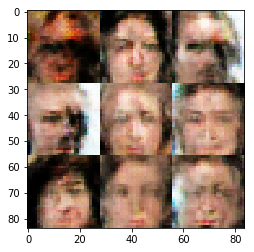

Epoch 1/1: Discriminator Loss: 0.511860 Generator Loss: 4.326080 Difference: 3.814220
Epoch 1/1: Discriminator Loss: 0.532858 Generator Loss: 5.336516 Difference: 4.803658
Epoch 1/1: Discriminator Loss: 0.398852 Generator Loss: 2.975689 Difference: 2.576837
Epoch 1/1: Discriminator Loss: 0.556809 Generator Loss: 5.966350 Difference: 5.409541
Epoch 1/1: Discriminator Loss: 0.808334 Generator Loss: 0.893626 Difference: 0.085292
Epoch 1/1: Discriminator Loss: 0.415150 Generator Loss: 4.155365 Difference: 3.740215
Tensor("generator_155/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_155/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_155/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_155/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_155/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_155/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


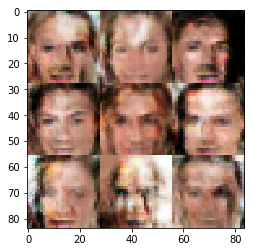

Epoch 1/1: Discriminator Loss: 0.490909 Generator Loss: 1.705782 Difference: 1.214872
Epoch 1/1: Discriminator Loss: 0.644279 Generator Loss: 5.103492 Difference: 4.459212
Epoch 1/1: Discriminator Loss: 0.590447 Generator Loss: 3.433643 Difference: 2.843196
Epoch 1/1: Discriminator Loss: 0.360199 Generator Loss: 3.661846 Difference: 3.301646
Epoch 1/1: Discriminator Loss: 0.566689 Generator Loss: 3.043432 Difference: 2.476743
Epoch 1/1: Discriminator Loss: 0.681231 Generator Loss: 2.035486 Difference: 1.354255
Tensor("generator_156/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_156/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_156/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_156/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_156/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_156/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


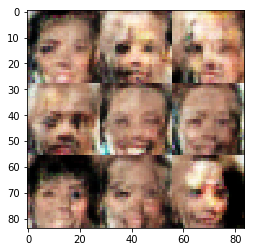

Epoch 1/1: Discriminator Loss: 0.620253 Generator Loss: 1.924221 Difference: 1.303968
Epoch 1/1: Discriminator Loss: 0.359756 Generator Loss: 3.584281 Difference: 3.224524
Epoch 1/1: Discriminator Loss: 0.651462 Generator Loss: 4.325817 Difference: 3.674355
Epoch 1/1: Discriminator Loss: 0.669379 Generator Loss: 4.461074 Difference: 3.791695
Epoch 1/1: Discriminator Loss: 0.410116 Generator Loss: 1.940240 Difference: 1.530124
Epoch 1/1: Discriminator Loss: 0.349938 Generator Loss: 3.131571 Difference: 2.781633
Tensor("generator_157/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_157/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_157/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_157/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_157/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_157/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


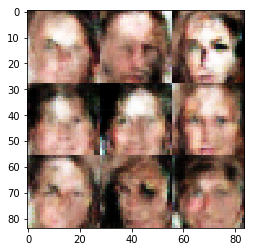

Epoch 1/1: Discriminator Loss: 1.214844 Generator Loss: 3.748565 Difference: 2.533721
Epoch 1/1: Discriminator Loss: 0.748408 Generator Loss: 4.667911 Difference: 3.919503
Epoch 1/1: Discriminator Loss: 0.428031 Generator Loss: 2.645521 Difference: 2.217490
Epoch 1/1: Discriminator Loss: 0.382095 Generator Loss: 3.668073 Difference: 3.285978
Epoch 1/1: Discriminator Loss: 1.305258 Generator Loss: 1.177520 Difference: -0.127738
Epoch 1/1: Discriminator Loss: 0.380544 Generator Loss: 4.269773 Difference: 3.889229
Tensor("generator_158/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_158/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_158/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_158/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_158/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_158/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


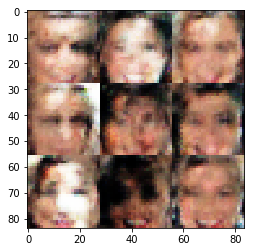

Epoch 1/1: Discriminator Loss: 0.644101 Generator Loss: 1.811242 Difference: 1.167142
Epoch 1/1: Discriminator Loss: 0.772268 Generator Loss: 1.319681 Difference: 0.547413
Epoch 1/1: Discriminator Loss: 0.361503 Generator Loss: 3.745003 Difference: 3.383500
Epoch 1/1: Discriminator Loss: 1.041280 Generator Loss: 5.422137 Difference: 4.380857
Epoch 1/1: Discriminator Loss: 3.728243 Generator Loss: 7.955194 Difference: 4.226951
Epoch 1/1: Discriminator Loss: 0.810721 Generator Loss: 1.166270 Difference: 0.355550
Tensor("generator_159/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_159/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_159/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_159/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_159/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_159/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


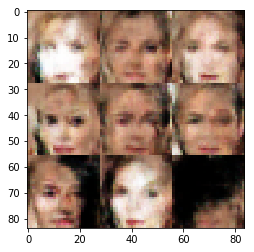

Epoch 1/1: Discriminator Loss: 1.194759 Generator Loss: 1.032736 Difference: -0.162023
Epoch 1/1: Discriminator Loss: 0.403183 Generator Loss: 3.981862 Difference: 3.578679
Epoch 1/1: Discriminator Loss: 0.585262 Generator Loss: 1.061487 Difference: 0.476225
Epoch 1/1: Discriminator Loss: 0.343194 Generator Loss: 3.629335 Difference: 3.286141
Epoch 1/1: Discriminator Loss: 0.509323 Generator Loss: 2.324967 Difference: 1.815645
Epoch 1/1: Discriminator Loss: 0.400259 Generator Loss: 3.172307 Difference: 2.772049
Tensor("generator_160/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_160/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_160/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_160/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_160/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_160/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


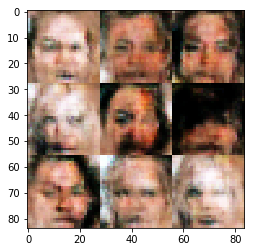

Epoch 1/1: Discriminator Loss: 0.485536 Generator Loss: 2.684064 Difference: 2.198528
Epoch 1/1: Discriminator Loss: 0.562489 Generator Loss: 2.304583 Difference: 1.742093
Epoch 1/1: Discriminator Loss: 0.381357 Generator Loss: 5.335683 Difference: 4.954326
Epoch 1/1: Discriminator Loss: 0.821610 Generator Loss: 1.395978 Difference: 0.574368
Epoch 1/1: Discriminator Loss: 0.374325 Generator Loss: 6.324882 Difference: 5.950557
Epoch 1/1: Discriminator Loss: 0.736636 Generator Loss: 2.162279 Difference: 1.425644
Tensor("generator_161/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_161/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_161/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_161/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_161/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_161/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


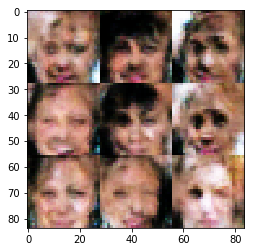

Epoch 1/1: Discriminator Loss: 0.489921 Generator Loss: 6.650557 Difference: 6.160635
Epoch 1/1: Discriminator Loss: 0.582650 Generator Loss: 4.968624 Difference: 4.385974
Epoch 1/1: Discriminator Loss: 1.265472 Generator Loss: 1.177425 Difference: -0.088047
Epoch 1/1: Discriminator Loss: 0.666693 Generator Loss: 2.165303 Difference: 1.498610
Epoch 1/1: Discriminator Loss: 0.364553 Generator Loss: 6.065713 Difference: 5.701160
Epoch 1/1: Discriminator Loss: 0.518909 Generator Loss: 2.110060 Difference: 1.591151
Tensor("generator_162/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_162/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_162/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_162/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_162/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_162/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


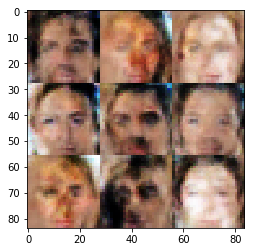

Epoch 1/1: Discriminator Loss: 0.464008 Generator Loss: 2.436506 Difference: 1.972498
Epoch 1/1: Discriminator Loss: 0.545616 Generator Loss: 4.679904 Difference: 4.134288
Epoch 1/1: Discriminator Loss: 0.483301 Generator Loss: 3.210804 Difference: 2.727503
Epoch 1/1: Discriminator Loss: 0.424452 Generator Loss: 0.950244 Difference: 0.525792
Epoch 1/1: Discriminator Loss: 0.603674 Generator Loss: 2.300070 Difference: 1.696396
Epoch 1/1: Discriminator Loss: 0.709019 Generator Loss: 2.669010 Difference: 1.959991
Tensor("generator_163/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_163/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_163/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_163/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_163/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_163/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


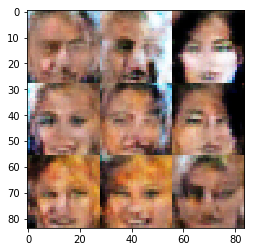

Epoch 1/1: Discriminator Loss: 1.636409 Generator Loss: 6.001829 Difference: 4.365420
Epoch 1/1: Discriminator Loss: 0.984025 Generator Loss: 7.147120 Difference: 6.163096
Epoch 1/1: Discriminator Loss: 0.511976 Generator Loss: 2.961351 Difference: 2.449374
Epoch 1/1: Discriminator Loss: 0.683417 Generator Loss: 1.697871 Difference: 1.014454
Epoch 1/1: Discriminator Loss: 0.438144 Generator Loss: 1.865618 Difference: 1.427474
Epoch 1/1: Discriminator Loss: 0.520337 Generator Loss: 3.248028 Difference: 2.727691
Tensor("generator_164/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_164/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_164/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_164/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_164/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_164/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


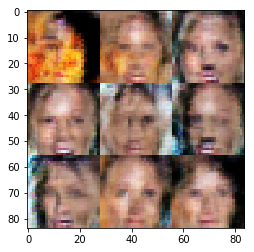

Epoch 1/1: Discriminator Loss: 0.752887 Generator Loss: 2.621985 Difference: 1.869099
Epoch 1/1: Discriminator Loss: 1.290991 Generator Loss: 0.992136 Difference: -0.298855
Epoch 1/1: Discriminator Loss: 0.433935 Generator Loss: 5.188731 Difference: 4.754796
Epoch 1/1: Discriminator Loss: 0.885150 Generator Loss: 1.116515 Difference: 0.231365
Epoch 1/1: Discriminator Loss: 0.811931 Generator Loss: 5.235654 Difference: 4.423723
Epoch 1/1: Discriminator Loss: 0.400530 Generator Loss: 3.877196 Difference: 3.476666
Tensor("generator_165/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_165/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_165/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_165/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_165/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_165/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


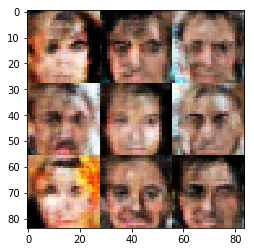

Epoch 1/1: Discriminator Loss: 0.969429 Generator Loss: 2.272249 Difference: 1.302820
Epoch 1/1: Discriminator Loss: 0.535239 Generator Loss: 3.942771 Difference: 3.407532
Epoch 1/1: Discriminator Loss: 0.394827 Generator Loss: 4.062931 Difference: 3.668103
Epoch 1/1: Discriminator Loss: 0.372416 Generator Loss: 6.349238 Difference: 5.976821
Epoch 1/1: Discriminator Loss: 1.544221 Generator Loss: 0.843487 Difference: -0.700734
Epoch 1/1: Discriminator Loss: 2.160385 Generator Loss: 1.287012 Difference: -0.873373
Tensor("generator_166/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_166/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_166/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_166/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_166/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_166/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


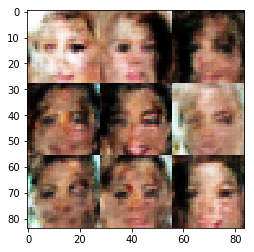

Epoch 1/1: Discriminator Loss: 0.375051 Generator Loss: 3.578876 Difference: 3.203825
Epoch 1/1: Discriminator Loss: 0.362890 Generator Loss: 6.180908 Difference: 5.818018
Epoch 1/1: Discriminator Loss: 0.762284 Generator Loss: 4.723417 Difference: 3.961133
Epoch 1/1: Discriminator Loss: 0.545128 Generator Loss: 2.269575 Difference: 1.724448
Epoch 1/1: Discriminator Loss: 0.498741 Generator Loss: 0.824972 Difference: 0.326231
Epoch 1/1: Discriminator Loss: 0.367692 Generator Loss: 3.191563 Difference: 2.823872
Tensor("generator_167/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_167/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_167/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_167/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_167/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_167/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


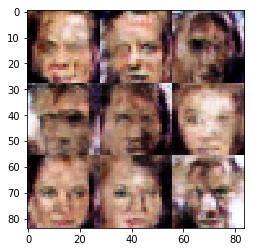

Epoch 1/1: Discriminator Loss: 3.189551 Generator Loss: 0.185860 Difference: -3.003690
Epoch 1/1: Discriminator Loss: 1.407552 Generator Loss: 1.071082 Difference: -0.336471
Epoch 1/1: Discriminator Loss: 1.500239 Generator Loss: 6.550820 Difference: 5.050581
Epoch 1/1: Discriminator Loss: 0.417783 Generator Loss: 3.302638 Difference: 2.884855
Epoch 1/1: Discriminator Loss: 0.796873 Generator Loss: 2.445104 Difference: 1.648232
Epoch 1/1: Discriminator Loss: 0.589809 Generator Loss: 3.877874 Difference: 3.288065
Tensor("generator_168/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_168/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_168/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_168/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_168/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_168/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


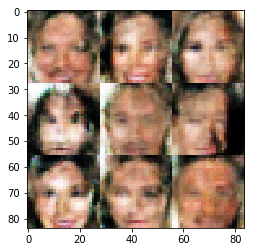

Epoch 1/1: Discriminator Loss: 0.441068 Generator Loss: 5.176022 Difference: 4.734954
Epoch 1/1: Discriminator Loss: 0.751573 Generator Loss: 1.795127 Difference: 1.043554
Epoch 1/1: Discriminator Loss: 0.531058 Generator Loss: 1.159060 Difference: 0.628002
Epoch 1/1: Discriminator Loss: 0.546390 Generator Loss: 4.271524 Difference: 3.725135
Epoch 1/1: Discriminator Loss: 0.393680 Generator Loss: 4.038417 Difference: 3.644737
Epoch 1/1: Discriminator Loss: 0.861663 Generator Loss: 1.455637 Difference: 0.593973
Tensor("generator_169/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_169/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_169/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_169/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_169/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_169/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


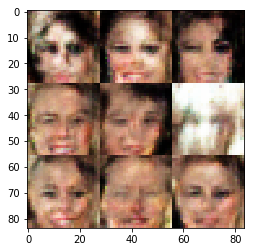

Epoch 1/1: Discriminator Loss: 0.678364 Generator Loss: 1.440638 Difference: 0.762274
Epoch 1/1: Discriminator Loss: 0.538739 Generator Loss: 1.035913 Difference: 0.497174
Epoch 1/1: Discriminator Loss: 0.557178 Generator Loss: 1.444696 Difference: 0.887519
Epoch 1/1: Discriminator Loss: 0.539096 Generator Loss: 2.430420 Difference: 1.891325
Epoch 1/1: Discriminator Loss: 0.637229 Generator Loss: 1.217160 Difference: 0.579931
Epoch 1/1: Discriminator Loss: 0.590152 Generator Loss: 2.605424 Difference: 2.015272
Tensor("generator_170/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_170/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_170/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_170/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_170/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_170/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


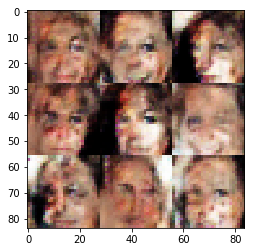

Epoch 1/1: Discriminator Loss: 0.530762 Generator Loss: 2.169534 Difference: 1.638772
Epoch 1/1: Discriminator Loss: 0.594772 Generator Loss: 4.079399 Difference: 3.484627
Epoch 1/1: Discriminator Loss: 1.043141 Generator Loss: 0.808580 Difference: -0.234561
Epoch 1/1: Discriminator Loss: 0.456006 Generator Loss: 2.341041 Difference: 1.885035
Epoch 1/1: Discriminator Loss: 0.423419 Generator Loss: 4.373587 Difference: 3.950167
Epoch 1/1: Discriminator Loss: 1.487526 Generator Loss: 0.492484 Difference: -0.995041
Tensor("generator_171/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_171/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_171/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_171/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_171/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_171/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


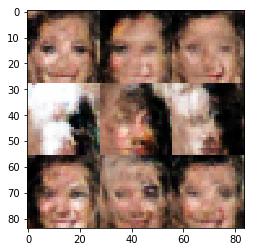

Epoch 1/1: Discriminator Loss: 0.728189 Generator Loss: 3.025224 Difference: 2.297035
Epoch 1/1: Discriminator Loss: 0.471926 Generator Loss: 2.609591 Difference: 2.137664
Epoch 1/1: Discriminator Loss: 0.520140 Generator Loss: 2.650577 Difference: 2.130438
Epoch 1/1: Discriminator Loss: 2.014531 Generator Loss: 9.182276 Difference: 7.167745
Epoch 1/1: Discriminator Loss: 1.040790 Generator Loss: 0.451895 Difference: -0.588895
Epoch 1/1: Discriminator Loss: 0.451426 Generator Loss: 1.558285 Difference: 1.106859
Tensor("generator_172/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_172/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_172/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_172/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_172/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_172/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


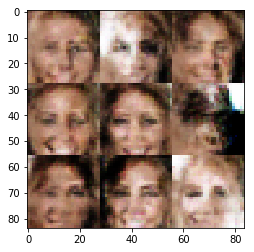

Epoch 1/1: Discriminator Loss: 1.112637 Generator Loss: 5.433376 Difference: 4.320739
Epoch 1/1: Discriminator Loss: 0.642142 Generator Loss: 1.217042 Difference: 0.574900
Epoch 1/1: Discriminator Loss: 0.490299 Generator Loss: 2.406179 Difference: 1.915880
Epoch 1/1: Discriminator Loss: 0.649158 Generator Loss: 1.148007 Difference: 0.498849
Epoch 1/1: Discriminator Loss: 0.513113 Generator Loss: 2.214626 Difference: 1.701513
Epoch 1/1: Discriminator Loss: 0.355448 Generator Loss: 6.932397 Difference: 6.576949
Tensor("generator_173/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_173/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_173/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_173/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_173/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_173/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


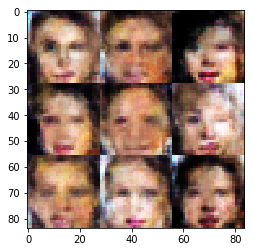

Epoch 1/1: Discriminator Loss: 0.395123 Generator Loss: 3.101268 Difference: 2.706146
Epoch 1/1: Discriminator Loss: 0.388160 Generator Loss: 4.117714 Difference: 3.729554
Epoch 1/1: Discriminator Loss: 2.551085 Generator Loss: 8.555679 Difference: 6.004594
Epoch 1/1: Discriminator Loss: 0.420602 Generator Loss: 5.280178 Difference: 4.859576
Epoch 1/1: Discriminator Loss: 0.526488 Generator Loss: 4.629231 Difference: 4.102743
Epoch 1/1: Discriminator Loss: 0.408771 Generator Loss: 3.380188 Difference: 2.971417
Tensor("generator_174/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_174/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_174/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_174/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_174/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_174/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


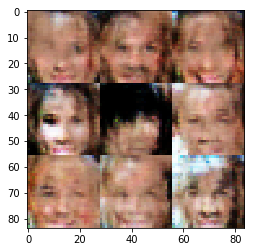

Epoch 1/1: Discriminator Loss: 0.580647 Generator Loss: 5.302065 Difference: 4.721418
Epoch 1/1: Discriminator Loss: 0.524483 Generator Loss: 2.184605 Difference: 1.660122
Epoch 1/1: Discriminator Loss: 0.836137 Generator Loss: 8.580399 Difference: 7.744262
Epoch 1/1: Discriminator Loss: 0.488353 Generator Loss: 3.730454 Difference: 3.242101
Epoch 1/1: Discriminator Loss: 0.589394 Generator Loss: 2.919926 Difference: 2.330531
Epoch 1/1: Discriminator Loss: 0.603220 Generator Loss: 3.402955 Difference: 2.799736
Tensor("generator_175/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_175/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_175/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_175/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_175/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_175/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


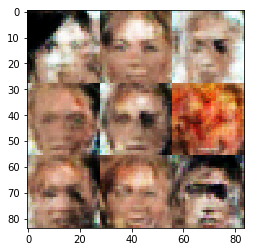

Epoch 1/1: Discriminator Loss: 1.515936 Generator Loss: 1.232672 Difference: -0.283264
Epoch 1/1: Discriminator Loss: 0.623672 Generator Loss: 1.401512 Difference: 0.777839
Epoch 1/1: Discriminator Loss: 1.428498 Generator Loss: 7.554223 Difference: 6.125725
Epoch 1/1: Discriminator Loss: 0.373475 Generator Loss: 6.070662 Difference: 5.697186
Epoch 1/1: Discriminator Loss: 0.691516 Generator Loss: 2.130147 Difference: 1.438631
Epoch 1/1: Discriminator Loss: 0.440890 Generator Loss: 1.538592 Difference: 1.097703
Tensor("generator_176/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_176/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_176/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_176/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_176/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_176/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


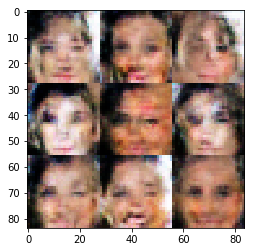

Epoch 1/1: Discriminator Loss: 0.447767 Generator Loss: 3.135340 Difference: 2.687573
Epoch 1/1: Discriminator Loss: 1.445595 Generator Loss: 0.815635 Difference: -0.629960
Epoch 1/1: Discriminator Loss: 0.437596 Generator Loss: 5.185709 Difference: 4.748113
Epoch 1/1: Discriminator Loss: 1.028619 Generator Loss: 0.564318 Difference: -0.464300
Epoch 1/1: Discriminator Loss: 0.389704 Generator Loss: 4.847938 Difference: 4.458234
Epoch 1/1: Discriminator Loss: 0.551319 Generator Loss: 1.102850 Difference: 0.551531
Tensor("generator_177/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_177/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_177/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_177/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_177/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_177/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


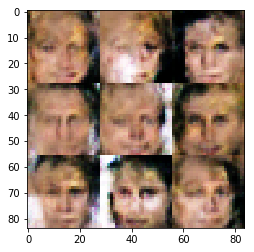

Epoch 1/1: Discriminator Loss: 0.697102 Generator Loss: 3.363862 Difference: 2.666759
Epoch 1/1: Discriminator Loss: 2.371991 Generator Loss: 0.382177 Difference: -1.989813
Epoch 1/1: Discriminator Loss: 0.415818 Generator Loss: 4.018592 Difference: 3.602774
Epoch 1/1: Discriminator Loss: 0.350693 Generator Loss: 4.103250 Difference: 3.752557
Epoch 1/1: Discriminator Loss: 0.436011 Generator Loss: 3.151411 Difference: 2.715400
Epoch 1/1: Discriminator Loss: 0.490613 Generator Loss: 3.072813 Difference: 2.582200
Tensor("generator_178/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_178/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_178/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_178/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_178/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_178/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


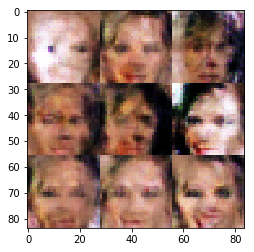

Epoch 1/1: Discriminator Loss: 0.415873 Generator Loss: 3.430365 Difference: 3.014492
Epoch 1/1: Discriminator Loss: 2.473870 Generator Loss: 1.384491 Difference: -1.089379
Epoch 1/1: Discriminator Loss: 0.368231 Generator Loss: 2.671991 Difference: 2.303759
Epoch 1/1: Discriminator Loss: 0.394371 Generator Loss: 3.106486 Difference: 2.712115
Epoch 1/1: Discriminator Loss: 0.390382 Generator Loss: 6.339020 Difference: 5.948638
Epoch 1/1: Discriminator Loss: 0.453073 Generator Loss: 6.020851 Difference: 5.567778
Tensor("generator_179/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_179/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_179/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_179/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_179/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_179/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


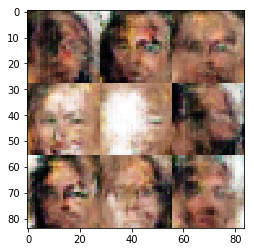

Epoch 1/1: Discriminator Loss: 0.862827 Generator Loss: 2.108997 Difference: 1.246170
Epoch 1/1: Discriminator Loss: 0.569577 Generator Loss: 2.323057 Difference: 1.753480
Epoch 1/1: Discriminator Loss: 0.518618 Generator Loss: 3.931713 Difference: 3.413095
Epoch 1/1: Discriminator Loss: 0.487381 Generator Loss: 5.617859 Difference: 5.130477
Epoch 1/1: Discriminator Loss: 0.489821 Generator Loss: 3.068060 Difference: 2.578239
Epoch 1/1: Discriminator Loss: 0.819969 Generator Loss: 0.651600 Difference: -0.168370
Tensor("generator_180/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_180/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_180/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_180/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_180/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_180/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


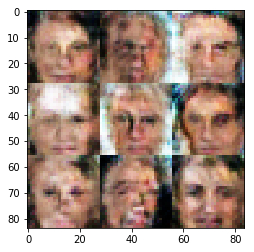

Epoch 1/1: Discriminator Loss: 1.108170 Generator Loss: 1.217028 Difference: 0.108858
Epoch 1/1: Discriminator Loss: 0.391269 Generator Loss: 2.715734 Difference: 2.324465
Epoch 1/1: Discriminator Loss: 0.350755 Generator Loss: 3.991802 Difference: 3.641047
Epoch 1/1: Discriminator Loss: 0.889264 Generator Loss: 0.640857 Difference: -0.248408
Epoch 1/1: Discriminator Loss: 0.476433 Generator Loss: 7.235381 Difference: 6.758947
Epoch 1/1: Discriminator Loss: 0.506944 Generator Loss: 2.508415 Difference: 2.001472
Tensor("generator_181/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_181/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_181/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_181/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_181/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_181/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


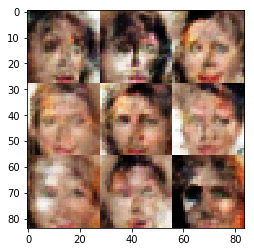

Epoch 1/1: Discriminator Loss: 0.749071 Generator Loss: 3.584526 Difference: 2.835455
Epoch 1/1: Discriminator Loss: 0.404988 Generator Loss: 5.351236 Difference: 4.946248
Epoch 1/1: Discriminator Loss: 0.822886 Generator Loss: 1.382328 Difference: 0.559442
Epoch 1/1: Discriminator Loss: 0.540418 Generator Loss: 1.207715 Difference: 0.667297
Epoch 1/1: Discriminator Loss: 0.452497 Generator Loss: 2.927397 Difference: 2.474901
Epoch 1/1: Discriminator Loss: 0.377618 Generator Loss: 3.921793 Difference: 3.544175
Tensor("generator_182/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_182/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_182/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_182/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_182/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_182/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


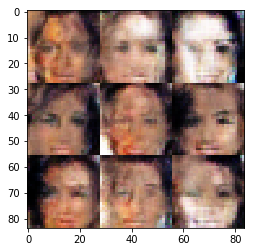

Epoch 1/1: Discriminator Loss: 0.452076 Generator Loss: 4.647745 Difference: 4.195669
Epoch 1/1: Discriminator Loss: 0.439169 Generator Loss: 2.433908 Difference: 1.994738
Epoch 1/1: Discriminator Loss: 0.488197 Generator Loss: 2.662478 Difference: 2.174282
Epoch 1/1: Discriminator Loss: 0.890811 Generator Loss: 3.206770 Difference: 2.315959
Epoch 1/1: Discriminator Loss: 0.388772 Generator Loss: 5.158955 Difference: 4.770183
Epoch 1/1: Discriminator Loss: 0.551082 Generator Loss: 2.835824 Difference: 2.284742
Tensor("generator_183/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_183/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_183/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_183/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_183/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_183/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


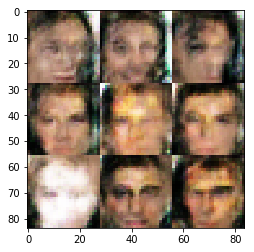

Epoch 1/1: Discriminator Loss: 0.629873 Generator Loss: 2.165900 Difference: 1.536028
Epoch 1/1: Discriminator Loss: 0.749541 Generator Loss: 1.384802 Difference: 0.635262
Epoch 1/1: Discriminator Loss: 0.538296 Generator Loss: 4.254641 Difference: 3.716345
Epoch 1/1: Discriminator Loss: 0.453679 Generator Loss: 7.217662 Difference: 6.763983
Epoch 1/1: Discriminator Loss: 0.395940 Generator Loss: 2.860227 Difference: 2.464287
Epoch 1/1: Discriminator Loss: 0.456408 Generator Loss: 5.951409 Difference: 5.495002
Tensor("generator_184/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_184/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_184/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_184/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_184/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_184/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


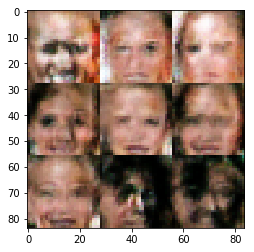

Epoch 1/1: Discriminator Loss: 0.539016 Generator Loss: 2.405838 Difference: 1.866822
Epoch 1/1: Discriminator Loss: 0.415087 Generator Loss: 5.296728 Difference: 4.881641
Epoch 1/1: Discriminator Loss: 0.693820 Generator Loss: 1.839647 Difference: 1.145827
Epoch 1/1: Discriminator Loss: 0.516162 Generator Loss: 2.426075 Difference: 1.909913
Epoch 1/1: Discriminator Loss: 1.070364 Generator Loss: 1.899319 Difference: 0.828955
Epoch 1/1: Discriminator Loss: 0.425903 Generator Loss: 3.126210 Difference: 2.700308
Tensor("generator_185/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_185/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_185/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_185/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_185/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_185/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


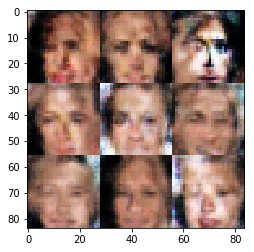

Epoch 1/1: Discriminator Loss: 0.385358 Generator Loss: 2.458899 Difference: 2.073540
Epoch 1/1: Discriminator Loss: 1.169973 Generator Loss: 1.551807 Difference: 0.381835
Epoch 1/1: Discriminator Loss: 0.612306 Generator Loss: 1.376554 Difference: 0.764247
Epoch 1/1: Discriminator Loss: 1.012482 Generator Loss: 0.914257 Difference: -0.098226
Epoch 1/1: Discriminator Loss: 1.133802 Generator Loss: 0.634980 Difference: -0.498822
Epoch 1/1: Discriminator Loss: 0.532022 Generator Loss: 4.612888 Difference: 4.080866
Tensor("generator_186/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_186/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_186/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_186/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_186/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_186/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


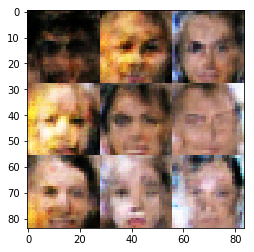

Epoch 1/1: Discriminator Loss: 0.822440 Generator Loss: 2.305679 Difference: 1.483239
Epoch 1/1: Discriminator Loss: 1.599414 Generator Loss: 0.809696 Difference: -0.789718
Epoch 1/1: Discriminator Loss: 0.608846 Generator Loss: 1.077240 Difference: 0.468394
Epoch 1/1: Discriminator Loss: 0.391659 Generator Loss: 2.673167 Difference: 2.281508
Epoch 1/1: Discriminator Loss: 0.820283 Generator Loss: 6.162843 Difference: 5.342559
Epoch 1/1: Discriminator Loss: 0.441029 Generator Loss: 3.065298 Difference: 2.624269
Tensor("generator_187/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_187/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_187/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_187/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_187/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_187/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


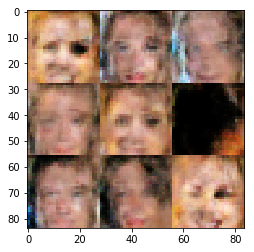

Epoch 1/1: Discriminator Loss: 0.439537 Generator Loss: 2.450683 Difference: 2.011147
Epoch 1/1: Discriminator Loss: 0.449071 Generator Loss: 3.043401 Difference: 2.594329
Epoch 1/1: Discriminator Loss: 0.598295 Generator Loss: 3.657526 Difference: 3.059230
Epoch 1/1: Discriminator Loss: 0.605211 Generator Loss: 1.132991 Difference: 0.527780
Epoch 1/1: Discriminator Loss: 0.506564 Generator Loss: 0.810820 Difference: 0.304256
Epoch 1/1: Discriminator Loss: 0.657137 Generator Loss: 3.486037 Difference: 2.828901
Tensor("generator_188/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_188/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_188/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_188/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_188/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_188/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


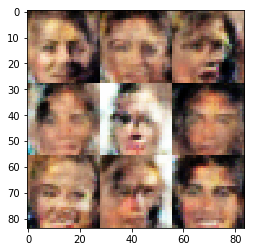

Epoch 1/1: Discriminator Loss: 0.826411 Generator Loss: 1.250820 Difference: 0.424409
Epoch 1/1: Discriminator Loss: 0.538479 Generator Loss: 1.072916 Difference: 0.534437
Epoch 1/1: Discriminator Loss: 0.463622 Generator Loss: 2.690233 Difference: 2.226611
Epoch 1/1: Discriminator Loss: 0.515483 Generator Loss: 2.204804 Difference: 1.689321
Epoch 1/1: Discriminator Loss: 0.578392 Generator Loss: 2.605156 Difference: 2.026765
Epoch 1/1: Discriminator Loss: 0.484390 Generator Loss: 2.972687 Difference: 2.488297
Tensor("generator_189/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_189/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_189/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_189/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_189/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_189/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


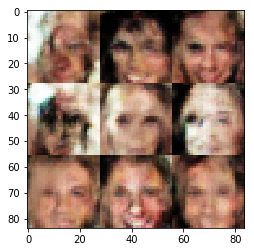

Epoch 1/1: Discriminator Loss: 1.059383 Generator Loss: 1.851702 Difference: 0.792319
Epoch 1/1: Discriminator Loss: 0.683587 Generator Loss: 1.577844 Difference: 0.894257
Epoch 1/1: Discriminator Loss: 0.421663 Generator Loss: 3.523230 Difference: 3.101567
Epoch 1/1: Discriminator Loss: 1.167786 Generator Loss: 7.501237 Difference: 6.333451
Epoch 1/1: Discriminator Loss: 0.401788 Generator Loss: 2.938802 Difference: 2.537013
Epoch 1/1: Discriminator Loss: 0.635563 Generator Loss: 4.988497 Difference: 4.352934
Tensor("generator_190/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_190/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_190/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_190/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_190/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_190/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


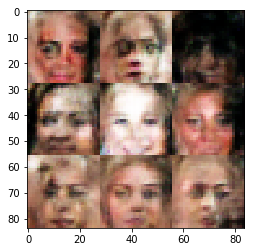

Epoch 1/1: Discriminator Loss: 0.389258 Generator Loss: 4.477414 Difference: 4.088156
Epoch 1/1: Discriminator Loss: 1.274992 Generator Loss: 6.243780 Difference: 4.968789
Epoch 1/1: Discriminator Loss: 1.640639 Generator Loss: 5.030864 Difference: 3.390225
Epoch 1/1: Discriminator Loss: 0.625501 Generator Loss: 2.237435 Difference: 1.611934
Epoch 1/1: Discriminator Loss: 0.810387 Generator Loss: 5.605688 Difference: 4.795300
Epoch 1/1: Discriminator Loss: 0.540591 Generator Loss: 2.707338 Difference: 2.166748
Tensor("generator_191/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_191/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_191/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_191/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_191/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_191/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


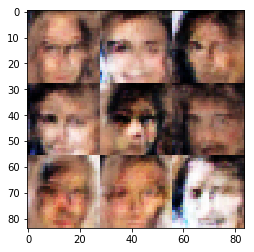

Epoch 1/1: Discriminator Loss: 0.837690 Generator Loss: 1.319606 Difference: 0.481916
Epoch 1/1: Discriminator Loss: 0.893818 Generator Loss: 1.935326 Difference: 1.041508
Epoch 1/1: Discriminator Loss: 0.607348 Generator Loss: 4.473053 Difference: 3.865705
Epoch 1/1: Discriminator Loss: 0.613919 Generator Loss: 4.288888 Difference: 3.674969
Epoch 1/1: Discriminator Loss: 1.220172 Generator Loss: 1.812321 Difference: 0.592149
Epoch 1/1: Discriminator Loss: 0.477605 Generator Loss: 3.327965 Difference: 2.850360
Tensor("generator_192/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_192/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_192/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_192/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_192/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_192/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


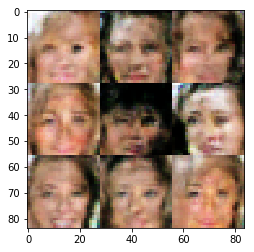

Epoch 1/1: Discriminator Loss: 1.626577 Generator Loss: 0.513270 Difference: -1.113307
Epoch 1/1: Discriminator Loss: 0.489469 Generator Loss: 3.174530 Difference: 2.685061
Epoch 1/1: Discriminator Loss: 0.618577 Generator Loss: 4.599926 Difference: 3.981349
Epoch 1/1: Discriminator Loss: 0.624441 Generator Loss: 2.715282 Difference: 2.090841
Epoch 1/1: Discriminator Loss: 1.435438 Generator Loss: 2.341436 Difference: 0.905997
Epoch 1/1: Discriminator Loss: 0.751624 Generator Loss: 1.367788 Difference: 0.616164
Tensor("generator_193/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_193/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_193/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_193/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_193/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_193/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


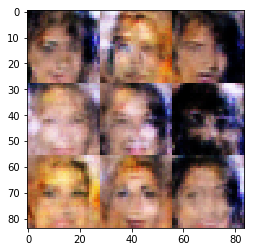

Epoch 1/1: Discriminator Loss: 1.001125 Generator Loss: 1.461941 Difference: 0.460817
Epoch 1/1: Discriminator Loss: 0.738324 Generator Loss: 0.813655 Difference: 0.075331
Epoch 1/1: Discriminator Loss: 0.369086 Generator Loss: 6.821929 Difference: 6.452843
Epoch 1/1: Discriminator Loss: 0.478546 Generator Loss: 4.470331 Difference: 3.991785
Epoch 1/1: Discriminator Loss: 1.078514 Generator Loss: 1.441108 Difference: 0.362595
Epoch 1/1: Discriminator Loss: 0.710932 Generator Loss: 2.491210 Difference: 1.780277
Tensor("generator_194/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_194/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_194/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_194/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_194/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_194/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


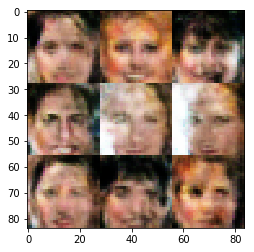

Epoch 1/1: Discriminator Loss: 0.711643 Generator Loss: 1.650049 Difference: 0.938406
Epoch 1/1: Discriminator Loss: 3.091252 Generator Loss: 7.875893 Difference: 4.784640
Epoch 1/1: Discriminator Loss: 0.371652 Generator Loss: 4.998605 Difference: 4.626953
Epoch 1/1: Discriminator Loss: 0.775403 Generator Loss: 3.117090 Difference: 2.341687
Epoch 1/1: Discriminator Loss: 1.394179 Generator Loss: 0.408179 Difference: -0.986000
Epoch 1/1: Discriminator Loss: 1.074856 Generator Loss: 3.713576 Difference: 2.638720
Tensor("generator_195/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_195/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_195/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_195/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_195/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_195/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


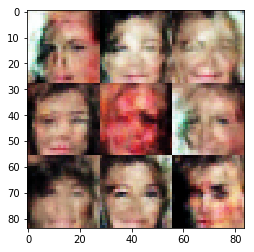

Epoch 1/1: Discriminator Loss: 0.515025 Generator Loss: 2.148992 Difference: 1.633967
Epoch 1/1: Discriminator Loss: 0.376000 Generator Loss: 5.683824 Difference: 5.307824
Epoch 1/1: Discriminator Loss: 0.384540 Generator Loss: 3.663437 Difference: 3.278897
Epoch 1/1: Discriminator Loss: 0.500938 Generator Loss: 1.325104 Difference: 0.824166
Epoch 1/1: Discriminator Loss: 0.860300 Generator Loss: 5.382384 Difference: 4.522083
Epoch 1/1: Discriminator Loss: 0.581827 Generator Loss: 3.263159 Difference: 2.681333
Tensor("generator_196/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_196/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_196/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_196/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_196/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_196/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


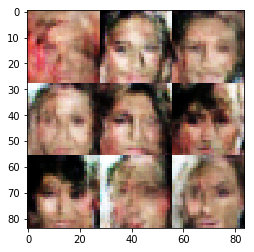

Epoch 1/1: Discriminator Loss: 0.402526 Generator Loss: 2.843548 Difference: 2.441022
Epoch 1/1: Discriminator Loss: 1.320204 Generator Loss: 1.196424 Difference: -0.123780
Epoch 1/1: Discriminator Loss: 0.469142 Generator Loss: 1.472272 Difference: 1.003130
Epoch 1/1: Discriminator Loss: 0.689493 Generator Loss: 0.581635 Difference: -0.107858
Epoch 1/1: Discriminator Loss: 1.948127 Generator Loss: 0.228918 Difference: -1.719209
Epoch 1/1: Discriminator Loss: 0.356024 Generator Loss: 2.300727 Difference: 1.944703
Tensor("generator_197/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_197/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_197/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_197/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_197/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_197/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


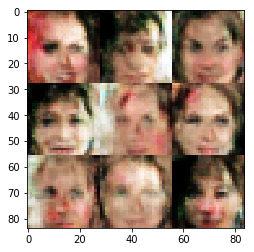

Epoch 1/1: Discriminator Loss: 0.722997 Generator Loss: 1.711438 Difference: 0.988442
Epoch 1/1: Discriminator Loss: 0.385247 Generator Loss: 3.128545 Difference: 2.743298
Epoch 1/1: Discriminator Loss: 0.994335 Generator Loss: 2.414428 Difference: 1.420093
Epoch 1/1: Discriminator Loss: 0.369537 Generator Loss: 4.801324 Difference: 4.431787
Epoch 1/1: Discriminator Loss: 0.385464 Generator Loss: 3.688990 Difference: 3.303526
Epoch 1/1: Discriminator Loss: 0.531988 Generator Loss: 2.380103 Difference: 1.848115
Tensor("generator_198/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_198/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_198/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_198/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_198/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_198/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


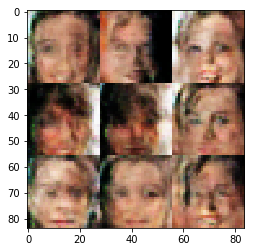

Epoch 1/1: Discriminator Loss: 0.689285 Generator Loss: 1.867183 Difference: 1.177898
Epoch 1/1: Discriminator Loss: 0.510976 Generator Loss: 4.003309 Difference: 3.492333
Epoch 1/1: Discriminator Loss: 0.604120 Generator Loss: 2.780958 Difference: 2.176838
Epoch 1/1: Discriminator Loss: 0.374357 Generator Loss: 4.626740 Difference: 4.252382
Epoch 1/1: Discriminator Loss: 0.407263 Generator Loss: 4.264330 Difference: 3.857067
Epoch 1/1: Discriminator Loss: 0.884568 Generator Loss: 1.743290 Difference: 0.858722
Tensor("generator_199/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_199/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_199/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_199/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_199/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_199/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


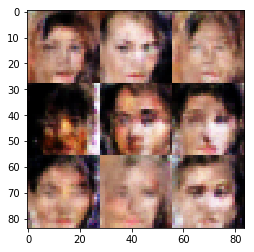

Epoch 1/1: Discriminator Loss: 0.537846 Generator Loss: 2.622340 Difference: 2.084494
Epoch 1/1: Discriminator Loss: 0.416670 Generator Loss: 2.255043 Difference: 1.838373
Epoch 1/1: Discriminator Loss: 0.507765 Generator Loss: 1.922261 Difference: 1.414497
Epoch 1/1: Discriminator Loss: 1.605387 Generator Loss: 1.179810 Difference: -0.425577
Epoch 1/1: Discriminator Loss: 0.646922 Generator Loss: 2.109172 Difference: 1.462250
Epoch 1/1: Discriminator Loss: 0.444802 Generator Loss: 2.992231 Difference: 2.547430
Tensor("generator_200/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_200/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_200/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_200/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_200/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_200/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


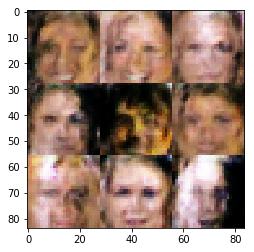

Epoch 1/1: Discriminator Loss: 0.454347 Generator Loss: 3.119747 Difference: 2.665400
Epoch 1/1: Discriminator Loss: 0.400510 Generator Loss: 2.057297 Difference: 1.656787
Epoch 1/1: Discriminator Loss: 1.024186 Generator Loss: 1.387070 Difference: 0.362884
Epoch 1/1: Discriminator Loss: 0.356469 Generator Loss: 2.201703 Difference: 1.845234
Epoch 1/1: Discriminator Loss: 0.736654 Generator Loss: 2.869761 Difference: 2.133108
Epoch 1/1: Discriminator Loss: 0.354175 Generator Loss: 4.967029 Difference: 4.612854
Tensor("generator_201/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_201/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_201/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_201/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_201/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_201/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


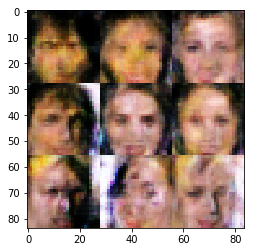

Epoch 1/1: Discriminator Loss: 0.511686 Generator Loss: 1.724351 Difference: 1.212665
Epoch 1/1: Discriminator Loss: 0.451812 Generator Loss: 6.040494 Difference: 5.588682
Epoch 1/1: Discriminator Loss: 0.694315 Generator Loss: 1.692721 Difference: 0.998405
Epoch 1/1: Discriminator Loss: 3.099904 Generator Loss: 7.326288 Difference: 4.226384
Epoch 1/1: Discriminator Loss: 0.855237 Generator Loss: 1.942054 Difference: 1.086817
Epoch 1/1: Discriminator Loss: 1.787257 Generator Loss: 0.641911 Difference: -1.145346
Tensor("generator_202/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_202/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_202/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_202/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_202/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_202/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


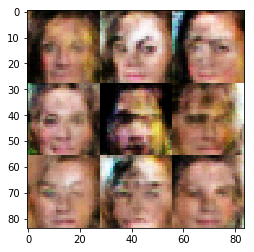

Epoch 1/1: Discriminator Loss: 0.348580 Generator Loss: 4.565469 Difference: 4.216888
Epoch 1/1: Discriminator Loss: 1.136908 Generator Loss: 0.852001 Difference: -0.284907
Epoch 1/1: Discriminator Loss: 2.349858 Generator Loss: 0.767259 Difference: -1.582599
Epoch 1/1: Discriminator Loss: 0.905158 Generator Loss: 0.879777 Difference: -0.025382
Epoch 1/1: Discriminator Loss: 2.785300 Generator Loss: 0.147789 Difference: -2.637512
Epoch 1/1: Discriminator Loss: 1.438325 Generator Loss: 0.405082 Difference: -1.033243
Tensor("generator_203/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_203/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_203/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_203/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_203/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_203/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


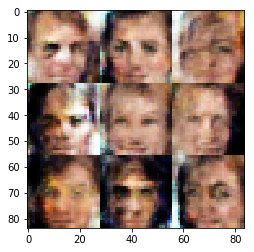

Epoch 1/1: Discriminator Loss: 0.371971 Generator Loss: 6.194945 Difference: 5.822974
Epoch 1/1: Discriminator Loss: 0.738988 Generator Loss: 2.801383 Difference: 2.062394
Epoch 1/1: Discriminator Loss: 0.358514 Generator Loss: 4.237469 Difference: 3.878955
Epoch 1/1: Discriminator Loss: 1.720248 Generator Loss: 0.999976 Difference: -0.720272
Epoch 1/1: Discriminator Loss: 2.129199 Generator Loss: 9.586988 Difference: 7.457789
Epoch 1/1: Discriminator Loss: 0.469300 Generator Loss: 5.326222 Difference: 4.856922
Tensor("generator_204/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_204/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_204/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_204/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_204/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_204/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


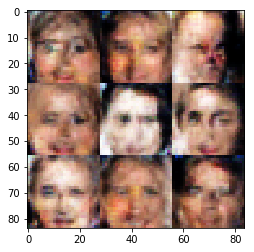

Epoch 1/1: Discriminator Loss: 0.528150 Generator Loss: 0.978261 Difference: 0.450110
Epoch 1/1: Discriminator Loss: 0.969247 Generator Loss: 0.857144 Difference: -0.112103
Epoch 1/1: Discriminator Loss: 0.441092 Generator Loss: 2.093734 Difference: 1.652642
Epoch 1/1: Discriminator Loss: 0.480593 Generator Loss: 2.227746 Difference: 1.747153
Epoch 1/1: Discriminator Loss: 0.632315 Generator Loss: 5.574575 Difference: 4.942261
Epoch 1/1: Discriminator Loss: 0.485721 Generator Loss: 6.244159 Difference: 5.758437
Tensor("generator_205/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_205/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_205/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_205/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_205/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_205/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


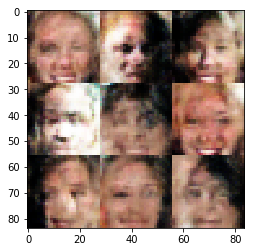

Epoch 1/1: Discriminator Loss: 0.558196 Generator Loss: 3.930444 Difference: 3.372248
Epoch 1/1: Discriminator Loss: 0.840600 Generator Loss: 1.519289 Difference: 0.678689
Epoch 1/1: Discriminator Loss: 0.993706 Generator Loss: 1.929801 Difference: 0.936095
Epoch 1/1: Discriminator Loss: 0.465701 Generator Loss: 4.266231 Difference: 3.800530
Epoch 1/1: Discriminator Loss: 0.573889 Generator Loss: 1.741072 Difference: 1.167184
Epoch 1/1: Discriminator Loss: 0.488332 Generator Loss: 4.266837 Difference: 3.778505
Tensor("generator_206/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_206/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_206/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_206/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_206/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_206/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


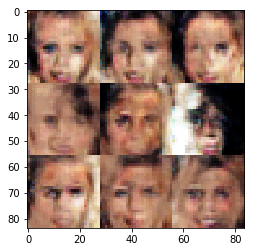

Epoch 1/1: Discriminator Loss: 0.430221 Generator Loss: 5.373885 Difference: 4.943664
Epoch 1/1: Discriminator Loss: 0.450149 Generator Loss: 2.165777 Difference: 1.715628
Epoch 1/1: Discriminator Loss: 0.431662 Generator Loss: 3.969543 Difference: 3.537881
Epoch 1/1: Discriminator Loss: 0.480477 Generator Loss: 2.159871 Difference: 1.679393
Epoch 1/1: Discriminator Loss: 0.402130 Generator Loss: 2.008601 Difference: 1.606471
Epoch 1/1: Discriminator Loss: 2.936173 Generator Loss: 0.078401 Difference: -2.857772
Tensor("generator_207/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_207/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_207/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_207/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_207/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_207/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


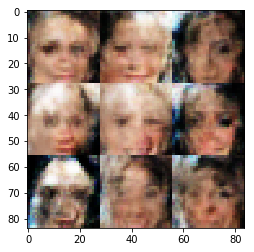

Epoch 1/1: Discriminator Loss: 0.593522 Generator Loss: 2.616593 Difference: 2.023071
Epoch 1/1: Discriminator Loss: 0.685100 Generator Loss: 5.132986 Difference: 4.447886
Epoch 1/1: Discriminator Loss: 0.482417 Generator Loss: 5.283870 Difference: 4.801453
Epoch 1/1: Discriminator Loss: 0.500943 Generator Loss: 1.725260 Difference: 1.224316
Epoch 1/1: Discriminator Loss: 0.414679 Generator Loss: 5.432498 Difference: 5.017819
Epoch 1/1: Discriminator Loss: 0.424211 Generator Loss: 3.190381 Difference: 2.766170
Tensor("generator_208/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_208/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_208/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_208/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_208/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_208/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


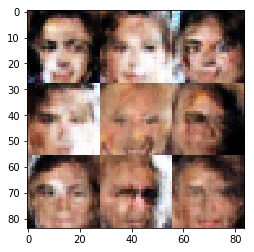

Epoch 1/1: Discriminator Loss: 0.506447 Generator Loss: 2.981014 Difference: 2.474568
Epoch 1/1: Discriminator Loss: 0.835923 Generator Loss: 2.516546 Difference: 1.680623
Epoch 1/1: Discriminator Loss: 0.373341 Generator Loss: 3.417950 Difference: 3.044609
Epoch 1/1: Discriminator Loss: 0.632971 Generator Loss: 1.778098 Difference: 1.145127
Epoch 1/1: Discriminator Loss: 1.051019 Generator Loss: 4.655893 Difference: 3.604875
Epoch 1/1: Discriminator Loss: 0.414632 Generator Loss: 2.874784 Difference: 2.460152
Tensor("generator_209/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_209/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_209/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_209/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_209/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_209/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


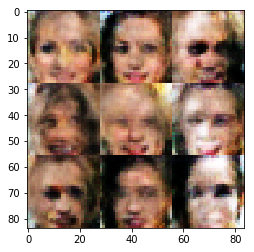

Epoch 1/1: Discriminator Loss: 0.668074 Generator Loss: 1.927022 Difference: 1.258948
Epoch 1/1: Discriminator Loss: 0.358458 Generator Loss: 3.644799 Difference: 3.286341
Epoch 1/1: Discriminator Loss: 0.850634 Generator Loss: 2.053772 Difference: 1.203138
Epoch 1/1: Discriminator Loss: 0.396060 Generator Loss: 3.458093 Difference: 3.062033
Epoch 1/1: Discriminator Loss: 0.442214 Generator Loss: 3.357811 Difference: 2.915597
Epoch 1/1: Discriminator Loss: 0.494156 Generator Loss: 3.592452 Difference: 3.098296
Tensor("generator_210/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_210/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_210/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_210/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_210/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_210/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


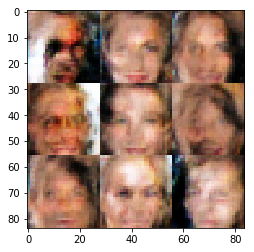

Epoch 1/1: Discriminator Loss: 0.375912 Generator Loss: 2.790263 Difference: 2.414351
Epoch 1/1: Discriminator Loss: 0.510407 Generator Loss: 1.911904 Difference: 1.401497
Epoch 1/1: Discriminator Loss: 0.413903 Generator Loss: 2.466767 Difference: 2.052864
Epoch 1/1: Discriminator Loss: 0.436070 Generator Loss: 5.132165 Difference: 4.696095
Epoch 1/1: Discriminator Loss: 0.470596 Generator Loss: 2.234140 Difference: 1.763545
Epoch 1/1: Discriminator Loss: 0.495311 Generator Loss: 4.063993 Difference: 3.568683
Tensor("generator_211/dropout/mul:0", shape=(?, 7, 7, 512), dtype=float32)
Tensor("generator_211/dropout_1/mul:0", shape=(?, 7, 7, 256), dtype=float32)
Tensor("generator_211/dropout_2/mul:0", shape=(?, 7, 7, 128), dtype=float32)
Tensor("generator_211/dropout_3/mul:0", shape=(?, 7, 7, 64), dtype=float32)
Tensor("generator_211/dropout_4/mul:0", shape=(?, 14, 14, 32), dtype=float32)
Tensor("generator_211/Tanh:0", shape=(?, 28, 28, 3), dtype=float32)


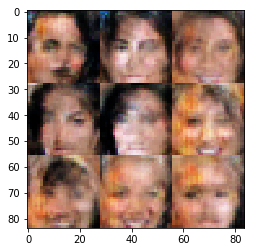

Epoch 1/1: Discriminator Loss: 0.552571 Generator Loss: 3.569681 Difference: 3.017110


In [20]:
batch_size = 32
z_dim = 128
learning_rate = .0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.